<a href="https://colab.research.google.com/github/lonnie-nguyen/pratt_data_analysis/blob/main/pratt_seq_logo_unaligned_seq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started
Connect to a runtime and upload the data file to be analyzed. Then run each code cell sequentially or navigate to Runtime -> Run all.

This notebook uses the Python package Logomaker to generate sequence logos. The package is also used to calculate the Position Probability Matrices (PPM), Position Weight Matrices (PWM), and Information Content Matrices (IC).

## Links for Logomaker
* Github: https://github.com/jbkinney/logomaker
* Documentation: https://logomaker.readthedocs.io/en/latest/
* Article: https://academic.oup.com/bioinformatics/article/36/7/2272/5671693




In [1]:
!pip install logomaker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.8 MB 12.9 MB/s 


In [2]:
import string
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import logomaker as lm

# ---------------------------------------------
# Global data structures
# ---------------------------------------------
obs_freq = []
flank1_seq_list = []
pf2_seq_list = []
x_axis = []

# Function Definitions

## Align Sequences

For each pattern block, all sequences must be the same length and aligned to get the correct amino acid frequencies per position. The function `pad_sequence()` left pads the strings in `flank1_seq_list` and right pads the strings in `pf2_seq_list` with `*`. After padding, the sequences are aligned and concatenated then added the list `combined_sequences` using Python list comprehension.

The images below are used as illustrative examples:

From 
<img src='https://drive.google.com/uc?export=view&id=1UqvQImaZr_LlTwCzD6Zt4VWkQNBJ3btS' width=150px> 
To 
<img src='https://drive.google.com/uc?export=view&id=12FIIB-VdaG0R2t8hcWXGjC1vAbF6NiOB' width=150px>

**Note**: the function `pad_sequence()` also creates the following list
* `x_axis`: list of negative and positive positions to be used for the x-axis of the sequence logo

In [3]:
def pad_sequence(seq_list: list, direction: string) -> list:
  padded = []
  max_len_seq = max(seq_list, key = len)
  max_len = len(max_len_seq)
  if direction == 'left':
    x_axis.extend([i - len(max_len_seq) for i in range(len(max_len_seq))]) # Numbers for x axis of graph
  else:
    x_axis.extend([i for i in range(len(max_len_seq))])
  for seq in seq_list:
    if len(seq) < max_len:
      if direction == 'left':
        seq = seq.rjust(len(seq) + (max_len - len(seq)), '*')
      else:
        seq = seq.ljust(len(seq) + (max_len - len(seq)), '*')
    seq = seq.upper()
    padded.append(seq)
    
  return padded

## Create Matrices

Before sequence logos for multiple sequence alignments (MSA) can be generated, different matrices need to be calculated:

* Postion Frequency Matirx (PFM)
* Position Probability Matrix (PPM)
* Position Weight Matrix (PWM)
* Information Content Matrix (ICM)

### PFM

The function `frequency_matrix()` creates a Pandas DataFrame (matrix) with dimensions $m * n$ where $m = \text{length of the sequence}$ and $n = 20$ (for $20$ amino acids). The DataFrame is initialized with values of $0$. Then frequencies are added up for each amino acid at each position and multiplied by a corresponding value fromt the list `obs_freq`.

In [4]:
def frequency_matrix(combined_sequences: list):
  char_array = np.array([np.array(list(seq)) for seq in combined_sequences])
  columns = [c for c in 'ACDEFGHIKLMNPQRSTVWY']
  index = list(range(len(combined_sequences[0])))
  counts_df = pd.DataFrame(data=0, columns=columns, index=index)
  counts = np.array(obs_freq)
  # Calculate frequencies of each amino acid at each position
  for aa in columns:
    temp_matrix = (char_array == aa).astype(float) * counts[:, np.newaxis]
    counts_df.loc[:, aa] = temp_matrix.sum(axis=0).T
  return counts_df

### PPM

The function `probability_matrix()` creates a DataFrame (matrix) using the probabilities of each amino acid at each position from the PFM. By default, Logomaker sets $pseudocount = 1$ to correct for values where the $frequency = 0$. 

Logomaker uses the following formula (found in file **matrix.py** under the function `transform_matrix()`) to calculate the PPM:

\begin{align}
        PPM_{ic} = \frac{PFM_{ic} + α}{PFM_{i} + 20 * α} \\[1em]
    \end{align}

* Where pseudocount variable $α ≥ 0$.
* Notation:
  * $i = \text{position}$
  * $c = \text{character}$

In [5]:
def probability_matrix(counts_df, pseudocount = 1):
  # Use logomaker for PPM w/ pseudocount = 1 if no value is given
  prob_df = lm.transform_matrix(counts_df, 
                              from_type='counts', 
                              to_type='probability',
                              pseudocount=pseudocount)
  return prob_df

### PWM

The function `weight_matrix()` creates a DataFrame (matrix) using the values from the PPM with $pseudocount = 1$. The values of a PWM are used to score how well a sequence matches a motif by adding up the values for the amino acids at specific positions. 

By default, Logomaker assumes a uniform distribution background probability of $1/20 = 0.05$ for each amino acid. The background can also be user submitted as a list. This notebook uses the following background probabilities:

Amino Acid | Frequency | Amino Acid | Frequency
:--- | :---: | :---: | ---:
A | 0.069 | M | 0.029 
C | 0.010 | N | 0.048 
D | 0.039 | P | 0.103 
E | 0.027 | Q | 0.036 
F | 0.031 | R | 0.052 
G | 0.042 | S | 0.109 
H | 0.052 | T | 0.092 
I | 0.035 | V | 0.050 
K | 0.025 | W | 0.019
L | 0.092 | Y | 0.038

Logomaker uses the following formula to calculate the PWM:

\begin{align}
        PWM_{ic} = \log_2\left(\frac{PPM_{ic}}{background_{ic}}\right) \\[1em]
    \end{align}

* Notation:
  * $i = \text{position}$
  * $c = \text{character}$

In [6]:
background = [0.069, 0.010, 0.039, 0.027, 0.031, 0.042, 0.052,
              0.035, 0.025, 0.092, 0.029, 0.048, 0.103, 0.036, 
              0.052, 0.109, 0.092, 0.050, 0.019, 0.038]
              
def weight_matrix(prob_df): 
  # Use logomaker to get PWM w/ a non-uniform background
  weight_df = lm.transform_matrix(prob_df, 
                              from_type='probability', 
                              to_type='weight',
                              background=background)
  return weight_df

### ICM

The function `info_content_matrix()` creates a DataFrame (matrix) using the values from the PPM with $pseudocount = 0$. The information (values) for each amino acid at a specific position indicate the level of conservation or relative entropy.

Logomaker uses the following formula to calculate the ICM:

\begin{align}
        ICM_{ic} = PPM_{ic} * \sum_i{PPM_{id}} * \log_2\left(\frac{PPM_{id}}{PWM_{id}}\right) \\[1em]
    \end{align}

* Notation:
  * $i = \text{position}$
  * $c, d = \text{character}$

In [7]:
def info_content_matrix(prob_df):
  # Use logomaker to get Information Content
  info_df = lm.transform_matrix(prob_df,
                                from_type='probability',
                                to_type='information',
                                background=background)
  return info_df

## Matrix Transformations

Use this function to center values of PWM with `transform_type = 'center'` or normalize values of PPM with `transform_type = 'normalize'` before graphing.

In [8]:
def transform_matrix(df, transform_type):
  """
  Use to center values of PWM or normalize values of PPM before graphing
  """
  if transform_type == 'center':
    return lm.transform_matrix(df, center_values=True)
  else:
    return lm.transform_matrix(df, normalize_values=True)

## Display Matrix

In [9]:
def display_matrix(df, title):
  # Label DataFrame table
  df.index.names = ['Position']
  df.columns.names = ['Amino Acid']
  pd.set_option('display.max_columns', None)
  print(title)
  display(df)

## Display Sequence Logo

In [10]:
def display_matrix(df, title):
  # Label DataFrame table
  df.index.names = ['Position']
  df.columns.names = ['Amino Acid']
  pd.set_option('display.max_columns', None)
  print(title)
  display(df)

def display_sequence_logo(df, graph_type, pattern):
  logo = lm.Logo(df,
                color_scheme='skylign_protein',
                center_values=False,
                shade_below=0.5,
                fade_below=0.5,
                figsize=(15, 8))
  logo.ax.set_xticks(range(len(df)))
  logo.ax.set_xticklabels('%d'%x for x in x_axis)
  if graph_type == 'PPM':
    y = 'probability'
  elif graph_type == 'PWM':
    y = '$\log_2$ enrichment'
  elif graph_type == 'ICM':
    y = 'bits'
  else:
    y = ''
  logo.ax.set_ylabel('{}'.format(y), fontsize=14)
  logo.ax.set_xlabel('position', fontsize=14)
  logo.ax.set_title('{} Sequence Logo for Pattern {}'.format(graph_type, pattern), fontsize=14)
  plt.show()

# Main Python Script
The following script takes an uploaded Pratt sequence data file as input and parses the file line by line. Each line is broken up into an array of tokens which are processed according to the length of the array. The script identifies pattern sequence blocks in the Pratt file and creates a frequency matrix of amino acid occurrences at positions in the sequences.


----------------------------------------------------------------------
A Pattern: S-S-E-F-R-[AGLV]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.115385,0.000000,0.000000,0.000000,0.769231,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.115385,0.000000,0.000000,0.0
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.096774,0.096774,0.00000,0.451613,0.0,0.000000,0.000000,0.064516,0.000000,0.000000,0.290323,0.000000,0.000000,0.0
2,0.048387,0.0,0.000000,0.048387,0.000000,0.677419,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.048387,0.000000,0.048387,0.000000,0.032258,0.096774,0.0
3,0.274194,0.0,0.048387,0.000000,0.048387,0.000000,0.000000,0.048387,0.00000,0.451613,0.0,0.000000,0.000000,0.000000,0.048387,0.048387,0.000000,0.000000,0.032258,0.0
4,0.000000,0.0,0.041667,0.000000,0.041667,0.027778,0.000000,0.041667,0.00000,0.083333,0.0,0.138889,0.000000,0.000000,0.000000,0.583333,0.041667,0.000000,0.000000,0.0
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
8,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.669190,1.117406,1.153932,-0.315553,-0.514862,-0.952983,3.131212,-0.689949,-0.204522,-2.084228,-0.418647,-1.145628,-2.247166,-0.730591,-1.261106,-2.328850,-0.084228,-1.204522,0.191407,-0.808593
1,-1.818054,0.968543,-0.994932,-0.464417,-0.663726,-1.101847,0.590031,1.161188,-0.353386,1.673799,-0.567510,-1.294492,-2.396030,0.705508,-1.409969,-2.477714,1.088837,-1.353386,0.042543,-0.957457
2,-0.503180,0.283416,-1.680058,0.850456,-1.348852,3.639291,-2.095096,-1.523939,-1.038512,-2.918218,-1.252637,-1.979619,-3.081157,0.435419,-2.095096,-1.162840,-2.918218,-0.453550,2.164771,-1.642584
3,1.666745,0.283416,0.319942,-1.149544,0.651148,-1.786973,-2.095096,0.476061,-1.038512,1.939763,-1.252637,-1.979619,-3.081157,-1.564581,-0.095096,-1.162840,-2.918218,-2.038512,0.942379,-1.642584
4,-2.669190,0.117406,0.153932,-1.315553,0.485138,-0.368021,-2.261106,0.310051,-1.204522,-0.276873,-1.418647,1.313803,-3.247166,-1.730591,-2.261106,2.097414,-1.084228,-2.204522,-0.808593,-1.808593
5,-2.818054,-0.031457,-1.994932,-1.464417,-1.663726,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,2.897326,-3.233091,-2.353386,-0.957457,-1.957457
6,-2.818054,-0.031457,-1.994932,-1.464417,-1.663726,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,2.897326,-3.233091,-2.353386,-0.957457,-1.957457
7,-2.818054,-0.031457,-1.994932,4.910623,-1.663726,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,-3.477714,-3.233091,-2.353386,-0.957457,-1.957457
8,-2.818054,-0.031457,-1.994932,-1.464417,4.711314,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,-3.477714,-3.233091,-2.353386,-0.957457,-1.957457


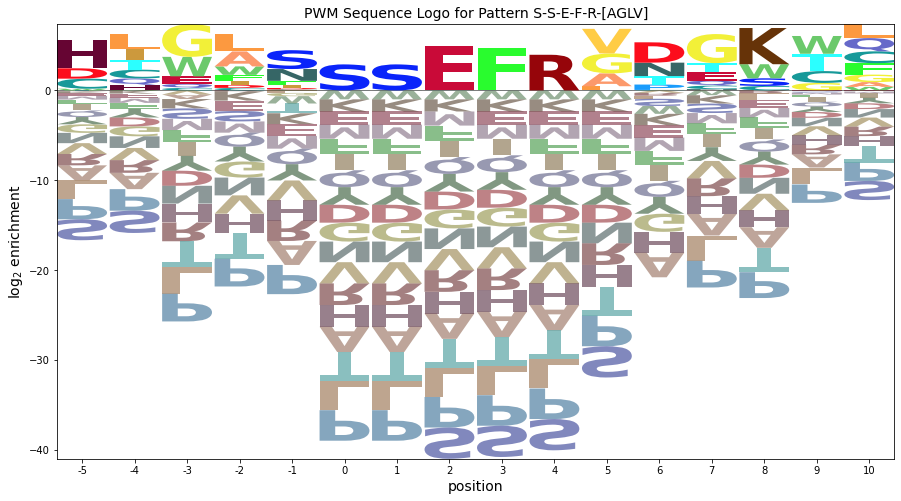

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.369837,0.000000,0.000000,0.000000,2.465577,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.369837,0.000000,0.000000,0.0
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.174009,0.174009,0.000000,0.812041,0.0,0.000000,0.000000,0.116006,0.000000,0.000000,0.522026,0.000000,0.000000,0.0
2,0.140392,0.0,0.000000,0.140392,0.000000,1.965487,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.140392,0.000000,0.140392,0.000000,0.093595,0.280784,0.0
3,0.441777,0.0,0.077961,0.000000,0.077961,0.000000,0.000000,0.077961,0.000000,0.727633,0.0,0.000000,0.000000,0.000000,0.077961,0.077961,0.000000,0.000000,0.051974,0.0
4,0.000000,0.0,0.065743,0.000000,0.065743,0.043828,0.000000,0.065743,0.000000,0.131485,0.0,0.219142,0.000000,0.000000,0.000000,0.920396,0.065743,0.000000,0.000000,0.0
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.0
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.0
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
8,0.000000,0.0,0.000000,0.000000,5.008700,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


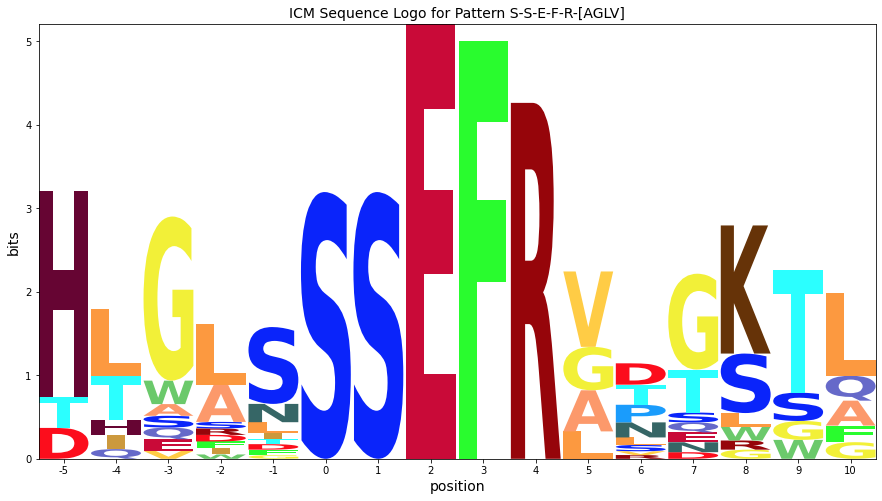

----------------------------------------------------------------------
B Pattern: S-A-E-F-R-[AGPST]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.150000,0.000000,0.100000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.115385,0.000000,0.153846,0.076923,0.000000,0.000000,0.384615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.192308,0.076923,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.095238,0.119048,0.190476,0.166667,0.000000,0.000000,0.166667,0.000000,0.166667,0.047619,0.047619,0.000000
3,0.148936,0.0,0.191489,0.000000,0.000000,0.361702,0.000000,0.042553,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042553,0.000000,0.063830,0.000000,0.148936
4,0.000000,0.0,0.148936,0.000000,0.000000,0.085106,0.000000,0.085106,0.000000,0.000000,0.000000,0.000000,0.404255,0.000000,0.000000,0.127660,0.148936,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.467557,1.319040,1.355566,-0.113920,1.271734,2.708082,-1.059472,-0.488315,-0.002888,-1.882594,-0.217013,-0.943995,0.539430,-0.528957,-1.059472,-2.127216,-1.882594,-1.002888,0.393040,-0.606960
1,-1.669190,1.117406,-0.846068,1.684447,-0.514862,1.368945,0.323857,-0.689949,-0.204522,1.375204,-0.418647,-1.145628,-2.247166,-0.730591,-1.261106,-2.328850,0.500735,0.380440,0.191407,-0.808593
2,-2.099825,0.686772,-1.276703,-0.746188,-0.945497,-1.383618,-1.691740,-1.120583,1.686772,0.070100,2.320644,1.423737,-2.677801,-1.161225,1.308260,-2.759485,0.485138,-0.050194,1.345735,-1.239228
3,0.788282,0.574879,1.933333,-0.858081,-1.057389,2.674414,-1.803633,0.352486,-0.747049,-2.626755,-0.961174,-1.688156,-2.789694,-1.273118,-1.803633,-1.286415,-2.626755,0.252951,-0.351121,1.648879
4,-2.211718,0.574879,1.611405,-0.858081,-1.057389,0.826417,-1.803633,1.089452,-0.747049,-2.626755,-0.961174,-1.688156,1.532234,-1.273118,-1.803633,-0.064023,0.373245,-1.747049,-0.351121,-1.351121
5,-2.467557,0.319040,-1.644434,-1.113920,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,2.803521,-2.882594,-2.002888,-0.606960,-1.606960
6,3.463181,0.319040,-1.644434,-1.113920,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,-3.127216,-2.882594,-2.002888,-0.606960,-1.606960
7,-2.467557,0.319040,-1.644434,4.816818,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,-3.127216,-2.882594,-2.002888,-0.606960,-1.606960
8,-2.467557,0.319040,-1.644434,-1.113920,4.617509,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,-3.127216,-2.882594,-2.002888,-0.606960,-1.606960


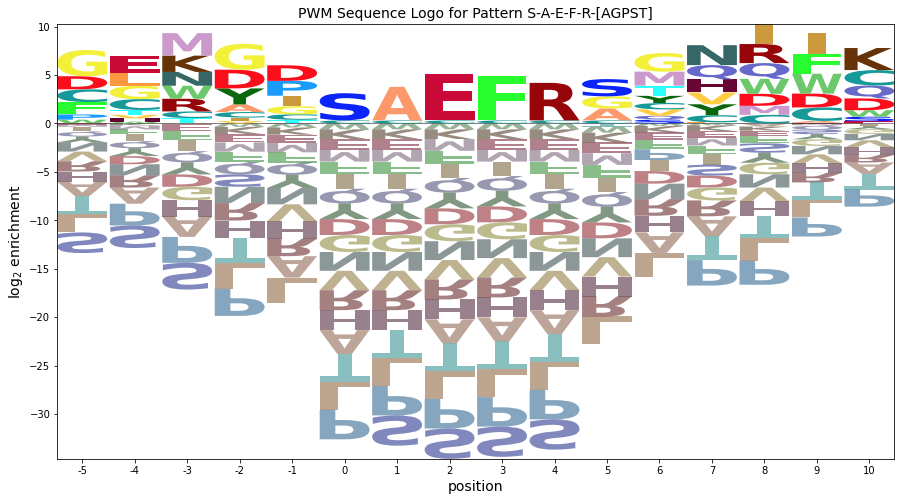

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.384622,0.000000,0.256414,1.282072,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.641036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.186531,0.000000,0.248708,0.124354,0.000000,0.000000,0.621771,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.310885,0.124354,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.145181,0.181477,0.290363,0.254067,0.000000,0.000000,0.254067,0.000000,0.254067,0.072591,0.072591,0.000000
3,0.297254,0.0,0.382183,0.000000,0.000000,0.721902,0.000000,0.084930,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.084930,0.000000,0.127394,0.000000,0.297254
4,0.000000,0.0,0.210133,0.000000,0.000000,0.120076,0.000000,0.120076,0.000000,0.000000,0.000000,0.000000,0.570362,0.000000,0.000000,0.180114,0.210133,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,5.008700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


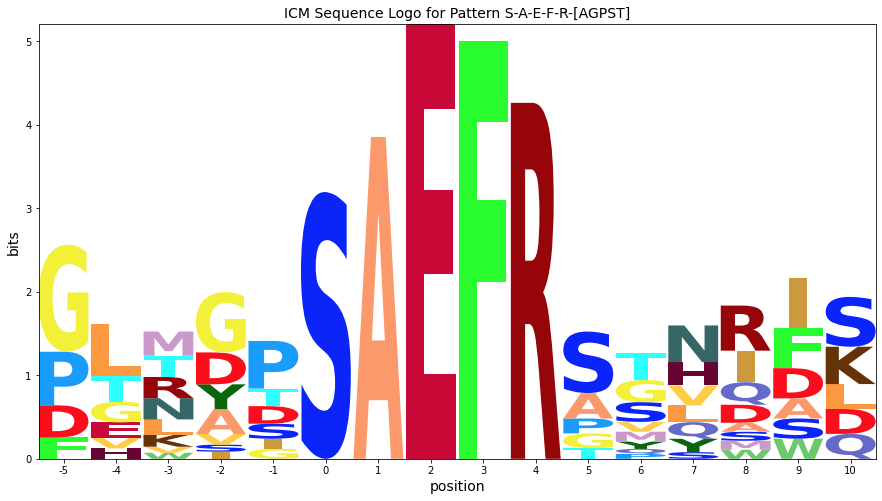

----------------------------------------------------------------------
C Pattern: S-[DS]-A-E-[FHWY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.536585,0.000000,0.000000,0.000000,0.000000,0.000000,0.195122,0.000000,0.000000,0.000000,0.000000,0.000000,0.04878,0.000000,0.146341,0.000000,0.000000,0.073171,0.000000
1,0.052632,0.000000,0.122807,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.052632,0.087719,0.000000,0.385965,0.00000,0.070175,0.052632,0.000000,0.122807,0.000000,0.000000
2,0.385965,0.000000,0.000000,0.052632,0.000000,0.122807,0.000000,0.035088,0.000000,0.052632,0.035088,0.070175,0.000000,0.00000,0.000000,0.052632,0.000000,0.052632,0.087719,0.052632
3,0.000000,0.385965,0.052632,0.052632,0.000000,0.000000,0.070175,0.000000,0.087719,0.052632,0.052632,0.105263,0.052632,0.00000,0.035088,0.000000,0.000000,0.000000,0.000000,0.052632
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,0.050000,0.000000,0.066667,0.100000,0.366667,0.116667,0.083333,0.00000,0.000000,0.050000,0.033333,0.050000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.328947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.671053,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.076366,5.233793,-1.253244,-0.722729,-0.922038,-1.360159,-1.668281,2.072801,-0.611698,-2.491403,-0.825822,-1.552804,-2.654342,0.447196,-1.668281,0.071329,-2.491403,-1.611698,1.784231,-1.215769
1,-0.412415,0.374181,1.410707,-1.058778,-1.258087,0.303792,-2.004330,-1.433174,-0.947747,-0.827452,1.423091,-1.888853,1.533171,-1.473816,0.317598,-1.072075,-2.827452,1.052253,-0.551818,-1.551818
2,2.111147,0.374181,-1.589293,0.941222,-1.258087,1.303792,-2.004330,0.151789,-0.947747,-0.827452,0.423091,0.433075,-2.990391,-1.473816,-2.004330,-1.072075,-2.827452,0.052253,2.033144,0.448182
3,-2.412415,4.897743,0.410707,0.941222,-1.258087,-1.696208,0.317598,-1.433174,1.637216,-0.827452,0.838128,0.918502,-0.990391,-1.473816,-0.419368,-3.072075,-2.827452,-1.947747,-0.551818,0.448182
4,-2.467557,0.319040,-1.644434,-1.113920,-1.313228,0.833613,-0.059472,-1.488315,1.319040,-0.075239,3.306549,1.056005,-0.460570,-1.528957,-2.059472,-1.127216,-1.297632,-0.002888,-0.606960,-1.606960
5,-2.730591,0.056005,-1.907469,-1.376954,-1.576263,-2.014384,-2.322506,-1.751350,-1.265923,-3.145628,-1.480047,-2.207029,-3.308567,-1.791991,-2.322506,2.876536,-3.145628,-2.265923,-0.869994,-1.869994
6,-2.730591,0.056005,2.792971,-1.376954,-1.576263,-2.014384,-2.322506,-1.751350,-1.265923,-3.145628,-1.480047,-2.207029,-3.308567,-1.791991,-2.322506,2.310189,-3.145628,-2.265923,-0.869994,-1.869994
7,3.536196,0.056005,-1.907469,-1.376954,-1.576263,-2.014384,-2.322506,-1.751350,-1.265923,-3.145628,-1.480047,-2.207029,-3.308567,-1.791991,-2.322506,-3.390251,-3.145628,-2.265923,-0.869994,-1.869994
8,-2.730591,0.056005,-1.907469,4.889833,-1.576263,-2.014384,-2.322506,-1.751350,-1.265923,-3.145628,-1.480047,-2.207029,-3.308567,-1.791991,-2.322506,-3.390251,-3.145628,-2.265923,-0.869994,-1.869994


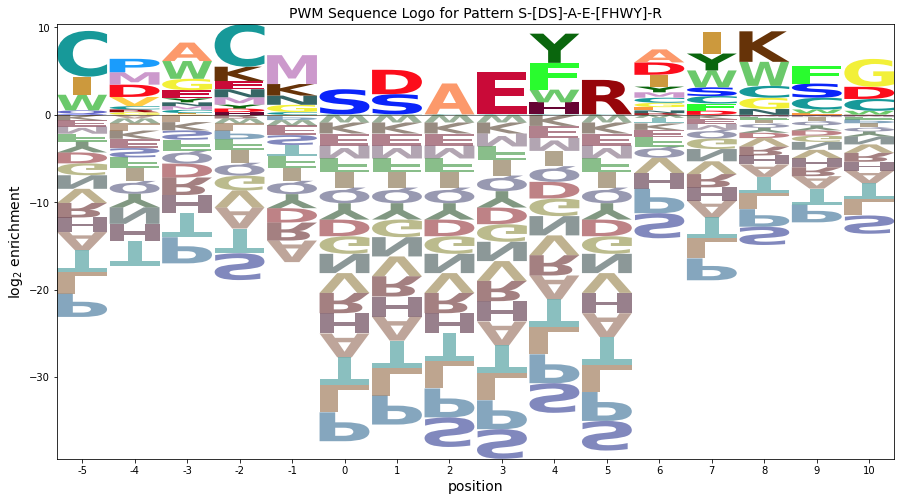

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,2.033552,0.000000,0.000000,0.000000,0.000000,0.000000,0.739473,0.000000,0.000000,0.000000,0.000000,0.000000,0.184868,0.000000,0.554605,0.000000,0.000000,0.277303,0.000000
1,0.061286,0.000000,0.143001,0.000000,0.000000,0.061286,0.000000,0.000000,0.000000,0.061286,0.102143,0.000000,0.449431,0.000000,0.081715,0.061286,0.000000,0.143001,0.000000,0.000000
2,0.528504,0.000000,0.000000,0.072069,0.000000,0.168160,0.000000,0.048046,0.000000,0.072069,0.048046,0.096092,0.000000,0.000000,0.000000,0.072069,0.000000,0.072069,0.120114,0.072069
3,0.000000,0.914694,0.124731,0.124731,0.000000,0.000000,0.166308,0.000000,0.207885,0.124731,0.124731,0.249462,0.124731,0.000000,0.083154,0.000000,0.000000,0.000000,0.000000,0.124731
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.128677,0.077206,0.000000,0.102941,0.154412,0.566178,0.180147,0.128677,0.000000,0.000000,0.077206,0.051471,0.077206,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.910731,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.857891,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


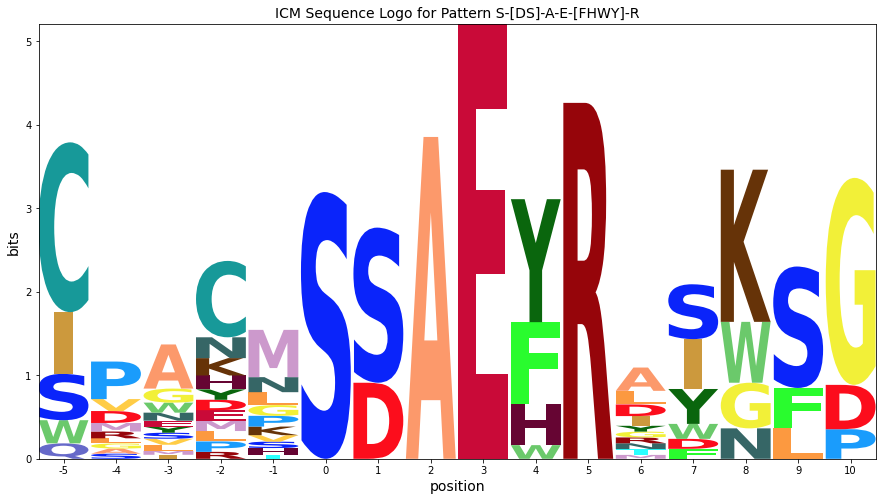

----------------------------------------------------------------------
D Pattern: S-S-[AS]-E-[FHWY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.628571,0.057143,0.000000,0.000000,0.000000,0.000000,0.228571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085714,0.000000,0.000000,0.000000,0.000000
1,0.044776,0.000000,0.104478,0.000000,0.074627,0.044776,0.208955,0.000000,0.000000,0.000000,0.029851,0.000000,0.328358,0.000000,0.059701,0.000000,0.000000,0.104478,0.000000,0.000000
2,0.328358,0.000000,0.000000,0.044776,0.000000,0.059701,0.000000,0.074627,0.000000,0.253731,0.029851,0.059701,0.000000,0.000000,0.000000,0.029851,0.000000,0.044776,0.074627,0.000000
3,0.000000,0.231579,0.000000,0.031579,0.000000,0.463158,0.042105,0.052632,0.052632,0.031579,0.031579,0.042105,0.000000,0.000000,0.021053,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.173469,0.000000,0.000000,0.000000,0.000000,0.051020,0.000000,0.000000,0.040816,0.285714,0.224490,0.122449,0.071429,0.000000,0.000000,0.000000,0.000000,0.030612,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
7,0.510000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.490000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.926988,5.383170,0.481097,-0.573351,-0.772660,-1.210781,-1.518903,2.222178,-0.462320,-2.342026,-0.676445,-1.403426,-2.504964,-0.988389,-1.518903,-0.586648,-2.342026,-1.462320,-0.066391,-1.066391
1,-0.588572,0.198024,1.234550,-1.234935,1.150719,0.127635,1.726403,-1.609331,-1.123904,-3.003609,0.246934,-2.065010,1.357014,-1.649972,0.141441,-3.248232,-3.003609,0.876096,-0.727975,-1.727975
2,1.934990,0.198024,-1.765450,0.765065,-1.434244,0.449563,-2.180487,0.975632,-1.123904,1.166316,0.246934,0.256918,-3.166548,-1.649972,-2.180487,-1.663269,-3.003609,-0.123904,1.856987,-1.727975
3,-2.991119,4.319040,-2.167996,0.362518,-1.836790,3.216942,-0.261106,0.573085,1.058512,-1.406156,0.259425,-0.145628,-3.569095,-2.052519,-0.998071,-3.650778,-3.406156,-2.526450,-1.130522,-2.130522
4,1.141654,-0.241675,-2.205149,-1.674635,-1.873943,0.272898,-2.620187,-2.049030,0.758325,1.414672,2.745834,1.195730,-0.606248,-2.089672,-2.620187,-3.687931,-3.443309,-0.563603,-1.167675,-2.167675
5,-3.052519,-0.265923,-2.229397,-1.698882,-1.898191,-2.336312,-2.644434,-2.073278,-1.587851,-3.467557,-1.801976,-2.528957,-3.630495,-2.113920,-2.644434,2.946033,-3.467557,-2.587851,-1.191922,-2.191922
6,-3.052519,-0.265923,-2.229397,-1.698882,-1.898191,-2.336312,-2.644434,-2.073278,-1.587851,-3.467557,-1.801976,-2.528957,-3.630495,-2.113920,-2.644434,2.946033,-3.467557,-2.587851,-1.191922,-2.191922
7,2.647921,-0.265923,-2.229397,-1.698882,-1.898191,-2.336312,-2.644434,-2.073278,-1.587851,-3.467557,-1.801976,-2.528957,-3.630495,-2.113920,-2.644434,1.931677,-3.467557,-2.587851,-1.191922,-2.191922
8,-3.052519,-0.265923,-2.229397,4.959329,-1.898191,-2.336312,-2.644434,-2.073278,-1.587851,-3.467557,-1.801976,-2.528957,-3.630495,-2.113920,-2.644434,-3.712179,-3.467557,-2.587851,-1.191922,-2.191922


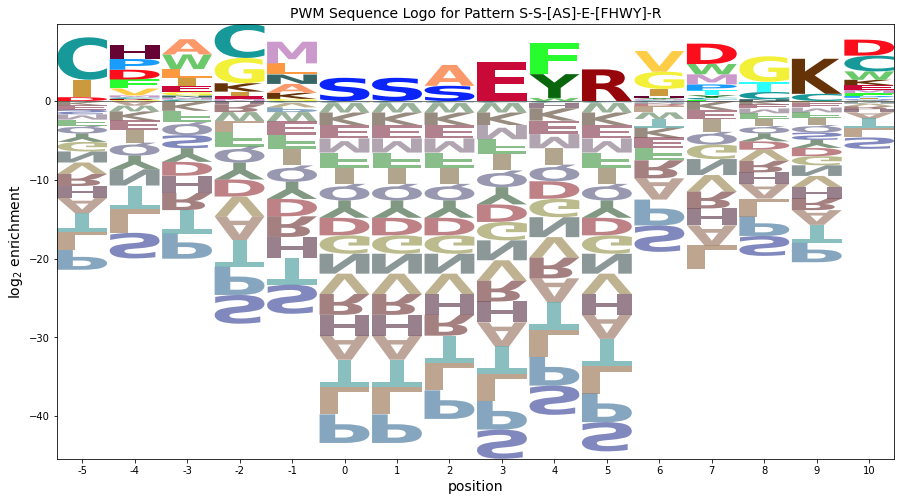

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,2.748596,0.249872,0.000000,0.000000,0.000000,0.000000,0.999489,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.374808,0.000000,0.000000,0.000000,0.000000
1,0.058619,0.000000,0.136778,0.000000,0.097698,0.058619,0.273556,0.000000,0.000000,0.000000,0.039079,0.000000,0.429873,0.000000,0.078159,0.000000,0.000000,0.136778,0.000000,0.000000
2,0.445379,0.000000,0.000000,0.060734,0.000000,0.080978,0.000000,0.101223,0.000000,0.344157,0.040489,0.080978,0.000000,0.000000,0.000000,0.040489,0.000000,0.060734,0.101223,0.000000
3,0.000000,0.614253,0.000000,0.083762,0.000000,1.228506,0.111682,0.139603,0.139603,0.083762,0.083762,0.111682,0.000000,0.000000,0.055841,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.261415,0.000000,0.000000,0.000000,0.000000,0.076887,0.000000,0.000000,0.061509,0.430566,0.338302,0.184528,0.107642,0.000000,0.000000,0.000000,0.000000,0.046132,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
7,1.291028,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.240399,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


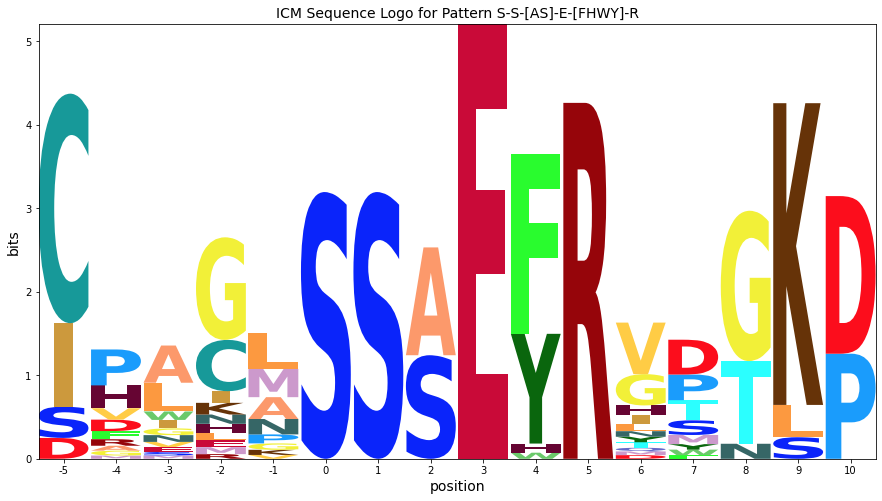

----------------------------------------------------------------------
E Pattern: D-A-E-S-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.04878,0.000000,0.000000,0.170732,0.000000,0.000000,0.170732,0.365854,0.000000,0.097561,0.000000,0.146341,0.000000,0.000000
1,0.268293,0.0,0.048780,0.000000,0.000000,0.000000,0.00000,0.000000,0.097561,0.000000,0.170732,0.000000,0.000000,0.000000,0.048780,0.097561,0.097561,0.170732,0.000000,0.000000
2,0.000000,0.0,0.215686,0.000000,0.078431,0.137255,0.00000,0.000000,0.000000,0.000000,0.039216,0.058824,0.078431,0.000000,0.078431,0.274510,0.000000,0.039216,0.000000,0.000000
3,0.258621,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.172414,0.000000,0.034483,0.068966,0.000000,0.189655,0.034483,0.103448,0.068966,0.000000,0.068966
4,0.095238,0.0,0.031746,0.158730,0.000000,0.095238,0.00000,0.000000,0.000000,0.253968,0.000000,0.031746,0.000000,0.000000,0.000000,0.063492,0.000000,0.063492,0.000000,0.206349
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.076366,0.710231,-1.253244,-0.722729,-0.922038,-1.360159,-0.083319,-1.097124,-0.611698,0.508597,-0.825822,-1.552804,0.345658,2.862234,-1.668281,-0.414098,-2.491403,1.195657,-0.215769,-1.215769
1,1.508597,0.710231,0.331719,-0.722729,-0.922038,-1.360159,-1.668281,-1.097124,1.710231,-2.491403,2.174178,-1.552804,-2.654342,-1.137766,-0.083319,-0.414098,-0.169475,1.388302,-0.215769,-1.215769
2,-2.295376,0.491221,2.112709,-0.941739,1.180881,1.420831,-1.887291,-1.316134,-0.830707,-2.710413,0.540130,0.228186,-0.551424,-1.356776,0.434637,0.951855,-2.710413,-0.245745,-0.434779,-1.434779
3,1.568969,0.355566,-1.607908,-1.077394,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,0.613363,-1.180487,-0.322506,-0.687079,-1.492431,1.562017,-1.505728,-0.038713,0.355566,-0.570434,0.751494
4,0.286687,0.265928,-0.112583,2.292401,-1.366340,1.002894,-2.112583,-1.541426,-1.056000,1.151757,-1.270124,-0.412143,-3.098644,-1.582068,-2.112583,-0.858400,-2.935705,0.265928,-0.660071,2.147284
5,-2.555019,0.231577,4.312497,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
6,3.489375,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
7,-2.555019,0.231577,-1.731897,4.843012,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
8,-2.555019,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,2.829715,-2.970057,-2.090351,-0.694422,-1.694422


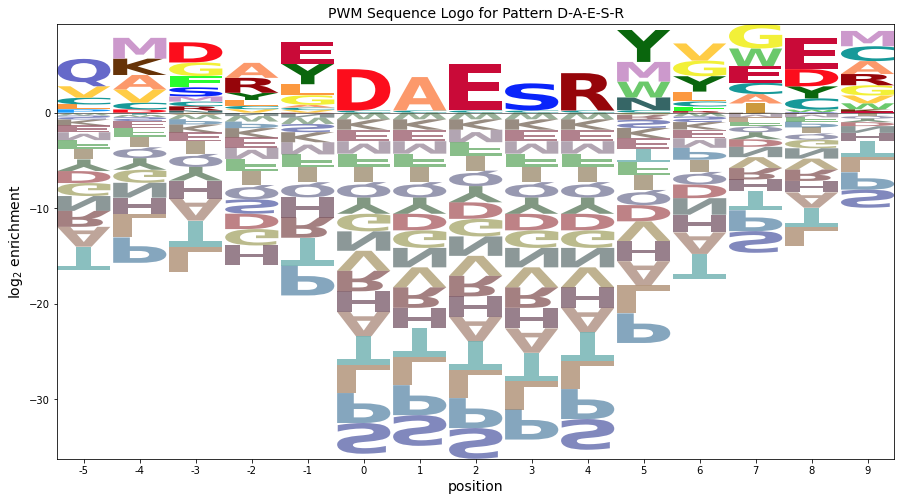

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.08314,0.000000,0.000000,0.290990,0.000000,0.000000,0.290990,0.62355,0.000000,0.166280,0.000000,0.249420,0.000000,0.000000
1,0.391021,0.0,0.071095,0.000000,0.000000,0.000000,0.00000,0.000000,0.142189,0.000000,0.248831,0.000000,0.000000,0.00000,0.071095,0.142189,0.142189,0.248831,0.000000,0.000000
2,0.000000,0.0,0.274107,0.000000,0.099675,0.174431,0.00000,0.000000,0.000000,0.000000,0.049838,0.074756,0.099675,0.00000,0.099675,0.348863,0.000000,0.049838,0.000000,0.000000
3,0.257471,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.171647,0.000000,0.034329,0.068659,0.00000,0.188812,0.034329,0.102988,0.068659,0.000000,0.068659
4,0.131361,0.0,0.043787,0.218935,0.000000,0.131361,0.00000,0.000000,0.000000,0.350297,0.000000,0.043787,0.000000,0.00000,0.000000,0.087574,0.000000,0.087574,0.000000,0.284616
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000


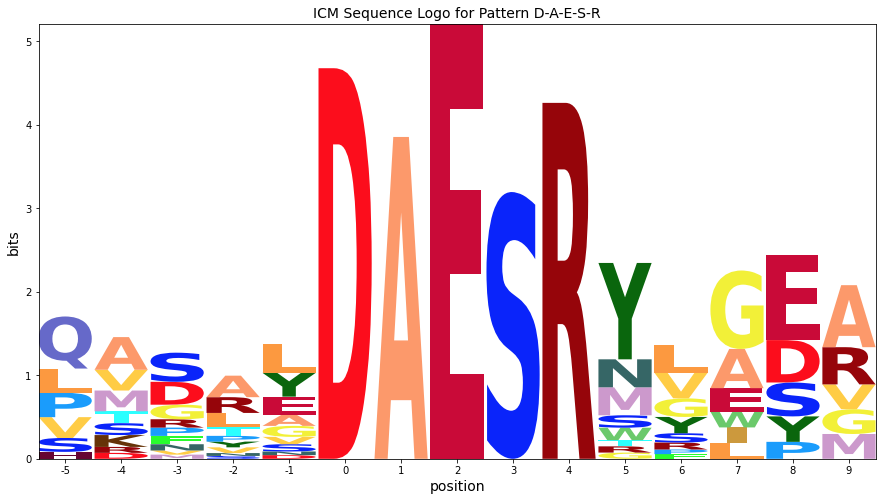

----------------------------------------------------------------------
F Pattern: S-A-E-Y-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.039216,0.078431,0.000000,0.000000,0.098039,0.000000,0.000000,0.000000,0.431373,0.000000,0.215686,0.000000,0.000000,0.137255,0.000000,0.000000
1,0.584906,0.000000,0.000000,0.000000,0.000000,0.075472,0.000000,0.000000,0.000000,0.094340,0.000000,0.000000,0.000000,0.000000,0.000000,0.075472,0.000000,0.000000,0.169811,0.000000
2,0.037736,0.415094,0.075472,0.000000,0.000000,0.132075,0.075472,0.000000,0.094340,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.094340,0.037736,0.000000,0.037736,0.000000
3,0.037037,0.000000,0.000000,0.000000,0.098765,0.024691,0.000000,0.111111,0.000000,0.061728,0.271605,0.098765,0.148148,0.049383,0.024691,0.037037,0.037037,0.000000,0.000000,0.000000
4,0.024096,0.000000,0.000000,0.036145,0.000000,0.024096,0.024096,0.000000,0.000000,0.180723,0.000000,0.132530,0.048193,0.000000,0.000000,0.433735,0.036145,0.060241,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.295376,0.491221,-1.472253,-0.941739,0.443915,0.742760,-1.887291,-1.316134,1.754255,-2.710413,-1.044832,-1.771814,1.650210,-1.356776,1.697672,-2.955035,-2.710413,1.169293,-0.434779,-1.434779
1,2.664547,0.451143,-1.512331,-0.981816,-1.181125,0.702682,-1.927368,-1.356212,-0.870785,-0.165528,-1.084910,-1.811891,-2.913429,-1.396854,-1.927368,-0.673185,-2.750491,-1.870785,2.847072,-1.474856
2,-0.750491,4.974705,0.809597,-0.981816,-1.181125,1.380754,0.394560,-1.356212,1.714178,-2.750491,-1.084910,-1.811891,-2.913429,-1.396854,-1.927368,-0.410150,-1.165528,-1.870785,1.110106,-1.474856
3,-0.803840,-0.017244,-1.980718,-1.450203,1.520413,-0.502670,-2.395755,1.497330,-1.339172,-0.633915,2.970265,0.889647,0.318624,0.456688,-0.810793,-1.463500,-1.218877,-2.339172,-0.943243,-1.943243
4,-1.247166,-0.045533,-2.009007,0.521508,-1.677801,-0.530959,-0.839082,-1.852888,-1.367461,0.752834,-1.581586,1.276395,-1.088177,-1.893530,-2.424044,1.717665,-1.247166,0.217502,-0.971532,-1.971532
5,-3.028272,-0.241675,-2.205149,-1.674635,-1.873943,-2.312064,-2.620187,-2.049030,-1.563603,-3.443309,-1.777728,-2.504710,-3.606248,-2.089672,-2.620187,2.941425,-3.443309,-2.563603,-1.167675,-2.167675
6,3.601085,-0.241675,-2.205149,-1.674635,-1.873943,-2.312064,-2.620187,-2.049030,-1.563603,-3.443309,-1.777728,-2.504710,-3.606248,-2.089672,-2.620187,-3.687931,-3.443309,-2.563603,-1.167675,-2.167675
7,-3.028272,-0.241675,-2.205149,4.954722,-1.873943,-2.312064,-2.620187,-2.049030,-1.563603,-3.443309,-1.777728,-2.504710,-3.606248,-2.089672,-2.620187,-3.687931,-3.443309,-2.563603,-1.167675,-2.167675
8,-3.028272,-0.241675,-2.205149,-1.674635,-1.873943,-2.312064,-2.620187,-2.049030,-1.563603,-3.443309,-1.777728,-2.504710,-3.606248,-2.089672,-2.620187,-3.687931,-3.443309,-2.563603,-1.167675,4.461682


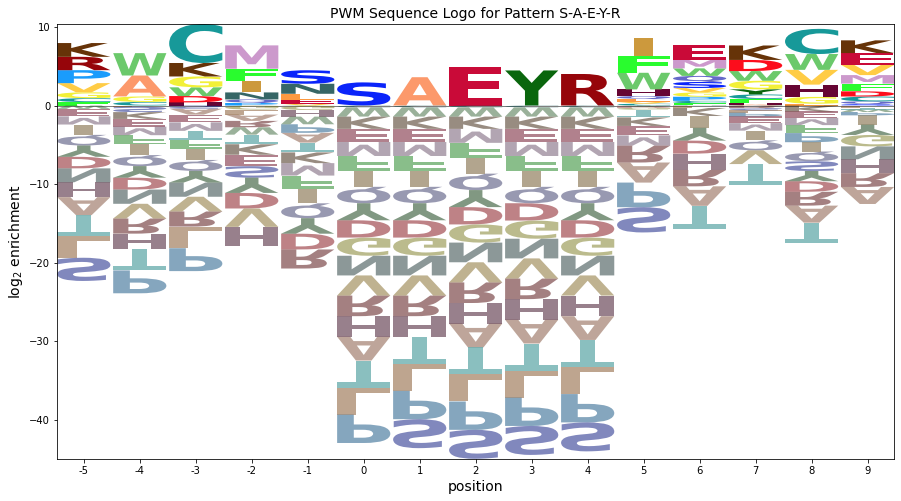

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.070915,0.141829,0.000000,0.000000,0.177287,0.000000,0.000000,0.000000,0.780062,0.000000,0.390031,0.000000,0.000000,0.248202,0.000000,0.000000
1,1.382997,0.000000,0.000000,0.000000,0.000000,0.178451,0.000000,0.000000,0.000000,0.223064,0.000000,0.000000,0.000000,0.000000,0.000000,0.178451,0.000000,0.000000,0.401515,0.000000
2,0.100989,1.110884,0.201979,0.000000,0.000000,0.353463,0.201979,0.000000,0.252474,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.252474,0.100989,0.000000,0.100989,0.000000
3,0.044684,0.000000,0.000000,0.000000,0.119156,0.029789,0.000000,0.134051,0.000000,0.074473,0.327680,0.119156,0.178735,0.059578,0.029789,0.044684,0.044684,0.000000,0.000000,0.000000
4,0.025995,0.000000,0.000000,0.038993,0.000000,0.025995,0.025995,0.000000,0.000000,0.194963,0.000000,0.142973,0.051990,0.000000,0.000000,0.467912,0.038993,0.064988,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.714968


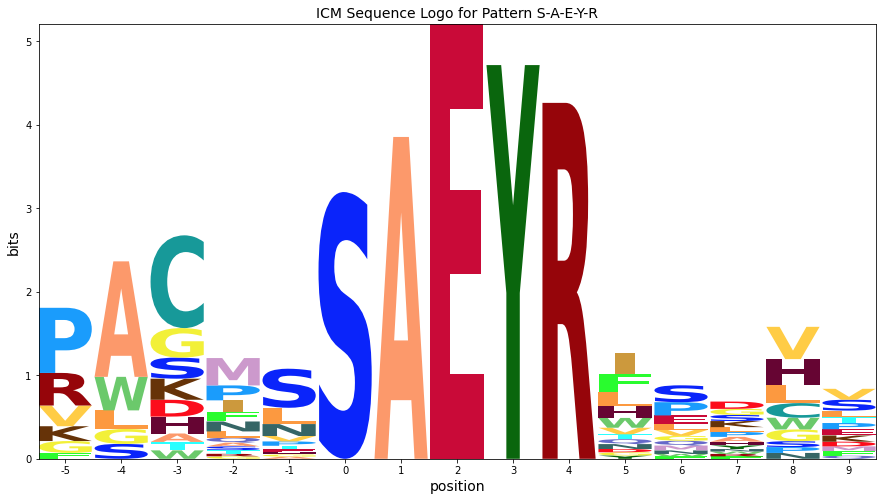

----------------------------------------------------------------------
G Pattern: G-G-G-S-A
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.076923,0.000000,0.038462,0.038462,0.000000,0.038462,0.0,0.115385,0.038462,0.269231,0.153846,0.038462,0.076923,0.076923,0.000000,0.038462,0.000000,0.000000
1,0.065574,0.0,0.114754,0.000000,0.032787,0.000000,0.114754,0.098361,0.0,0.032787,0.032787,0.000000,0.065574,0.032787,0.065574,0.196721,0.065574,0.081967,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.036364,0.054545,0.000000,0.000000,0.0,0.218182,0.036364,0.036364,0.054545,0.000000,0.000000,0.145455,0.163636,0.181818,0.000000,0.072727
3,0.000000,0.0,0.000000,0.032787,0.098361,0.049180,0.000000,0.000000,0.0,0.213115,0.000000,0.131148,0.098361,0.000000,0.000000,0.229508,0.081967,0.000000,0.065574,0.000000
4,0.119403,0.0,0.029851,0.000000,0.104478,0.044776,0.089552,0.000000,0.0,0.044776,0.059701,0.029851,0.059701,0.000000,0.104478,0.089552,0.223881,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.315553,0.471043,0.829497,-0.961916,0.423737,-0.014384,-1.907469,0.248650,-0.850885,0.076764,0.519953,2.114899,0.276395,0.208009,0.414459,-0.653285,-2.730591,-0.265923,-0.454957,-1.454957
1,-0.163550,0.301118,1.337644,-1.131841,0.253812,-1.769271,0.922606,1.301118,-1.020810,-1.315553,0.350028,-1.961916,-0.741526,0.038084,0.244534,0.555301,-0.578588,0.564152,-0.624882,-1.624882
2,-2.374447,0.412149,-1.551325,-1.020810,0.364844,0.341760,-1.966362,-1.395206,-0.909779,0.910955,0.461059,-0.265923,-0.952423,-1.435848,-1.966362,0.135818,0.532443,1.549653,-0.513850,0.808078
3,-2.485478,0.301118,-1.662356,0.453121,1.476205,0.230729,-2.077394,-1.506237,-1.020810,0.906839,-1.234935,1.208009,-0.256100,-1.546879,-2.077394,0.761752,-0.315553,-2.020810,1.697047,-1.624882
4,0.581353,0.198024,-0.180487,-1.234935,1.565756,0.127635,0.626868,-1.609331,-1.123904,-1.003609,0.983900,-0.480047,-0.844620,-1.649972,0.819513,-0.440877,0.996391,-2.123904,-0.727975,-1.727975
5,-2.588572,0.198024,-1.765450,-1.234935,-1.434244,4.215098,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975
6,-2.588572,0.198024,-1.765450,-1.234935,-1.434244,4.215098,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975
7,-2.588572,0.198024,-1.765450,-1.234935,-1.434244,4.215098,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975
8,-2.588572,0.198024,-1.765450,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,2.839231,-3.003609,-2.123904,-0.727975,-1.727975


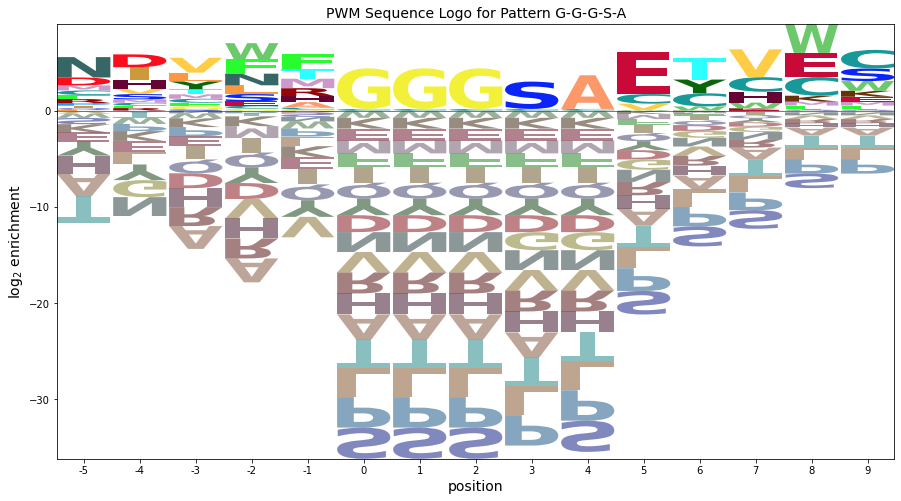

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.068530,0.000000,0.034265,0.034265,0.000000,0.034265,0.0,0.102795,0.034265,0.239856,0.137060,0.034265,0.068530,0.068530,0.000000,0.034265,0.000000,0.000000
1,0.037842,0.0,0.066223,0.000000,0.018921,0.000000,0.066223,0.056762,0.0,0.018921,0.018921,0.000000,0.037842,0.018921,0.037842,0.113525,0.037842,0.047302,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.030850,0.046276,0.000000,0.000000,0.0,0.185102,0.030850,0.030850,0.046276,0.000000,0.000000,0.123401,0.138827,0.154252,0.000000,0.061701
3,0.000000,0.0,0.000000,0.031913,0.095738,0.047869,0.000000,0.000000,0.0,0.207432,0.000000,0.127650,0.095738,0.000000,0.000000,0.223388,0.079782,0.000000,0.063825,0.000000
4,0.077950,0.0,0.019487,0.000000,0.068206,0.029231,0.058462,0.000000,0.0,0.029231,0.038975,0.019487,0.038975,0.000000,0.068206,0.058462,0.146156,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,4.570579,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,4.570579,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.000000,4.570579,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000


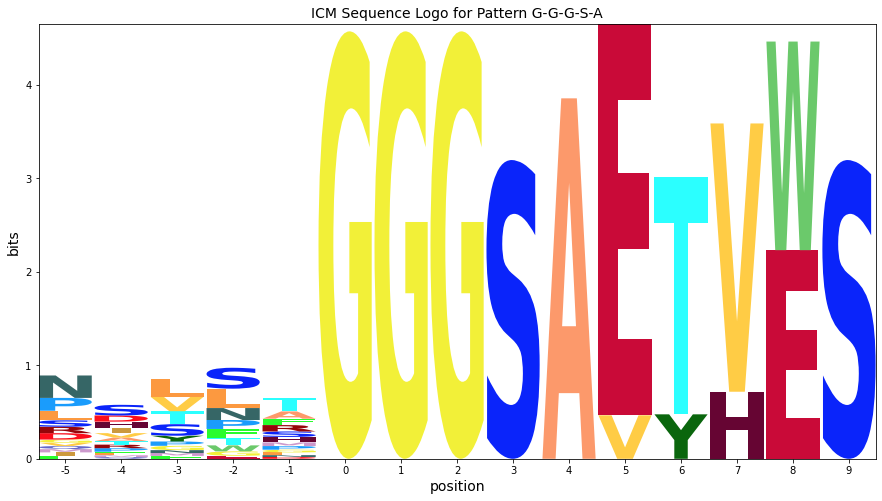

----------------------------------------------------------------------
H Pattern: D-A-E-L-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.220339,0.000000,0.101695,0.000000,0.000000,0.152542,0.000000,0.152542,0.000000,0.000000,0.000000,0.118644,0.118644,0.000000,0.000000,0.067797,0.067797,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.031746,0.000000,0.000000,0.158730,0.000000,0.031746,0.142857,0.063492,0.000000,0.142857,0.079365,0.079365,0.000000,0.031746,0.142857,0.000000,0.000000,0.095238
2,0.057143,0.000000,0.000000,0.000000,0.085714,0.085714,0.000000,0.000000,0.028571,0.028571,0.128571,0.071429,0.057143,0.000000,0.028571,0.271429,0.128571,0.000000,0.028571,0.000000
3,0.062500,0.000000,0.075000,0.000000,0.000000,0.025000,0.025000,0.112500,0.112500,0.075000,0.000000,0.075000,0.112500,0.112500,0.025000,0.062500,0.075000,0.025000,0.000000,0.025000
4,0.082474,0.030928,0.061856,0.000000,0.185567,0.000000,0.082474,0.000000,0.000000,0.051546,0.030928,0.134021,0.113402,0.041237,0.000000,0.000000,0.072165,0.061856,0.000000,0.051546
5,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,1.357946,0.337187,1.181068,-1.095772,-1.295081,1.588726,-2.041324,1.851760,-0.984741,-2.864447,-1.198866,1.074153,-0.027385,-1.510810,-2.041324,-0.787141,-0.542519,-1.984741,-0.588812,-1.588812
1,-2.520668,0.265928,-0.112583,-1.167031,-1.366340,1.654971,-2.112583,0.043536,2.265928,-0.613777,-1.270124,1.324822,-0.513681,1.002894,-2.112583,-1.595365,0.386223,-2.056000,-0.660071,1.147284
2,-0.315553,0.149115,-1.814359,-1.283845,1.324202,0.886080,-2.229397,-1.658240,0.412149,-1.467557,1.934990,0.471043,-0.893530,-1.698882,-0.644434,1.024787,0.269409,-2.172813,0.808078,-1.776885
3,-0.204522,-0.002888,0.840993,-1.435848,-1.635156,-0.488315,-0.796437,1.511685,1.997112,-0.397167,-1.538941,0.541432,-0.045533,1.471043,-0.796437,-0.864182,-0.397167,-0.739854,-0.928888,-0.343925
4,0.153932,1.770603,0.614484,-1.662356,2.386262,-2.299786,0.562017,-2.036752,-1.551325,-0.846068,0.234550,1.314924,-0.009007,0.244534,-2.607908,-3.675653,-0.431031,0.256030,-1.155396,0.429566
5,-3.015993,-0.229397,4.421839,-1.662356,-1.861665,-2.299786,-2.607908,-2.036752,-1.551325,-3.431031,-1.765450,-2.492431,-3.593969,-2.077394,-2.607908,-3.675653,-3.431031,-2.551325,-1.155396,-2.155396
6,3.598717,-0.229397,-2.192871,-1.662356,-1.861665,-2.299786,-2.607908,-2.036752,-1.551325,-3.431031,-1.765450,-2.492431,-3.593969,-2.077394,-2.607908,-3.675653,-3.431031,-2.551325,-1.155396,-2.155396
7,-3.015993,-0.229397,-2.192871,4.952354,-1.861665,-2.299786,-2.607908,-2.036752,-1.551325,-3.431031,-1.765450,-2.492431,-3.593969,-2.077394,-2.607908,-3.675653,-3.431031,-2.551325,-1.155396,-2.155396
8,-3.015993,-0.229397,-2.192871,-1.662356,-1.861665,-2.299786,-2.607908,-2.036752,-1.551325,3.183679,-1.765450,-2.492431,-3.593969,-2.077394,-2.607908,-3.675653,-3.431031,-2.551325,-1.155396,-2.155396


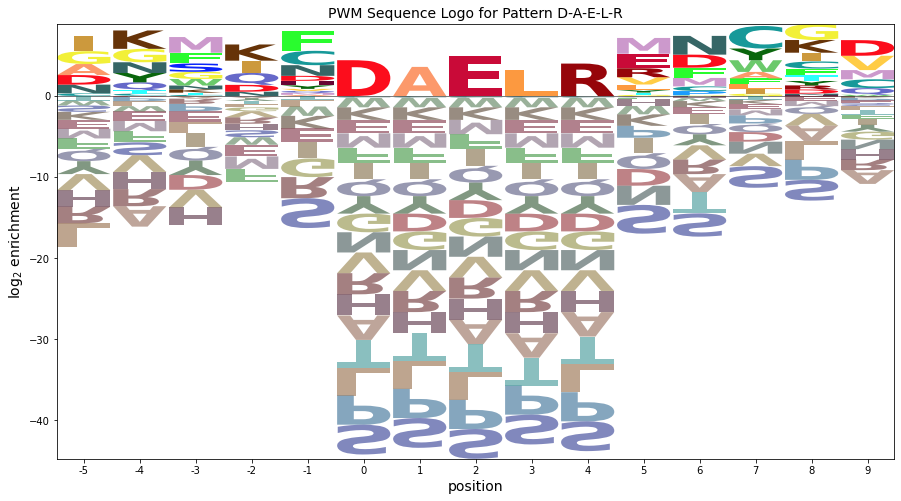

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.268243,0.000000,0.123804,0.000000,0.000000,0.185707,0.000000,0.185707,0.000000,0.000000,0.000000,0.144438,0.144438,0.000000,0.000000,0.082536,0.082536,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.033613,0.000000,0.000000,0.168067,0.000000,0.033613,0.151260,0.067227,0.000000,0.151260,0.084034,0.084034,0.000000,0.033613,0.151260,0.000000,0.000000,0.100840
2,0.047597,0.000000,0.000000,0.000000,0.071396,0.071396,0.000000,0.000000,0.023799,0.023799,0.107093,0.059496,0.047597,0.000000,0.023799,0.226086,0.107093,0.000000,0.023799,0.000000
3,0.033382,0.000000,0.040058,0.000000,0.000000,0.013353,0.013353,0.060087,0.060087,0.040058,0.000000,0.040058,0.060087,0.060087,0.013353,0.033382,0.040058,0.013353,0.000000,0.013353
4,0.069471,0.026052,0.052103,0.000000,0.156310,0.000000,0.069471,0.000000,0.000000,0.043420,0.026052,0.112891,0.095523,0.034736,0.000000,0.000000,0.060787,0.052103,0.000000,0.043420
5,0.000000,0.000000,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


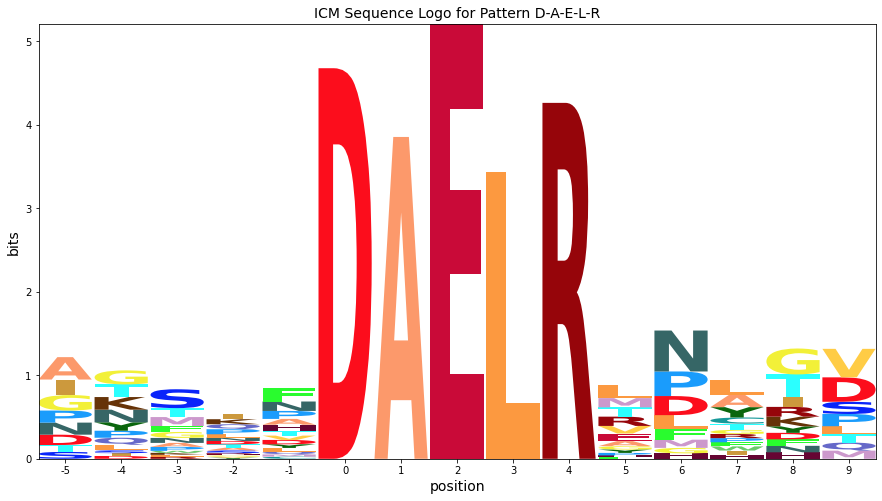

----------------------------------------------------------------------
I Pattern: D-S-E-F-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.083333,0.000000,0.333333,0.000000
1,0.090909,0.0,0.090909,0.000000,0.000000,0.045455,0.000000,0.000000,0.000000,0.545455,0.000000,0.000000,0.068182,0.000000,0.045455,0.045455,0.000000,0.000000,0.000000,0.068182
2,0.000000,0.0,0.043478,0.086957,0.043478,0.217391,0.000000,0.000000,0.000000,0.217391,0.000000,0.000000,0.000000,0.000000,0.000000,0.152174,0.108696,0.000000,0.000000,0.130435
3,0.122449,0.0,0.061224,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.285714,0.000000,0.163265,0.081633,0.000000,0.061224,0.040816,0.040816,0.000000,0.000000,0.000000
4,0.000000,0.0,0.035714,0.000000,0.035714,0.053571,0.035714,0.000000,0.000000,0.196429,0.000000,0.339286,0.142857,0.000000,0.000000,0.089286,0.071429,0.000000,0.000000,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.605060,1.181536,-0.781938,1.333539,-0.450732,-0.888853,-1.196975,-0.625819,-0.140392,1.149827,-0.354517,1.240430,-2.183036,-0.666461,-1.196975,-2.264720,-0.435135,-1.140392,3.425462,-0.744463
1,0.176300,0.640968,0.999422,-0.791991,-0.991300,0.155541,-1.737544,-1.166387,-0.680960,2.083190,-0.895085,-1.622066,-0.723605,-1.207029,-0.152581,-1.220326,-2.560666,-1.680960,-0.285032,0.714968
2,-2.190023,0.596574,0.218062,1.485542,0.549268,1.985616,-1.781938,-1.210781,-0.725354,0.854372,-0.939479,-1.666461,-2.767999,-1.251423,-1.781938,0.150318,-0.020098,-1.725354,-0.329426,1.477929
3,0.553202,0.532443,0.568969,-0.900516,1.900175,-1.537946,-1.846068,-1.274911,-0.789485,1.237700,-1.003609,1.439334,-0.510201,-1.315553,0.153932,-1.328850,-1.084228,-1.789485,-0.393556,-1.393556
4,-2.393556,0.393040,0.014529,-1.039919,0.345735,0.322651,-0.400509,-1.414315,-0.928888,0.776369,-1.143013,2.451934,0.198393,-1.454957,-1.985471,-0.468253,-0.486665,-1.928888,-0.532959,-1.532959
5,-2.431031,0.355566,4.274735,-1.077394,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,-3.090691,-2.846068,-1.966362,-0.570434,-1.570434
6,-2.431031,0.355566,-1.607908,-1.077394,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,2.791953,-2.846068,-1.966362,-0.570434,-1.570434
7,-2.431031,0.355566,-1.607908,4.805249,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,-3.090691,-2.846068,-1.966362,-0.570434,-1.570434
8,-2.431031,0.355566,-1.607908,-1.077394,4.605941,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,-3.090691,-2.846068,-1.966362,-0.570434,-1.570434


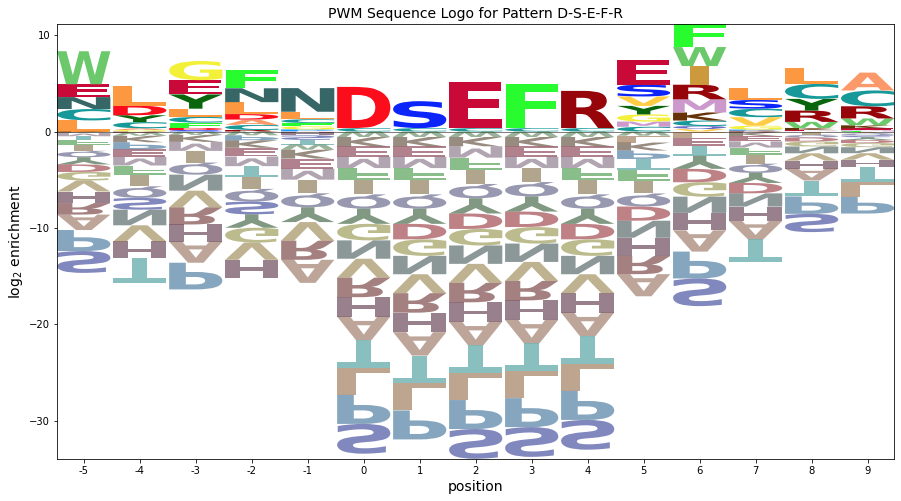

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.201395,0.000000,0.000000,0.000000,0.000000,0.000000,0.805580,0.000000,0.402790,0.000000,0.000000,0.000000,0.000000,0.201395,0.000000,0.805580,0.000000
1,0.136436,0.0,0.136436,0.000000,0.000000,0.068218,0.000000,0.000000,0.000000,0.818615,0.000000,0.000000,0.102327,0.000000,0.068218,0.068218,0.000000,0.000000,0.000000,0.102327
2,0.000000,0.0,0.056029,0.112058,0.056029,0.280145,0.000000,0.000000,0.000000,0.280145,0.000000,0.000000,0.000000,0.000000,0.000000,0.196101,0.140072,0.000000,0.000000,0.168087
3,0.133464,0.0,0.066732,0.000000,0.155709,0.000000,0.000000,0.000000,0.000000,0.311417,0.000000,0.177953,0.088976,0.000000,0.066732,0.044488,0.044488,0.000000,0.000000,0.000000
4,0.000000,0.0,0.042399,0.000000,0.042399,0.063598,0.042399,0.000000,0.000000,0.233194,0.000000,0.402790,0.169596,0.000000,0.000000,0.105997,0.084798,0.000000,0.000000,0.000000
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,5.008700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


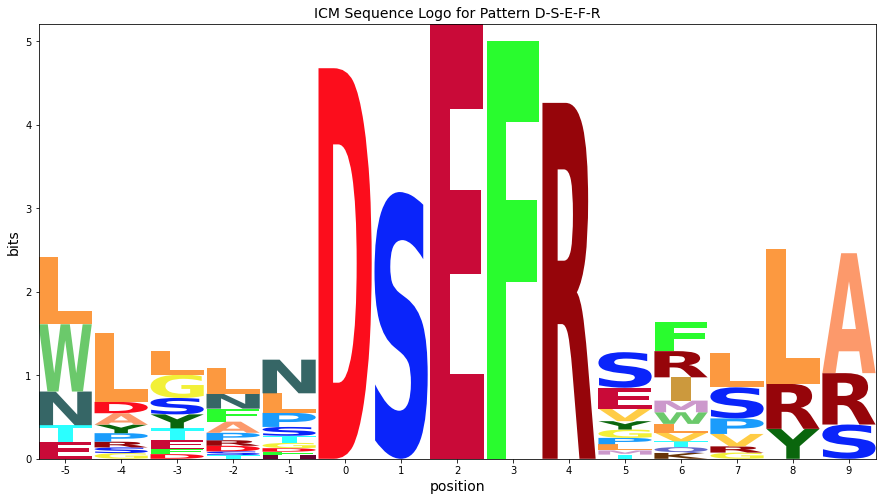

----------------------------------------------------------------------
J Pattern: G-G-S-A-E
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.073171,0.00,0.048780,0.048780,0.073171,0.0,0.0,0.000000,0.000000,0.000000,0.048780,0.097561,0.097561,0.292683,0.121951,0.000000,0.0,0.097561
1,0.121951,0.0,0.000000,0.00,0.097561,0.073171,0.000000,0.0,0.0,0.146341,0.048780,0.000000,0.073171,0.000000,0.000000,0.048780,0.048780,0.243902,0.0,0.097561
2,0.069767,0.0,0.046512,0.00,0.093023,0.069767,0.000000,0.0,0.0,0.232558,0.046512,0.046512,0.232558,0.000000,0.046512,0.000000,0.069767,0.046512,0.0,0.000000
3,0.163265,0.0,0.102041,0.00,0.122449,0.102041,0.040816,0.0,0.0,0.061224,0.000000,0.040816,0.000000,0.040816,0.061224,0.224490,0.040816,0.000000,0.0,0.000000
4,0.000000,0.0,0.081633,0.00,0.000000,0.551020,0.000000,0.0,0.0,0.000000,0.040816,0.000000,0.040816,0.000000,0.102041,0.061224,0.081633,0.040816,0.0,0.000000
5,0.000000,0.0,0.000000,0.00,0.000000,1.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,0.00,0.000000,1.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000
8,1.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.076366,0.710231,0.746756,-0.722729,0.662925,0.224804,0.331719,-1.097124,-0.611698,-2.491403,-0.825822,-1.552804,-1.069379,1.184162,0.653647,0.964414,0.093559,-1.611698,-0.215769,1.106159
1,0.508597,0.710231,-1.253244,-0.722729,1.399890,0.639841,-1.668281,-1.097124,-0.611698,0.315952,0.759140,-1.552804,-0.654342,-1.137766,-1.668281,-1.151063,-0.906441,1.847734,-0.215769,1.106159
2,-0.122908,0.663688,0.285176,-0.769271,1.353348,0.593299,-1.714824,-1.143667,-0.658240,0.921486,0.712598,-0.014384,0.758547,-1.184309,-0.129861,-2.782568,-0.537946,-0.073278,-0.262311,-1.262311
3,0.915772,0.532443,1.153932,-0.900516,1.707530,1.047017,-0.261106,-1.274911,-0.789485,-0.669190,-1.003609,-0.145628,-2.832129,0.269409,0.153932,0.671150,-1.084228,-1.789485,-0.393556,-1.393556
4,-2.254153,0.532443,0.890897,-0.900516,-1.099825,3.269409,-1.846068,-1.274911,-0.789485,-2.669190,0.581353,-1.730591,-1.247166,-1.315553,0.738894,-0.913813,-0.347262,-0.204522,-0.393556,-1.393556
5,-2.254153,0.532443,-1.431031,-0.900516,-1.099825,4.105910,-1.846068,-1.274911,-0.789485,-2.669190,-1.003609,-1.730591,-2.832129,-1.315553,-1.846068,-2.913813,-2.669190,-1.789485,-0.393556,-1.393556
6,-2.254153,0.532443,-1.431031,-0.900516,-1.099825,4.105910,-1.846068,-1.274911,-0.789485,-2.669190,-1.003609,-1.730591,-2.832129,-1.315553,-1.846068,-2.913813,-2.669190,-1.789485,-0.393556,-1.393556
7,-2.254153,0.532443,-1.431031,-0.900516,-1.099825,-1.537946,-1.846068,-1.274911,-0.789485,-2.669190,-1.003609,-1.730591,-2.832129,-1.315553,-1.846068,2.730043,-2.669190,-1.789485,-0.393556,-1.393556
8,3.389703,0.532443,-1.431031,-0.900516,-1.099825,-1.537946,-1.846068,-1.274911,-0.789485,-2.669190,-1.003609,-1.730591,-2.832129,-1.315553,-1.846068,-2.913813,-2.669190,-1.789485,-0.393556,-1.393556


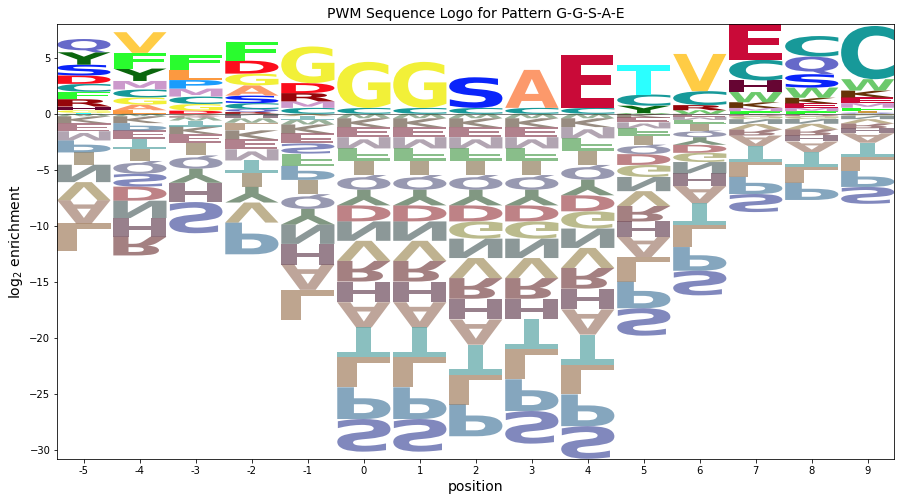

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.067148,0.000000,0.044765,0.044765,0.067148,0.0,0.0,0.000000,0.000000,0.000000,0.044765,0.089531,0.089531,0.268592,0.111914,0.000000,0.0,0.089531
1,0.122548,0.000000,0.000000,0.000000,0.098038,0.073529,0.000000,0.0,0.0,0.147058,0.049019,0.000000,0.073529,0.000000,0.000000,0.049019,0.049019,0.245096,0.0,0.098038
2,0.054585,0.000000,0.036390,0.000000,0.072780,0.054585,0.000000,0.0,0.0,0.181950,0.036390,0.036390,0.181950,0.000000,0.036390,0.000000,0.054585,0.036390,0.0,0.000000
3,0.140914,0.000000,0.088071,0.000000,0.105686,0.088071,0.035229,0.0,0.0,0.052843,0.000000,0.035229,0.000000,0.035229,0.052843,0.193757,0.035229,0.000000,0.0,0.000000
4,0.000000,0.000000,0.172921,0.000000,0.000000,1.167216,0.000000,0.0,0.0,0.000000,0.086460,0.000000,0.086460,0.000000,0.216151,0.129691,0.172921,0.086460,0.0,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,4.570579,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,4.570579,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.0,0.000000
8,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


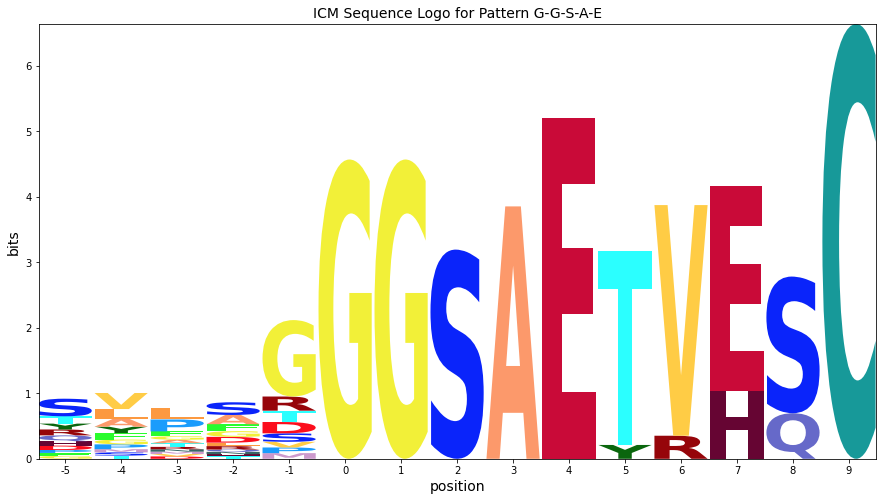

----------------------------------------------------------------------
K Pattern: D-A-E-Y-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.069767,0.0,0.000000,0.046512,0.000000,0.232558,0.000000,0.000000,0.000000,0.348837,0.000000,0.000000,0.046512,0.0,0.162791,0.093023,0.000000,0.000000,0.00,0.000000
1,0.000000,0.0,0.000000,0.173077,0.000000,0.153846,0.346154,0.038462,0.000000,0.000000,0.038462,0.000000,0.134615,0.0,0.000000,0.115385,0.000000,0.000000,0.00,0.000000
2,0.185185,0.0,0.000000,0.000000,0.000000,0.129630,0.000000,0.000000,0.000000,0.037037,0.000000,0.000000,0.425926,0.0,0.000000,0.092593,0.000000,0.129630,0.00,0.000000
3,0.074627,0.0,0.000000,0.000000,0.074627,0.164179,0.223881,0.059701,0.000000,0.029851,0.000000,0.000000,0.000000,0.0,0.104478,0.134328,0.000000,0.059701,0.00,0.074627
4,0.214286,0.0,0.071429,0.042857,0.000000,0.000000,0.028571,0.028571,0.042857,0.128571,0.000000,0.057143,0.000000,0.0,0.114286,0.000000,0.228571,0.042857,0.00,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,1.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.122908,0.663688,-1.299786,0.815691,-0.968580,2.052730,-1.714824,-1.143667,-0.658240,1.462054,-0.872365,-1.599346,-1.115922,-1.184309,1.285176,-0.460640,-2.537946,-1.658240,-0.262311,-1.262311
1,-2.315553,0.471043,-1.492431,2.360012,-1.161225,1.570579,2.340459,0.248650,-0.850885,-2.730591,0.519953,-1.791991,0.106470,-1.376954,-1.907469,-0.167858,-2.730591,-1.850885,-0.454957,-1.454957
2,1.104350,0.431515,-1.531960,-1.001445,-1.200754,1.361125,-1.946997,-1.375840,-0.890414,-1.185157,-1.104538,-1.831520,1.651905,-1.416482,-1.946997,-0.429779,-2.770119,1.109586,-0.494485,-1.494485
3,-0.003609,0.198024,-1.765450,-1.234935,1.150719,1.712598,1.819513,0.712598,-1.123904,-1.418647,-1.338028,-2.065010,-3.166548,-1.649972,0.819513,0.073696,-3.003609,0.198024,-0.727975,0.856987
4,1.362518,0.149115,0.770603,0.716155,-1.483153,-1.921275,-0.644434,-0.073278,0.827187,0.269409,-1.386938,0.208009,-3.215458,-1.698882,0.940528,-3.297141,1.034944,-0.172813,-0.776885,-1.776885
5,-2.637482,0.149115,4.335388,-1.283845,-1.483153,-1.921275,-2.229397,-1.658240,-1.172813,-3.052519,-1.386938,-2.113920,-3.215458,-1.698882,-2.229397,-3.297141,-3.052519,-2.172813,-0.776885,-1.776885
6,3.512266,0.149115,-1.814359,-1.283845,-1.483153,-1.921275,-2.229397,-1.658240,-1.172813,-3.052519,-1.386938,-2.113920,-3.215458,-1.698882,-2.229397,-3.297141,-3.052519,-2.172813,-0.776885,-1.776885
7,-2.637482,0.149115,-1.814359,4.865903,-1.483153,-1.921275,-2.229397,-1.658240,-1.172813,-3.052519,-1.386938,-2.113920,-3.215458,-1.698882,-2.229397,-3.297141,-3.052519,-2.172813,-0.776885,-1.776885
8,-2.637482,0.149115,-1.814359,-1.283845,-1.483153,-1.921275,-2.229397,-1.658240,-1.172813,-3.052519,-1.386938,-2.113920,-3.215458,-1.698882,-2.229397,-3.297141,-3.052519,-2.172813,-0.776885,4.372863


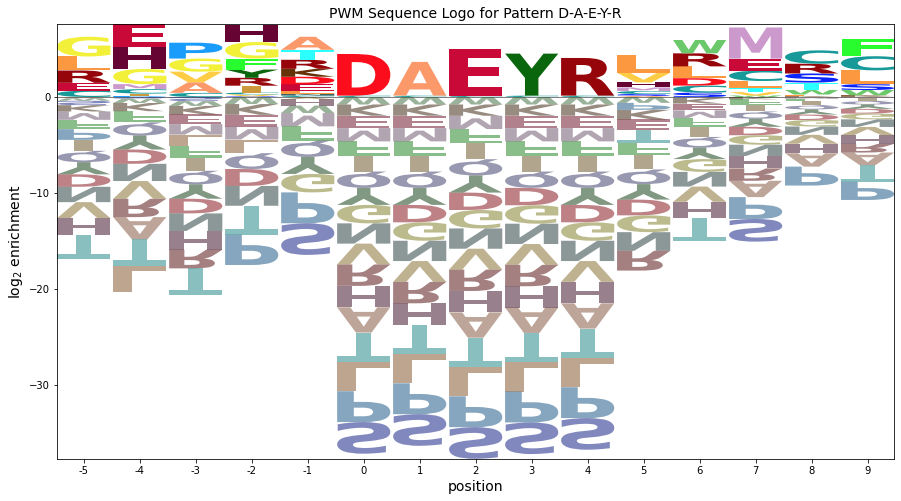

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.102775,0.0,0.000000,0.068516,0.000000,0.342582,0.000000,0.000000,0.000000,0.513873,0.000000,0.000000,0.068516,0.0,0.239807,0.137033,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.307769,0.000000,0.273572,0.615537,0.068393,0.000000,0.000000,0.068393,0.000000,0.239376,0.0,0.000000,0.205179,0.000000,0.000000,0.000000,0.000000
2,0.268828,0.0,0.000000,0.000000,0.000000,0.188180,0.000000,0.000000,0.000000,0.053766,0.000000,0.000000,0.618304,0.0,0.000000,0.134414,0.000000,0.188180,0.000000,0.000000
3,0.084007,0.0,0.000000,0.000000,0.084007,0.184815,0.252020,0.067205,0.000000,0.033603,0.000000,0.000000,0.000000,0.0,0.117609,0.151212,0.000000,0.067205,0.000000,0.084007
4,0.200465,0.0,0.066822,0.040093,0.000000,0.000000,0.026729,0.026729,0.040093,0.120279,0.000000,0.053457,0.000000,0.0,0.106915,0.000000,0.213830,0.040093,0.000000,0.000000
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.714968


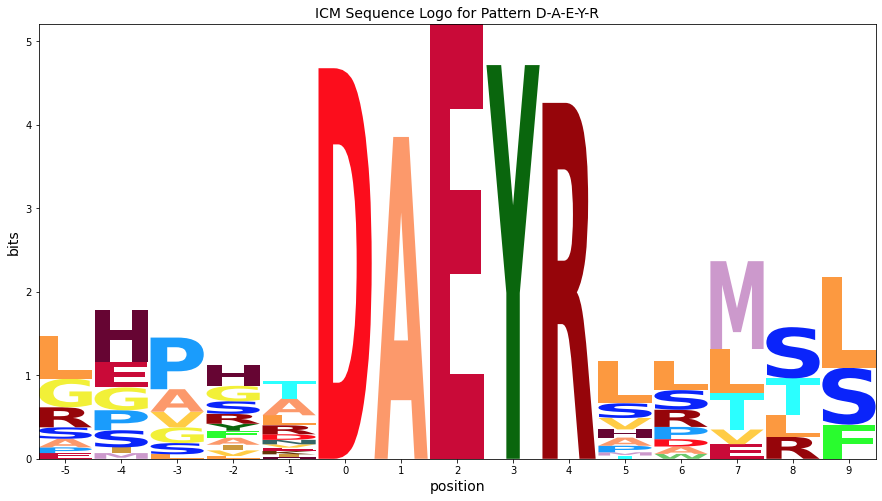

----------------------------------------------------------------------
L Pattern: S-x-D-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.200000,0.0,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.466667,0.133333,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.105263,0.000000,0.105263,0.000000,0.000000,0.157895,0.000000,0.000000,0.000000,0.000000,0.210526,0.157895,0.105263,0.157895,0.000000
2,0.000000,0.0,0.000000,0.217391,0.000000,0.000000,0.086957,0.000000,0.000000,0.000000,0.000000,0.086957,0.000000,0.000000,0.260870,0.130435,0.130435,0.086957,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.108696,0.260870,0.000000,0.217391,0.000000,0.043478,0.086957,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.239130
4,0.125000,0.0,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.062500,0.041667,0.083333,0.000000,0.000000,0.000000,0.041667,0.041667,0.041667,0.333333,0.000000,0.062500
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.044776,0.0,0.029851,0.000000,0.074627,0.029851,0.029851,0.029851,0.044776,0.134328,0.194030,0.000000,0.119403,0.149254,0.000000,0.089552,0.000000,0.000000,0.000000,0.029851
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.725089,1.511685,-0.451789,2.078725,-0.120583,-0.558704,-0.866827,-0.295670,0.189757,-1.689949,-0.024368,-0.751350,-1.852888,-0.336312,-0.866827,1.065429,-0.104986,-0.810243,0.585685,-0.414315
1,-1.431031,1.355566,-0.607908,-0.077394,-0.276703,0.870139,-1.022946,1.133173,0.033638,-1.846068,1.819513,-0.907469,-2.009007,-0.492431,-1.022946,0.231238,0.153932,0.618600,2.429566,-0.570434
2,-1.571893,1.214703,-0.748771,2.366706,-0.417565,-0.855686,0.421154,-0.592652,-0.107225,-1.986931,-0.321350,0.536631,-2.149869,-0.633294,1.643546,-0.231553,0.013069,0.477738,0.288704,-0.711296
3,-2.190023,0.596574,-1.366900,-0.836386,-1.035694,-1.473816,0.803025,2.489659,-0.725354,0.854372,-0.939479,-0.081498,-0.446071,-1.251423,-0.196975,-2.849682,-2.605060,-1.725354,-0.329426,2.255537
4,0.574264,0.553505,-1.409969,-0.879454,-1.078763,1.653041,-1.825007,-1.253850,1.231577,-1.063166,1.339380,-1.709529,-2.811067,-1.294492,-0.240044,-1.307789,-1.063166,2.319040,-0.372494,0.627506
5,-2.588572,0.198024,-1.765450,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,2.839231,-3.003609,-2.123904,-0.727975,-1.727975
6,-0.588572,0.198024,-0.180487,-1.234935,1.150719,-0.287402,-0.595525,-0.024368,0.876096,0.318319,2.469326,-2.065010,0.003377,1.809459,-2.180487,-0.440877,-3.003609,-2.123904,-0.727975,-0.143013
7,-2.588572,0.198024,4.322013,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975
8,3.498891,0.198024,-1.765450,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975


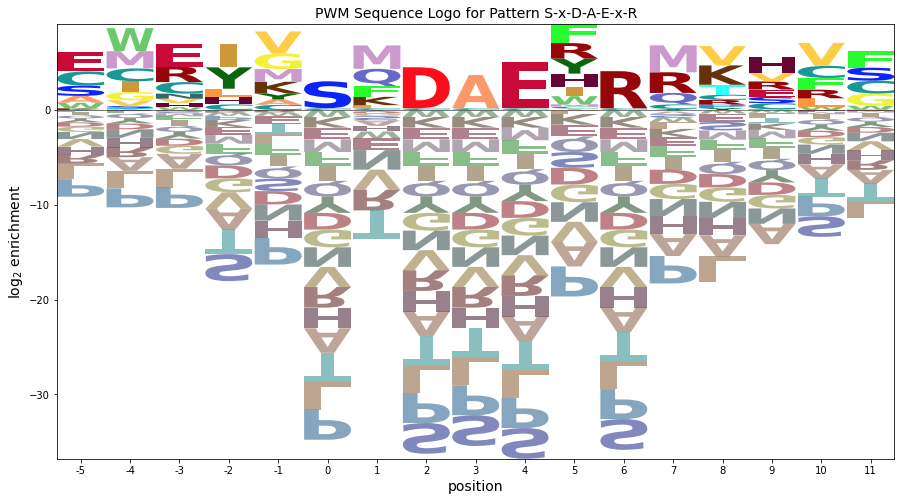

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.386489,0.0,0.000000,0.386489,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.901808,0.257659,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.169291,0.000000,0.169291,0.000000,0.000000,0.253936,0.000000,0.000000,0.000000,0.000000,0.338582,0.253936,0.169291,0.253936,0.000000
2,0.000000,0.0,0.000000,0.340482,0.000000,0.000000,0.136193,0.000000,0.000000,0.000000,0.000000,0.136193,0.000000,0.000000,0.408579,0.204289,0.204289,0.136193,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.188512,0.452429,0.000000,0.377024,0.000000,0.075405,0.150810,0.000000,0.075405,0.000000,0.000000,0.000000,0.000000,0.414727
4,0.179506,0.0,0.000000,0.000000,0.000000,0.239341,0.000000,0.000000,0.089753,0.059835,0.119670,0.000000,0.000000,0.000000,0.059835,0.059835,0.059835,0.478682,0.000000,0.089753
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.042347,0.0,0.028231,0.000000,0.070578,0.028231,0.028231,0.028231,0.042347,0.127040,0.183502,0.000000,0.112924,0.141155,0.000000,0.084693,0.000000,0.000000,0.000000,0.028231
7,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


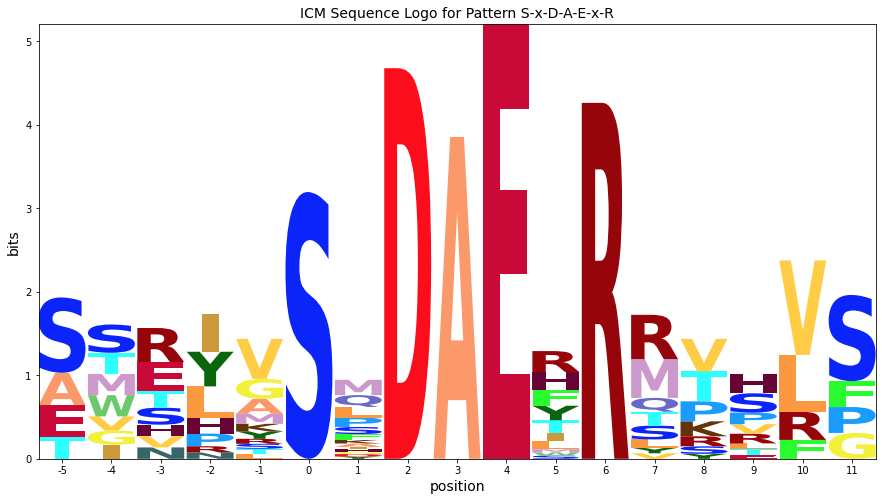

----------------------------------------------------------------------
M Pattern: N-S-E-[FW]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.153846,0.000000,0.000000,0.000000,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.538462,0.000000,0.000000,0.000000,0.153846
1,0.200000,0.0,0.000000,0.000000,0.000000,0.080000,0.000000,0.000000,0.080000,0.000000,0.000000,0.080000,0.000000,0.000000,0.120000,0.280000,0.000000,0.000000,0.000000,0.160000
2,0.093750,0.0,0.000000,0.000000,0.000000,0.125000,0.000000,0.156250,0.000000,0.062500,0.218750,0.000000,0.000000,0.000000,0.000000,0.062500,0.062500,0.218750,0.000000,0.000000
3,0.142857,0.0,0.000000,0.085714,0.142857,0.000000,0.200000,0.057143,0.114286,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.057143,0.057143,0.000000
4,0.000000,0.0,0.000000,0.031250,0.062500,0.078125,0.046875,0.000000,0.000000,0.000000,0.031250,0.000000,0.000000,0.109375,0.000000,0.046875,0.187500,0.265625,0.140625,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.905405,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.094595,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.190023,1.596574,1.218062,0.163614,-0.035694,-0.473816,0.803025,-0.210781,0.274646,-1.605060,0.060521,-0.666461,-1.767999,-0.251423,-0.781938,1.150318,-1.605060,-0.725354,0.670574,1.255537
1,0.947481,1.149115,-0.814359,-0.283845,-0.483153,0.663688,-1.229397,-0.658240,1.412149,-2.052519,-0.386938,0.471043,-2.215458,-0.698882,0.770603,0.702859,-2.052519,-1.172813,0.223115,1.545043
2,0.153932,0.940528,-1.022946,-0.492431,-0.691740,1.192067,-1.437983,1.718136,-0.381400,-0.676143,2.404475,-1.322506,-2.424044,-0.907469,-1.437983,-0.920766,-0.676143,1.618600,0.014529,-0.985471
3,0.657974,0.859608,-1.103866,1.426649,1.812302,-1.210781,1.481097,0.637216,1.859608,-2.342026,-0.676445,-1.403426,0.079998,-0.988389,-1.518903,-2.586648,-2.342026,0.122643,1.518571,-1.066391
4,-2.537946,0.248650,-1.714824,0.400654,0.938310,0.763224,-0.129861,-1.558704,-1.073278,-2.952983,0.297560,-2.014384,-3.115922,1.400654,-2.129861,-1.197606,0.747456,2.096647,2.644579,-1.677349
5,-2.700217,0.086379,-1.877095,-1.346580,-1.545889,-1.984010,-2.292133,-1.720976,-1.235549,-3.115255,-1.449674,4.052163,-3.278193,-1.761618,-2.292133,-3.359877,-3.115255,-2.235549,-0.839620,-1.839620
6,-2.700217,0.086379,-1.877095,-1.346580,-1.545889,-1.984010,-2.292133,-1.720976,-1.235549,-3.115255,-1.449674,-2.176655,-3.278193,-1.761618,-2.292133,2.868942,-3.115255,-2.235549,-0.839620,-1.839620
7,-2.700217,0.086379,-1.877095,4.882238,-1.545889,-1.984010,-2.292133,-1.720976,-1.235549,-3.115255,-1.449674,-2.176655,-3.278193,-1.761618,-2.292133,-3.359877,-3.115255,-2.235549,-0.839620,-1.839620
8,-2.700217,0.086379,-1.877095,-1.346580,4.541574,-1.984010,-2.292133,-1.720976,-1.235549,-3.115255,-1.449674,-2.176655,-3.278193,-1.761618,-2.292133,-3.359877,-3.115255,-2.235549,2.160380,-1.839620


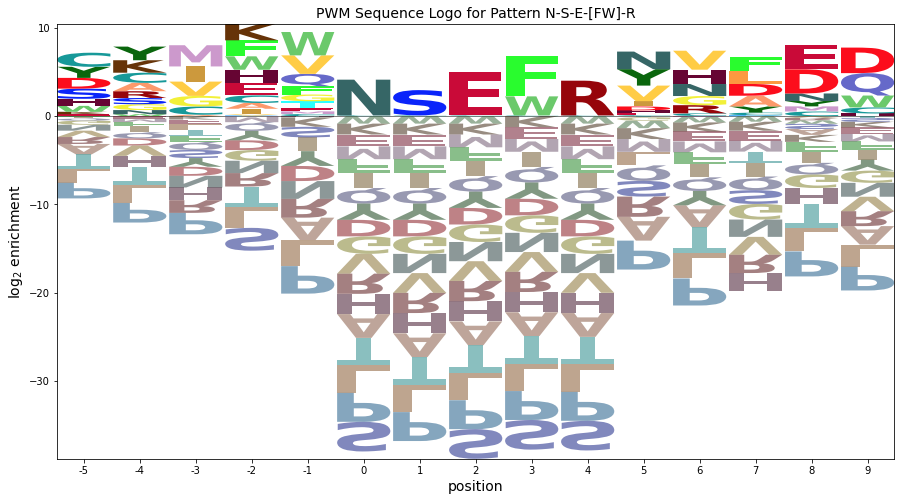

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.322113,0.000000,0.000000,0.000000,0.322113,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.127397,0.000000,0.000000,0.000000,0.322113
1,0.285894,0.0,0.000000,0.000000,0.000000,0.114358,0.000000,0.000000,0.114358,0.000000,0.000000,0.114358,0.000000,0.000000,0.171537,0.400252,0.000000,0.000000,0.000000,0.228715
2,0.145885,0.0,0.000000,0.000000,0.000000,0.194513,0.000000,0.243142,0.000000,0.097257,0.340398,0.000000,0.000000,0.000000,0.000000,0.097257,0.097257,0.340398,0.000000,0.000000
3,0.207675,0.0,0.000000,0.124605,0.207675,0.000000,0.290745,0.083070,0.166140,0.000000,0.000000,0.000000,0.207675,0.000000,0.000000,0.000000,0.000000,0.083070,0.083070,0.000000
4,0.000000,0.0,0.000000,0.046569,0.093138,0.116422,0.069853,0.000000,0.000000,0.000000,0.046569,0.000000,0.000000,0.162991,0.000000,0.069853,0.279413,0.395835,0.209560,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.377934,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,4.186491,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.437395,0.000000


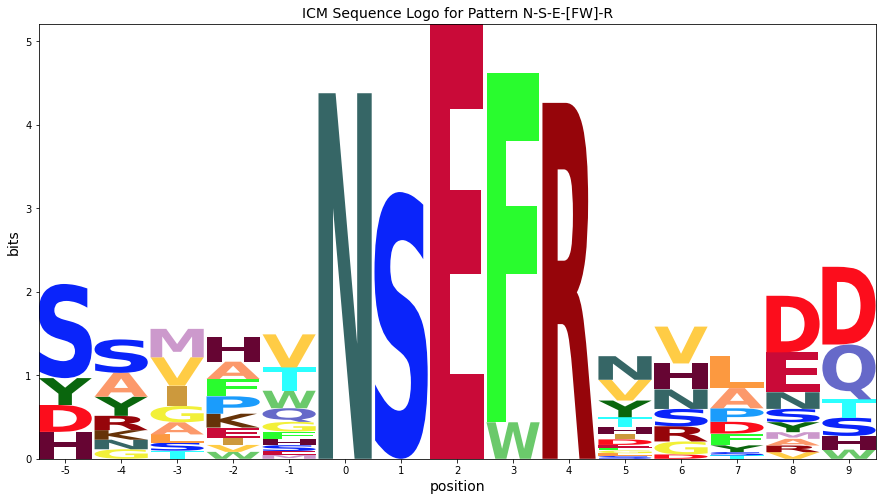

----------------------------------------------------------------------
N Pattern: L-x-D-A-E-[FW]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.178571,0.000000,0.000000,0.000000,0.000000,0.357143,0.000000,0.000000,0.071429,0.000000,0.142857,0.142857,0.107143
1,0.000000,0.0,0.178571,0.000000,0.000000,0.214286,0.000000,0.000000,0.071429,0.071429,0.000000,0.000000,0.107143,0.000000,0.357143,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.054054,0.0,0.000000,0.000000,0.000000,0.054054,0.054054,0.000000,0.000000,0.270270,0.189189,0.000000,0.000000,0.000000,0.135135,0.108108,0.081081,0.000000,0.054054,0.000000
3,0.054054,0.0,0.054054,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.513514,0.000000,0.000000,0.054054,0.054054,0.000000,0.000000,0.000000,0.189189,0.081081,0.000000
4,0.000000,0.0,0.000000,0.000000,0.076923,0.046154,0.169231,0.030769,0.030769,0.000000,0.000000,0.000000,0.107692,0.046154,0.000000,0.230769,0.000000,0.076923,0.000000,0.184615
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.153846,0.153846,0.000000,0.076923,0.200000,0.000000,0.000000,0.000000,0.030769,0.107692,0.030769,0.000000,0.000000,0.169231,0.000000,0.076923,0.000000,0.000000
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.730591,1.056005,-0.907469,-0.376954,-0.576263,-1.014384,-1.322506,1.833613,-0.265923,-2.145628,-0.480047,-1.207029,1.150865,-0.791991,-1.322506,-0.805288,-2.145628,1.056005,2.451934,1.130006
1,-1.730591,1.056005,1.677494,-0.376954,-0.576263,1.792971,-1.322506,-0.751350,1.319040,-0.560666,-0.480047,-1.207029,-0.308567,-0.791991,2.136925,-2.390251,-2.145628,-1.265923,0.130006,-0.869994
2,-0.393556,0.808078,-1.155396,-0.624882,-0.824190,0.322651,0.014529,-0.999277,-0.513850,1.065876,2.272025,-1.454957,-2.556495,-1.039919,1.014529,-0.316250,-0.393556,-1.513850,1.467041,-1.117922
3,-0.393556,0.808078,0.429566,-0.624882,-0.824190,-1.262311,-1.570434,-0.999277,-0.513850,1.928372,-0.727975,-1.454957,-0.971532,0.545043,-1.570434,-2.638178,-2.393556,1.486150,1.882078,-1.117922
4,-2.555019,0.231577,-1.731897,-1.201382,1.184271,0.161188,1.438028,0.009185,0.494611,-2.970057,-1.304476,-2.031457,-0.132995,0.383580,-2.146935,0.785321,-2.970057,0.494611,-0.694422,2.006017
5,-2.555019,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,3.074337,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
6,-2.555019,0.231577,1.727534,2.258049,-1.400691,0.746150,1.660420,-1.575778,-1.090351,-2.970057,0.280487,0.968543,-1.548033,-1.616420,-2.146935,0.370283,-2.970057,0.494611,-0.694422,-1.694422
7,-2.555019,0.231577,4.312497,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
8,3.489375,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422


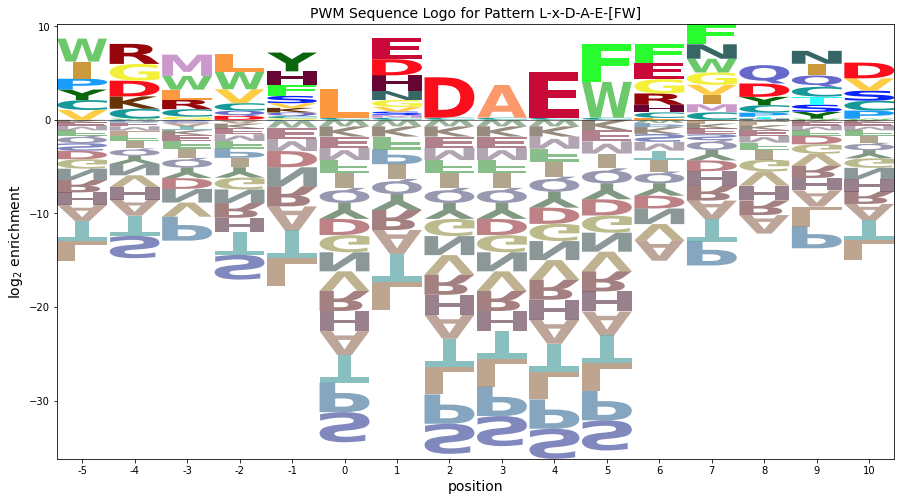

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.322578,0.000000,0.000000,0.000000,0.000000,0.645156,0.000000,0.000000,0.129031,0.000000,0.258063,0.258063,0.193547
1,0.000000,0.0,0.352481,0.000000,0.000000,0.422978,0.000000,0.000000,0.140993,0.140993,0.000000,0.000000,0.211489,0.000000,0.704963,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.064028,0.0,0.000000,0.000000,0.000000,0.064028,0.064028,0.000000,0.000000,0.320140,0.224098,0.000000,0.000000,0.000000,0.160070,0.128056,0.096042,0.000000,0.064028,0.000000
3,0.096852,0.0,0.096852,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.920094,0.000000,0.000000,0.096852,0.096852,0.000000,0.000000,0.000000,0.338982,0.145278,0.000000
4,0.000000,0.0,0.000000,0.000000,0.087527,0.052516,0.192559,0.035011,0.035011,0.000000,0.000000,0.000000,0.122537,0.052516,0.000000,0.262580,0.000000,0.087527,0.000000,0.210064
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.211313,0.211313,0.000000,0.105657,0.274707,0.000000,0.000000,0.000000,0.042263,0.147919,0.042263,0.000000,0.000000,0.232445,0.000000,0.105657,0.000000,0.000000
7,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


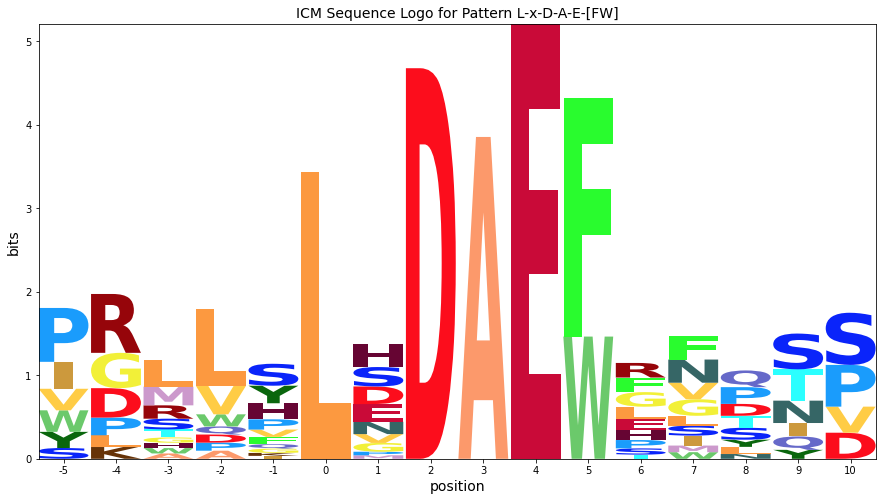

----------------------------------------------------------------------
O Pattern: T-A-E-[FW]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.111111,0.083333,0.000000,0.000000,0.055556,0.194444,0.000000,0.000000,0.000000,0.388889
1,0.000000,0.000000,0.152174,0.108696,0.000000,0.195652,0.000000,0.000000,0.000000,0.000000,0.000000,0.086957,0.065217,0.000000,0.000000,0.065217,0.000000,0.086957,0.108696,0.130435
2,0.078431,0.117647,0.000000,0.000000,0.000000,0.137255,0.000000,0.000000,0.078431,0.000000,0.058824,0.098039,0.000000,0.000000,0.196078,0.137255,0.000000,0.039216,0.000000,0.058824
3,0.145455,0.000000,0.090909,0.036364,0.000000,0.163636,0.000000,0.054545,0.000000,0.090909,0.109091,0.000000,0.036364,0.000000,0.145455,0.127273,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.241935,0.112903,0.000000,0.000000,0.000000,0.161290,0.112903,0.000000,0.032258,0.064516,0.000000,0.000000,0.096774,0.177419
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.549296,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.450704,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.952983,0.833613,1.677494,-0.599346,-0.798655,-1.236776,-1.544899,-0.973742,-0.488315,-2.368021,1.619488,0.570579,-2.530959,-1.014384,0.040064,0.387357,-2.368021,-1.488315,-0.092386,2.814504
1,-2.190023,0.596574,1.633100,1.748577,-1.035694,1.848113,-1.781938,-1.210781,-0.725354,-2.605060,-0.939479,0.655467,-0.767999,-1.251423,-1.781938,-0.849682,-2.605060,0.596574,2.255537,1.477929
2,0.026553,3.298576,-1.472253,-0.941739,-1.141047,1.420831,-1.887291,-1.316134,1.491221,-2.710413,0.955168,0.813149,-2.873352,-1.356776,1.572141,0.044965,-2.710413,-0.245745,-0.434779,0.565221
3,0.795478,0.412149,1.033638,0.564152,-1.220119,1.663688,-1.966362,0.604794,-0.909779,-0.204522,1.683451,-1.850885,-1.367461,-1.435848,1.203563,-0.034107,-2.789485,-1.909779,-0.513850,-1.513850
4,-2.503180,0.283416,-1.680058,-1.149544,-1.348852,-1.786973,1.904904,1.476061,-1.038512,-2.918218,-1.252637,1.479813,-0.081157,-1.564581,-0.510133,-0.840912,-2.918218,-2.038512,2.164771,1.942379
5,-2.653423,0.133173,-1.830301,-1.299786,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,3.101464,-2.188755,-0.792826,-1.792826
6,3.516502,0.133173,-1.830301,-1.299786,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,-3.068461,-2.188755,-0.792826,-1.792826
7,-2.653423,0.133173,-1.830301,4.870139,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,-3.068461,-2.188755,-0.792826,-1.792826
8,-2.653423,0.133173,-1.830301,-1.299786,3.822833,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,-3.068461,-2.188755,4.251568,-1.792826


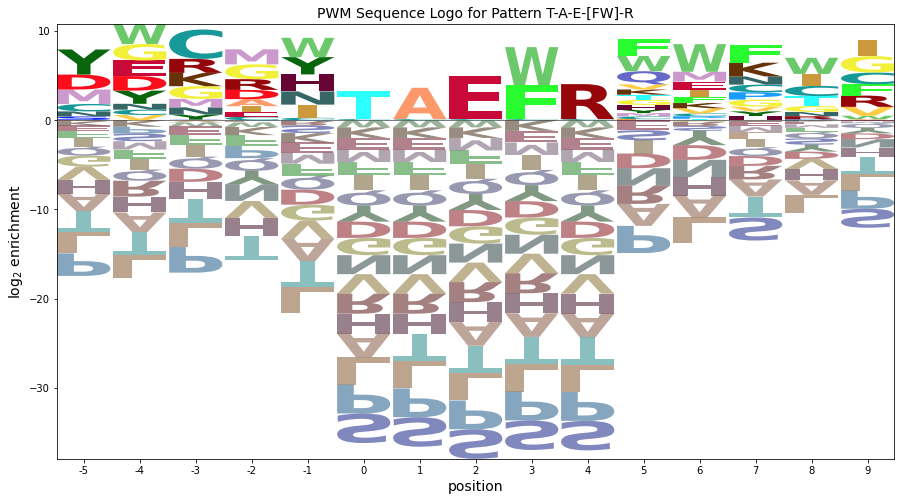

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.350082,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.233388,0.175041,0.000000,0.000000,0.116694,0.408429,0.000000,0.000000,0.000000,0.816858
1,0.000000,0.000000,0.229317,0.163798,0.000000,0.294837,0.000000,0.000000,0.000000,0.000000,0.000000,0.131038,0.098279,0.000000,0.000000,0.098279,0.000000,0.131038,0.163798,0.196558
2,0.109752,0.164628,0.000000,0.000000,0.000000,0.192066,0.000000,0.000000,0.109752,0.000000,0.082314,0.137190,0.000000,0.000000,0.274380,0.192066,0.000000,0.054876,0.000000,0.082314
3,0.150231,0.000000,0.093894,0.037558,0.000000,0.169010,0.000000,0.056337,0.000000,0.093894,0.112673,0.000000,0.037558,0.000000,0.150231,0.131452,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.380359,0.177501,0.000000,0.000000,0.000000,0.253573,0.177501,0.000000,0.050715,0.101429,0.000000,0.000000,0.152144,0.278930
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000
6,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,2.380670,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.953371,0.000000


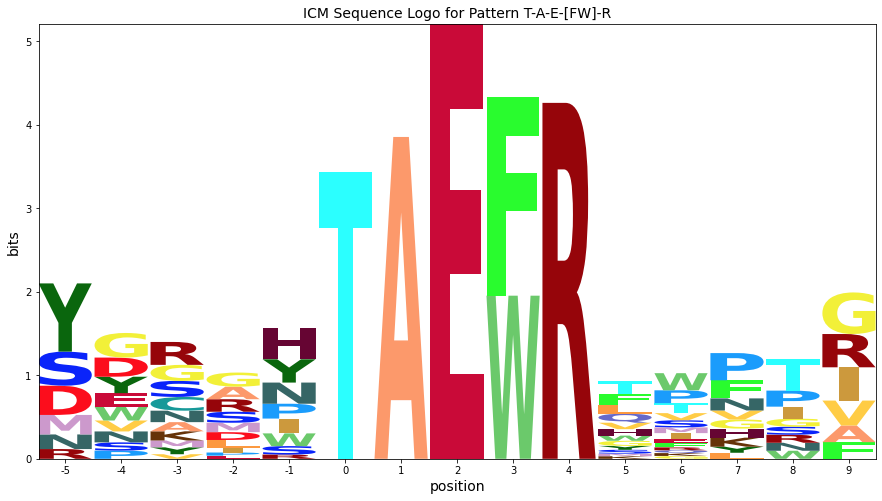

----------------------------------------------------------------------
P Pattern: S-A-E-x-R-[FL]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.095238,0.0,0.000000,0.000000,0.000000,0.095238,0.142857,0.000000,0.238095,0.000000,0.142857,0.000000,0.000000,0.000000,0.190476,0.000000,0.000000,0.095238,0.000000,0.000000
1,0.068966,0.0,0.068966,0.000000,0.000000,0.137931,0.000000,0.000000,0.000000,0.172414,0.000000,0.172414,0.068966,0.068966,0.103448,0.137931,0.000000,0.000000,0.000000,0.000000
2,0.129032,0.0,0.064516,0.000000,0.096774,0.000000,0.129032,0.064516,0.000000,0.000000,0.161290,0.000000,0.000000,0.000000,0.000000,0.161290,0.064516,0.000000,0.064516,0.064516
3,0.000000,0.0,0.000000,0.065217,0.043478,0.000000,0.043478,0.195652,0.000000,0.000000,0.000000,0.282609,0.043478,0.000000,0.000000,0.065217,0.043478,0.108696,0.000000,0.108696
4,0.130435,0.0,0.000000,0.000000,0.000000,0.000000,0.043478,0.043478,0.000000,0.000000,0.000000,0.108696,0.260870,0.043478,0.000000,0.086957,0.108696,0.173913,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.217391,0.000000,0.086957,0.000000,0.000000,0.000000,0.043478,0.043478,0.000000,0.000000,0.000000,0.065217,0.000000,0.000000,0.108696,0.434783


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.081782,1.283416,-0.680058,-0.149544,-0.348852,0.797989,0.904904,-0.523939,2.546450,-1.918218,1.747363,-0.979619,-2.081157,-0.564581,1.226832,-2.162840,-1.918218,0.546450,0.357416,-0.642584
1,-0.175376,1.026258,0.647746,-0.406701,-0.606010,1.277797,-1.352254,-0.781097,-0.295670,0.409587,-0.509795,1.348186,-0.753352,0.763224,0.647746,-0.098070,-2.175376,-1.295670,0.100259,-0.899741
2,0.503874,0.968543,0.590031,-0.464417,1.336274,-1.101847,0.911959,0.746150,-0.353386,-2.233091,2.017452,-1.294492,-2.396030,-0.879454,-1.409969,0.107249,-0.648129,-1.353386,1.627506,0.627506
3,-2.190023,0.596574,-1.366900,1.163614,0.549268,-1.473816,-0.196975,2.111147,-0.725354,-2.605060,-0.939479,2.140894,-1.183036,-1.251423,-1.781938,-0.849682,-1.020098,0.859608,-0.329426,1.255537
4,0.617332,0.596574,-1.366900,-0.836386,-1.035694,-1.473816,-0.196975,0.374181,-0.725354,-2.605060,-0.939479,0.918502,0.932441,0.333539,-1.781938,-0.527754,-0.020098,1.444571,-0.329426,-1.329426
5,-2.190023,0.596574,-1.366900,-0.836386,-1.035694,-1.473816,-1.781938,-1.210781,-0.725354,-2.605060,-0.939479,-1.666461,-2.767999,-1.251423,-1.781938,2.704906,-2.605060,-1.725354,-0.329426,-1.329426
6,3.364566,0.596574,-1.366900,-0.836386,-1.035694,-1.473816,-1.781938,-1.210781,-0.725354,-2.605060,-0.939479,-1.666461,-2.767999,-1.251423,-1.781938,-2.849682,-2.605060,-1.725354,-0.329426,-1.329426
7,-2.190023,0.596574,-1.366900,4.718203,-1.035694,-1.473816,-1.781938,-1.210781,-0.725354,-2.605060,-0.939479,-1.666461,-2.767999,-1.251423,-1.781938,-2.849682,-2.605060,-1.725354,-0.329426,-1.329426
8,-2.190023,0.596574,-1.366900,-0.836386,2.423737,-1.473816,0.539990,-1.210781,-0.725354,-2.605060,0.645483,-0.081498,-2.767999,-1.251423,-1.781938,-0.849682,-2.605060,-1.725354,2.255537,3.062892


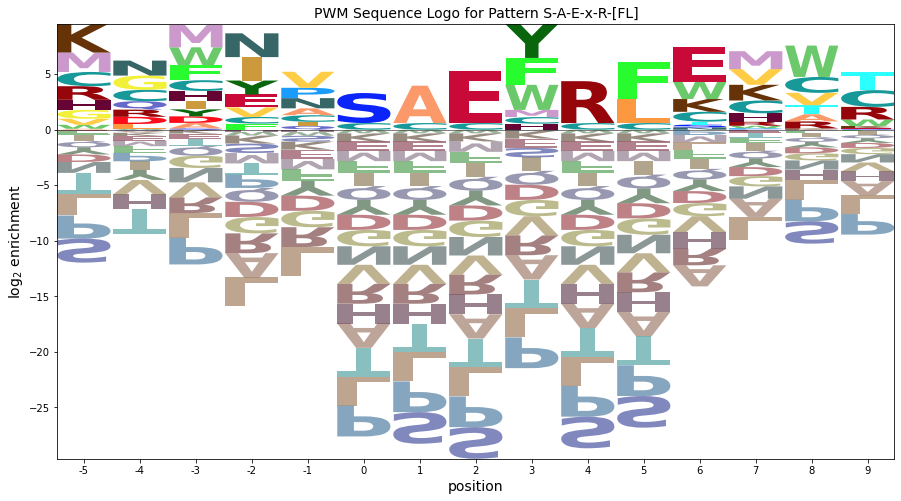

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.181931,0.0,0.000000,0.000000,0.000000,0.181931,0.272897,0.000000,0.454828,0.000000,0.272897,0.000000,0.000000,0.000000,0.363863,0.000000,0.000000,0.181931,0.000000,0.000000
1,0.064756,0.0,0.064756,0.000000,0.000000,0.129513,0.000000,0.000000,0.000000,0.161891,0.000000,0.161891,0.064756,0.064756,0.097135,0.129513,0.000000,0.000000,0.000000,0.000000
2,0.150453,0.0,0.075227,0.000000,0.112840,0.000000,0.150453,0.075227,0.000000,0.000000,0.188067,0.000000,0.000000,0.000000,0.000000,0.188067,0.075227,0.000000,0.075227,0.075227
3,0.000000,0.0,0.000000,0.093641,0.062427,0.000000,0.062427,0.280922,0.000000,0.000000,0.000000,0.405776,0.062427,0.000000,0.000000,0.093641,0.062427,0.156068,0.000000,0.156068
4,0.119953,0.0,0.000000,0.000000,0.000000,0.000000,0.039984,0.039984,0.000000,0.000000,0.000000,0.099961,0.239905,0.039984,0.000000,0.079968,0.099961,0.159937,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.531661,0.000000,0.212664,0.000000,0.000000,0.000000,0.106332,0.106332,0.000000,0.000000,0.000000,0.159498,0.000000,0.000000,0.265830,1.063321


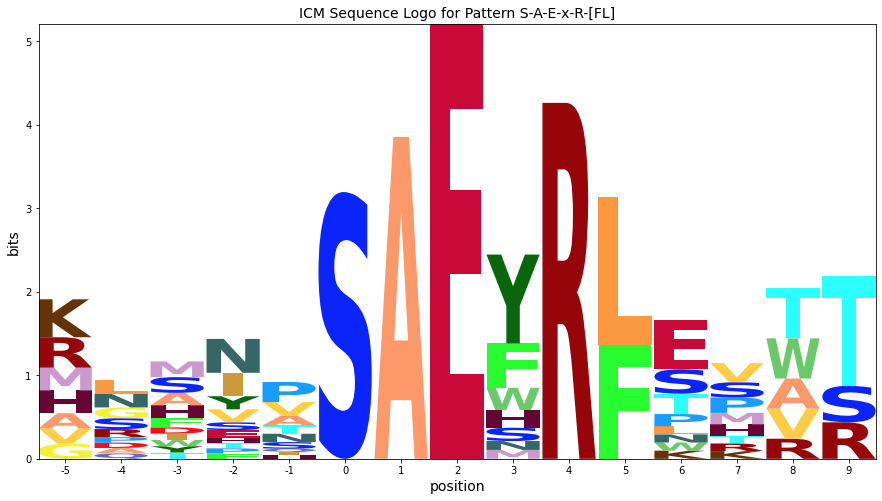

----------------------------------------------------------------------
Q Pattern: P-Q-x-G-[FL]-L
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.133333,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.133333,0.333333,0.133333,0.000000,0.133333,0.133333,0.000000,0.000000,0.0,0.000000
1,0.083333,0.0,0.083333,0.000000,0.125000,0.000000,0.291667,0.083333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,0.0,0.166667
2,0.060606,0.0,0.090909,0.000000,0.060606,0.060606,0.000000,0.121212,0.0,0.000000,0.151515,0.121212,0.060606,0.060606,0.000000,0.060606,0.090909,0.000000,0.0,0.060606
3,0.055556,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.055556,0.055556,0.166667,0.000000,0.194444,0.250000,0.055556,0.0,0.000000
4,0.131579,0.0,0.000000,0.105263,0.000000,0.184211,0.052632,0.000000,0.0,0.052632,0.000000,0.000000,0.052632,0.000000,0.000000,0.263158,0.105263,0.052632,0.0,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.157895,0.0,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.289474,0.052632,0.052632,0.078947,0.000000,0.000000,0.184211,0.131579,0.000000,0.0,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.274911,1.511685,-0.451789,1.663688,-0.120583,-0.558704,-0.866827,-0.295670,0.189757,-1.689949,1.560594,1.833613,-0.267925,-0.336312,0.718136,-0.349609,-1.689949,-0.810243,0.585685,-0.414315
1,-0.020098,1.181536,0.803025,-0.251423,1.549268,-0.888853,1.803025,0.959144,-0.140392,-2.020098,-0.354517,-1.081498,-2.183036,-0.666461,-1.196975,-2.264720,0.301831,-1.140392,0.255537,1.577465
2,-0.288586,0.913047,0.949573,-0.519912,0.865742,0.427621,-1.465464,1.427621,-0.408881,-2.288586,1.961957,0.971941,-0.866562,0.650013,-1.465464,-0.948246,-0.288586,-1.408881,-0.012952,0.572011
3,-0.368021,0.833613,-1.129861,1.400654,1.201345,-1.236776,-1.544899,-0.973742,-0.488315,-2.368021,-0.702440,0.155541,-0.945997,1.792971,-1.544899,0.387357,0.953907,0.096647,-0.092386,-1.092386
4,0.581353,0.782987,-1.180487,1.671956,-0.849281,1.712598,-0.010562,-1.024368,-0.538941,-0.833684,-0.753066,-1.480047,-0.996623,-1.065010,-1.595525,0.796162,-0.096719,0.046021,-0.143013,-1.143013
5,-2.003609,0.782987,-1.180487,-0.649972,-0.849281,-1.287402,-1.595525,-1.024368,-0.538941,-2.418647,-0.753066,-1.480047,2.703817,-1.065010,-1.595525,-2.663269,-2.418647,-1.538941,-0.143013,-1.143013
6,-2.003609,0.782987,-1.180487,-0.649972,-0.849281,-1.287402,-1.595525,-1.024368,-0.538941,-2.418647,-0.753066,-1.480047,-2.581586,4.220392,-1.595525,-2.663269,-2.418647,-1.538941,-0.143013,-1.143013
7,0.803745,0.782987,0.404475,-0.649972,-0.849281,-1.287402,-1.595525,-1.024368,-0.538941,1.166316,0.831897,0.104915,-0.581586,-1.065010,-1.595525,0.336731,0.166316,-1.538941,-0.143013,-1.143013
8,-2.003609,0.782987,-1.180487,-0.649972,-0.849281,3.998000,-1.595525,-1.024368,-0.538941,-2.418647,-0.753066,-1.480047,-2.581586,-1.065010,-1.595525,-2.663269,-2.418647,-1.538941,-0.143013,-1.143013


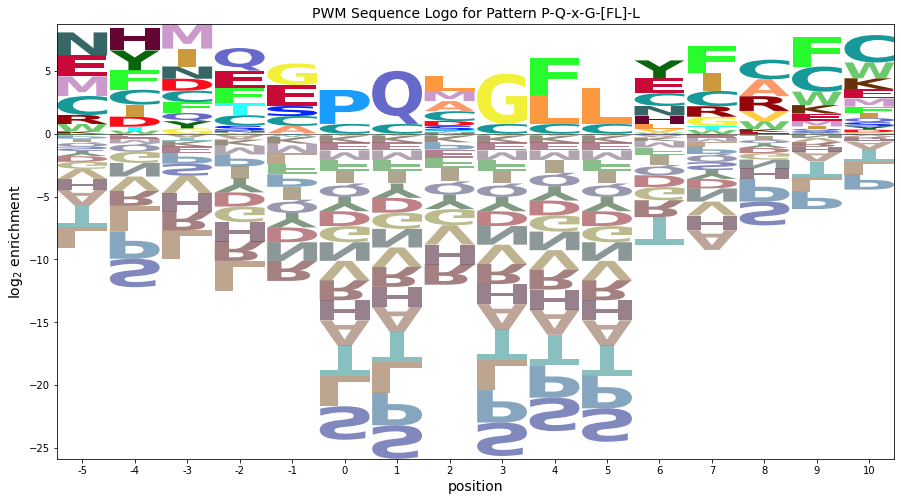

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.239902,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.239902,0.599754,0.239902,0.000000,0.239902,0.239902,0.000000,0.000000,0.0,0.000000
1,0.140898,0.0,0.140898,0.000000,0.211348,0.000000,0.493144,0.140898,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.281797,0.000000,0.0,0.281797
2,0.055466,0.0,0.083198,0.000000,0.055466,0.055466,0.000000,0.110931,0.0,0.000000,0.138664,0.110931,0.055466,0.055466,0.000000,0.055466,0.083198,0.000000,0.0,0.055466
3,0.060900,0.0,0.000000,0.091351,0.091351,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.060900,0.060900,0.182701,0.000000,0.213152,0.274052,0.060900,0.0,0.000000
4,0.129695,0.0,0.000000,0.103756,0.000000,0.181573,0.051878,0.000000,0.0,0.051878,0.000000,0.000000,0.051878,0.000000,0.000000,0.259391,0.103756,0.051878,0.0,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,3.276395,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.792971,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.144709,0.0,0.048236,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.265300,0.048236,0.048236,0.072355,0.000000,0.000000,0.168828,0.120591,0.000000,0.0,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,4.570579,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


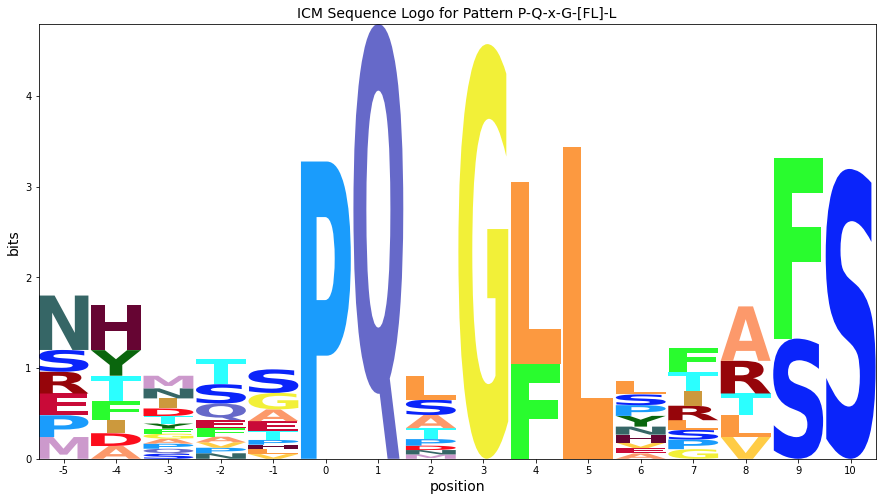

----------------------------------------------------------------------
R Pattern: A-E-F-R-[AT]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.178571,0.000000,0.000000,0.000000,0.000000,0.000000,0.464286,0.000000,0.214286,0.071429,0.000000,0.000000,0.000000,0.000000,0.071429,0.000000,0.000000
1,0.162791,0.0,0.000000,0.000000,0.000000,0.046512,0.209302,0.046512,0.000000,0.000000,0.116279,0.000000,0.116279,0.000000,0.162791,0.000000,0.000000,0.000000,0.046512,0.093023
2,0.067797,0.0,0.033898,0.084746,0.067797,0.118644,0.033898,0.067797,0.000000,0.084746,0.152542,0.000000,0.000000,0.000000,0.084746,0.118644,0.033898,0.050847,0.000000,0.000000
3,0.169014,0.0,0.098592,0.000000,0.000000,0.056338,0.000000,0.000000,0.000000,0.070423,0.000000,0.154930,0.028169,0.000000,0.056338,0.183099,0.126761,0.000000,0.000000,0.056338
4,0.037500,0.0,0.150000,0.187500,0.000000,0.075000,0.000000,0.025000,0.000000,0.037500,0.000000,0.175000,0.000000,0.000000,0.000000,0.212500,0.100000,0.000000,0.000000,0.000000
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.730591,1.056005,-0.907469,2.208009,-0.576263,-1.014384,-1.322506,-0.751350,-0.265923,1.661726,-0.480047,1.600326,-0.723605,-0.791991,-1.322506,-2.390251,-2.145628,0.319040,0.130006,-0.869994
1,0.877092,0.663688,-1.299786,-0.769271,-0.968580,0.178261,1.607104,0.441296,-0.658240,-2.537946,1.712598,-1.599346,-0.115922,-1.184309,1.285176,-2.782568,-2.537946,-1.658240,1.322651,1.059617
2,-0.127481,0.337187,-0.041324,1.489190,1.026847,1.266798,-0.456362,0.851760,-0.984741,-0.279484,2.123062,-1.925847,-3.027385,-1.510810,0.543638,-0.109069,-1.279484,0.015259,-0.588812,-1.588812
3,1.047017,0.133173,1.169699,-1.299786,-1.499095,0.384712,-2.245338,-1.674182,-1.188755,-0.483498,-1.402880,1.455101,-1.646437,-1.714824,0.076590,0.494272,0.253468,-2.188755,-0.792826,0.529102
4,-0.789485,-0.002888,1.734077,2.564152,-1.635156,0.734077,-2.381400,-0.225281,-1.324816,-1.204522,-1.538941,1.640968,-3.367461,-1.850885,-2.381400,0.720780,-0.034597,-2.324816,-0.928888,-1.928888
5,3.556986,-0.031457,-1.994932,-1.464417,-1.663726,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,-3.477714,-3.233091,-2.353386,-0.957457,-1.957457
6,-2.818054,-0.031457,-1.994932,4.910623,-1.663726,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,-3.477714,-3.233091,-2.353386,-0.957457,-1.957457
7,-2.818054,-0.031457,-1.994932,-1.464417,4.711314,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,-2.409969,-3.477714,-3.233091,-2.353386,-0.957457,-1.957457
8,-2.818054,-0.031457,-1.994932,-1.464417,-1.663726,-2.101847,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,-2.294492,-3.396030,-1.879454,3.965070,-3.477714,-3.233091,-2.353386,-0.957457,-1.957457


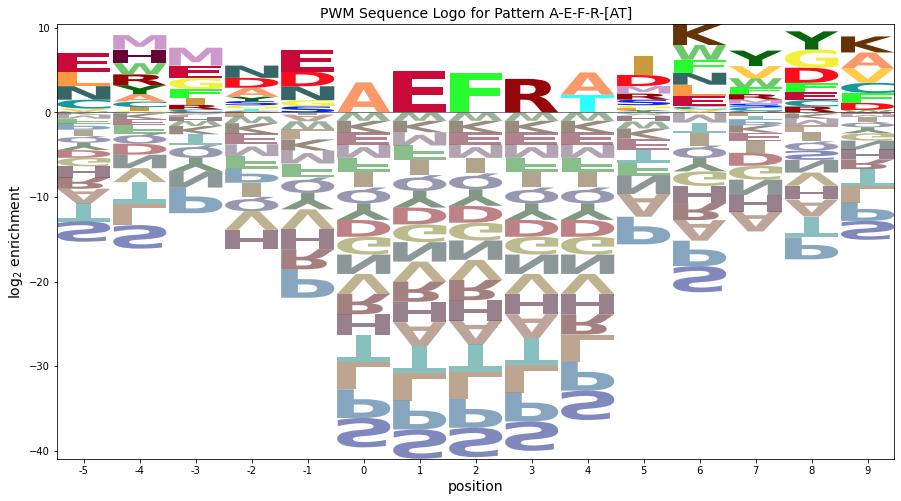

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.362430,0.000000,0.000000,0.000000,0.000000,0.000000,0.942318,0.000000,0.434916,0.144972,0.000000,0.000000,0.000000,0.000000,0.144972,0.000000,0.000000
1,0.219225,0.0,0.000000,0.000000,0.000000,0.062636,0.281861,0.062636,0.000000,0.000000,0.156590,0.000000,0.156590,0.000000,0.219225,0.000000,0.000000,0.000000,0.062636,0.125272
2,0.054804,0.0,0.027402,0.068505,0.054804,0.095906,0.027402,0.054804,0.000000,0.068505,0.123308,0.000000,0.000000,0.000000,0.068505,0.095906,0.027402,0.041103,0.000000,0.000000
3,0.133108,0.0,0.077646,0.000000,0.000000,0.044369,0.000000,0.000000,0.000000,0.055462,0.000000,0.122015,0.022185,0.000000,0.044369,0.144200,0.099831,0.000000,0.000000,0.044369
4,0.049695,0.0,0.198780,0.248474,0.000000,0.099390,0.000000,0.033130,0.000000,0.049695,0.000000,0.231909,0.000000,0.000000,0.000000,0.281604,0.132520,0.000000,0.000000,0.000000
5,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,5.008700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.262456,0.000000,0.000000,0.000000,0.000000,0.000000


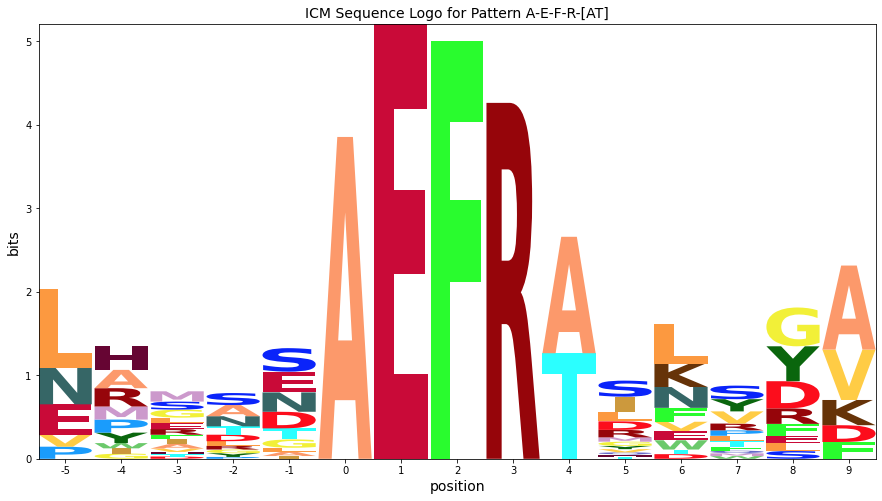

----------------------------------------------------------------------
S Pattern: P-[DS]-A-E-F
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.107143,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.142857,0.357143,0.000000,0.000,0.392857
1,0.100000,0.0,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.200000,0.0,0.000000,0.075000,0.275000,0.000000,0.125,0.000000
2,0.000000,0.0,0.000000,0.000000,0.068966,0.000000,0.000000,0.379310,0.103448,0.000000,0.000000,0.000000,0.000000,0.0,0.189655,0.086207,0.086207,0.086207,0.000,0.000000
3,0.052632,0.0,0.000000,0.000000,0.000000,0.000000,0.039474,0.000000,0.000000,0.000000,0.065789,0.092105,0.000000,0.0,0.052632,0.039474,0.381579,0.144737,0.000,0.131579
4,0.113636,0.0,0.000000,0.045455,0.000000,0.079545,0.000000,0.000000,0.000000,0.068182,0.000000,0.056818,0.000000,0.0,0.204545,0.170455,0.056818,0.045455,0.000,0.159091
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000,0.000000
6,0.000000,0.0,0.420455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.579545,0.000000,0.000000,0.000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.269409,1.056005,-0.907469,-0.376954,-0.576263,-1.014384,-1.322506,-0.751350,-0.265923,-2.145628,-0.480047,-1.207029,-2.308567,-0.791991,-1.322506,-0.068323,1.313803,-1.265923,0.130006,2.714968
1,0.269409,0.734077,-1.229397,-0.698882,1.423737,-1.336312,-1.644434,-1.073278,-0.587851,0.117406,-0.801976,-1.528957,0.539430,-1.113920,-1.644434,-0.712179,1.117406,-1.587851,2.393040,-1.191922
2,-2.431031,0.355566,-1.607908,-1.077394,1.045226,-1.714824,-2.022946,3.071773,1.840993,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,1.562017,-0.505728,-0.261106,0.618600,-0.570434,-1.570434
3,-0.408663,0.056005,-1.907469,-1.376954,-1.576263,-2.014384,-0.322506,-1.751350,-1.265923,-3.145628,1.104915,0.792971,-3.308567,-1.791991,-0.000578,-1.390251,1.761262,1.319040,-0.869994,1.589438
4,0.558916,-0.113920,-2.077394,0.775049,-1.746188,0.815691,-2.492431,-1.921275,-1.435848,-0.508199,-1.649972,0.208009,-3.478492,-1.961916,1.755496,0.439824,-0.730591,-0.113920,-1.039919,1.866972
5,-2.900516,-0.113920,-2.077394,-1.546879,-1.746188,-2.184309,-2.492431,-1.921275,-1.435848,-3.315553,-1.649972,-2.376954,2.997241,-1.961916,-2.492431,-3.560176,-3.315553,-2.435848,-1.039919,-2.039919
6,-2.900516,-0.113920,3.170534,-1.546879,-1.746188,-2.184309,-2.492431,-1.921275,-1.435848,-3.315553,-1.649972,-2.376954,-3.478492,-1.961916,-2.492431,2.140264,-3.315553,-2.435848,-1.039919,-2.039919
7,3.575217,-0.113920,-2.077394,-1.546879,-1.746188,-2.184309,-2.492431,-1.921275,-1.435848,-3.315553,-1.649972,-2.376954,-3.478492,-1.961916,-2.492431,-3.560176,-3.315553,-2.435848,-1.039919,-2.039919
8,-2.900516,-0.113920,-2.077394,4.928854,-1.746188,-2.184309,-2.492431,-1.921275,-1.435848,-3.315553,-1.649972,-2.376954,-3.478492,-1.961916,-2.492431,-3.560176,-3.315553,-2.435848,-1.039919,-2.039919


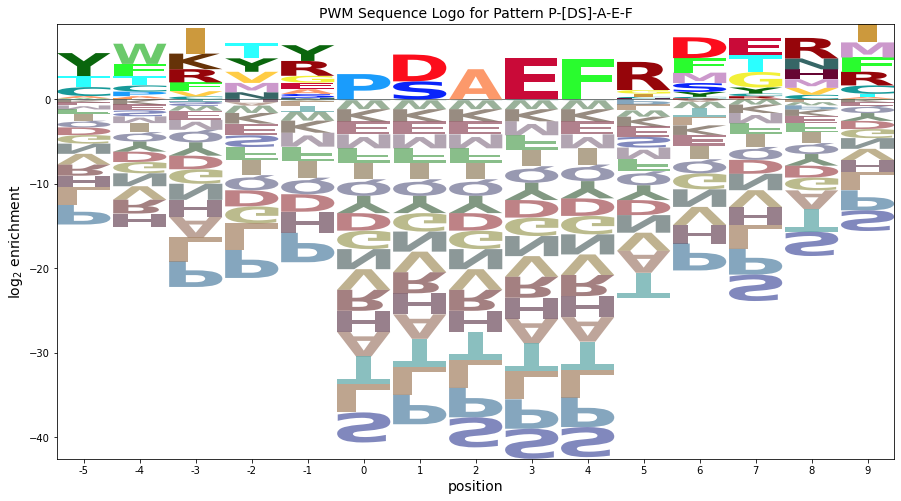

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.229676,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.306234,0.765586,0.000000,0.000000,0.842144
1,0.120006,0.0,0.000000,0.000000,0.120006,0.000000,0.000000,0.000000,0.000000,0.150008,0.000000,0.000000,0.240013,0.0,0.000000,0.090005,0.330018,0.000000,0.150008,0.000000
2,0.000000,0.0,0.000000,0.000000,0.136359,0.000000,0.000000,0.749975,0.204539,0.000000,0.000000,0.000000,0.000000,0.0,0.374988,0.170449,0.170449,0.170449,0.000000,0.000000
3,0.068900,0.0,0.000000,0.000000,0.000000,0.000000,0.051675,0.000000,0.000000,0.000000,0.086125,0.120575,0.000000,0.0,0.068900,0.051675,0.499525,0.189475,0.000000,0.172250
4,0.109966,0.0,0.000000,0.043986,0.000000,0.076976,0.000000,0.000000,0.000000,0.065980,0.000000,0.054983,0.000000,0.0,0.197939,0.164949,0.054983,0.043986,0.000000,0.153952
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.276395,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.192615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.643874,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


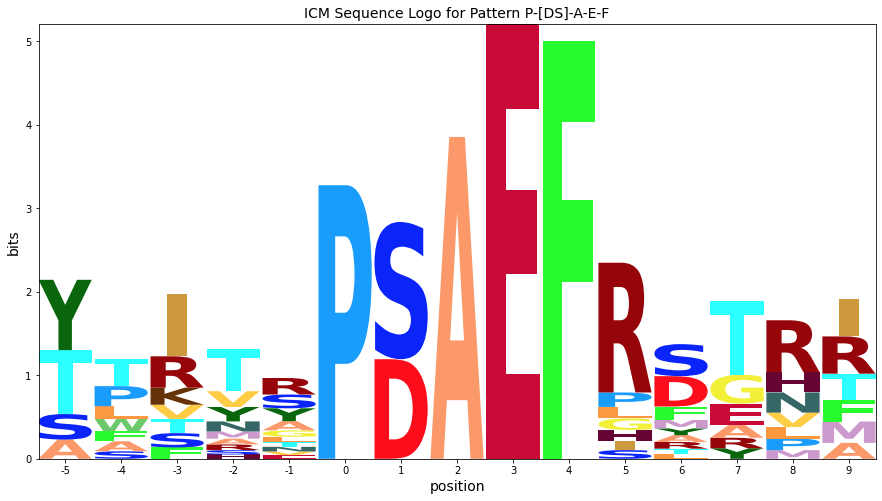

----------------------------------------------------------------------
T Pattern: A-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.117647,0.000000,0.205882,0.000000,0.000000,0.000000,0.000000,0.441176,0.000000,0.000000,0.000000,0.058824,0.088235,0.088235,0.000000,0.000000
1,0.043478,0.0,0.000000,0.000000,0.043478,0.152174,0.000000,0.000000,0.000000,0.391304,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.217391,0.108696,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.186441,0.355932,0.000000,0.000000,0.000000,0.000000,0.050847,0.067797,0.118644,0.000000,0.067797,0.033898,0.050847,0.000000,0.067797
3,0.033898,0.0,0.033898,0.000000,0.101695,0.067797,0.000000,0.000000,0.050847,0.118644,0.033898,0.101695,0.254237,0.000000,0.050847,0.000000,0.033898,0.000000,0.084746,0.033898
4,0.000000,0.0,0.000000,0.000000,0.081967,0.098361,0.327869,0.000000,0.000000,0.049180,0.000000,0.032787,0.000000,0.000000,0.114754,0.049180,0.147541,0.032787,0.032787,0.032787
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.765625,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.234375,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.900516,0.886080,-1.077394,-0.546879,1.575740,-1.184309,1.507569,-0.921275,-0.435848,-2.315553,-0.649972,2.623046,-2.478492,-0.961916,-1.492431,-0.975213,-0.315553,0.564152,-0.039919,-1.039919
1,-0.605060,0.596574,-1.366900,-0.836386,0.549268,1.526184,-1.781938,-1.210781,-0.725354,1.642867,-0.939479,-1.666461,-2.767999,-1.251423,-1.781938,-1.264720,0.854372,0.859608,-0.329426,-1.329426
2,-2.449409,0.337187,-1.626287,-1.095772,-1.295081,1.851760,2.418107,-1.470168,-0.984741,-2.864447,-1.198866,0.074153,-0.705457,1.489190,-2.041324,-0.787141,-1.279484,0.015259,-0.588812,0.733116
3,-0.864447,0.337187,-0.041324,-1.095772,1.512274,0.588726,-2.041324,-1.470168,1.015259,0.135553,0.386097,0.881508,0.972615,-1.510810,-0.041324,-3.109069,-1.279484,-1.984741,1.996150,-0.003850
4,-2.485478,0.301118,-1.662356,-1.131841,1.253812,1.038084,2.314924,-1.506237,-1.020810,-0.900516,-1.234935,-0.376954,-3.063455,-1.546879,0.922606,-1.145138,0.421412,-0.435848,0.960081,-0.039919
5,3.484422,0.248650,-1.714824,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
6,-2.537946,0.248650,3.929033,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,0.802394,-2.952983,-2.073278,-0.677349,-1.677349
7,3.484422,0.248650,-1.714824,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
8,-2.537946,0.248650,-1.714824,4.838059,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349


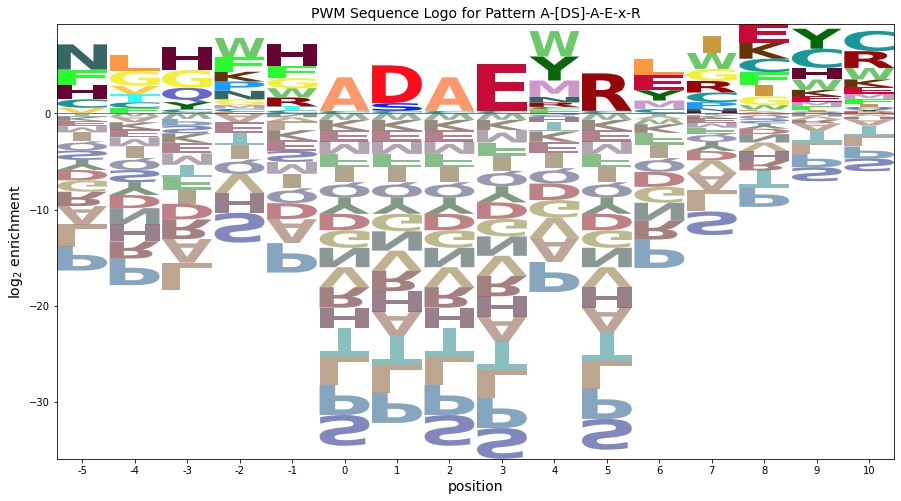

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.242202,0.000000,0.423854,0.000000,0.000000,0.000000,0.000000,0.908258,0.000000,0.000000,0.000000,0.121101,0.181652,0.181652,0.000000,0.000000
1,0.061873,0.0,0.000000,0.000000,0.061873,0.216555,0.000000,0.000000,0.000000,0.556855,0.000000,0.000000,0.000000,0.000000,0.000000,0.061873,0.309364,0.154682,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.282601,0.539511,0.000000,0.000000,0.000000,0.000000,0.077073,0.102764,0.179837,0.000000,0.102764,0.051382,0.077073,0.000000,0.102764
3,0.028752,0.0,0.028752,0.000000,0.086256,0.057504,0.000000,0.000000,0.043128,0.100632,0.028752,0.086256,0.215640,0.000000,0.043128,0.000000,0.028752,0.000000,0.071880,0.028752
4,0.000000,0.0,0.000000,0.000000,0.099620,0.119543,0.398478,0.000000,0.000000,0.059772,0.000000,0.039848,0.000000,0.000000,0.139467,0.059772,0.179315,0.039848,0.039848,0.039848
5,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,2.713686,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.830720,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


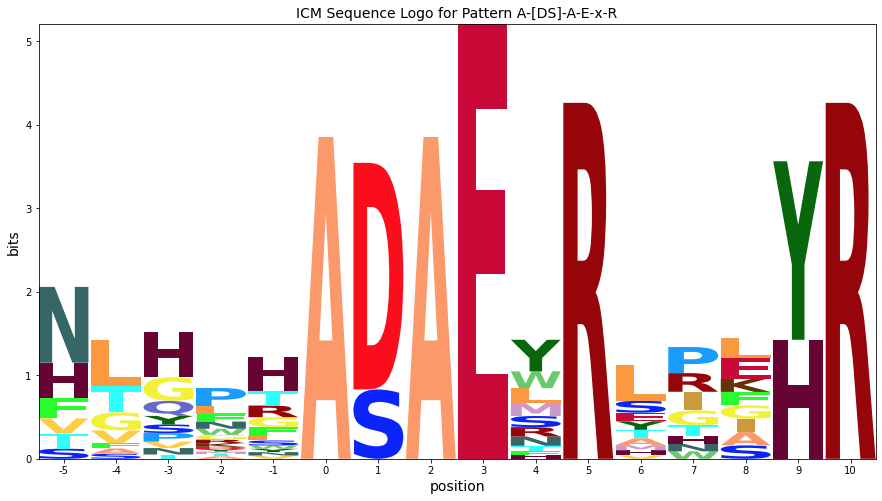

----------------------------------------------------------------------
U Pattern: T-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.157895,0.0,0.000000,0.000000,0.263158,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.105263,0.000000,0.000000,0.000000,0.210526,0.263158,0.000000,0.000000,0.000000
1,0.000000,0.0,0.160000,0.000000,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120000,0.200000,0.000000,0.000000,0.080000,0.360000,0.000000,0.000000,0.000000,0.000000
2,0.052632,0.0,0.052632,0.184211,0.131579,0.105263,0.052632,0.000000,0.000000,0.105263,0.000000,0.078947,0.000000,0.184211,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.052632,0.184211,0.000000,0.052632,0.000000,0.052632,0.078947,0.131579,0.105263,0.000000,0.236842,0.000000,0.105263,0.000000,0.000000,0.000000
4,0.245283,0.0,0.094340,0.000000,0.075472,0.000000,0.000000,0.075472,0.000000,0.037736,0.132075,0.000000,0.037736,0.000000,0.132075,0.037736,0.075472,0.056604,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.696429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.303571,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.568969,1.355566,-0.607908,-0.077394,2.308260,-0.714824,-1.022946,-0.451789,0.033638,-1.846068,-0.180487,0.677494,-2.009007,-0.492431,-1.022946,0.231238,0.738894,-0.966362,0.429566,-0.570434
1,-1.637482,1.149115,1.507569,-0.283845,1.101809,-0.921275,-1.229397,-0.658240,-0.172813,-2.052519,1.613062,1.471043,-2.215458,-0.698882,0.355566,1.024787,-2.052519,-1.172813,0.223115,-0.776885
2,-0.418647,0.782987,0.404475,2.350028,1.735681,1.034526,-0.010562,-1.024368,-0.538941,-0.096719,-0.753066,0.519953,-2.581586,1.934990,-1.595525,-2.663269,-0.833684,-1.538941,-0.143013,-1.143013
3,-2.003609,0.782987,-1.180487,-0.649972,0.735681,1.712598,-1.595525,0.560594,-0.538941,-0.833684,1.246934,1.104915,-0.259657,-1.065010,1.726403,-2.663269,-0.096719,-1.538941,-0.143013,-1.143013
4,1.471902,0.451143,1.072632,-0.981816,1.140803,-1.619246,-1.927368,0.965717,-0.870785,-1.165528,1.915090,-1.811891,-1.328467,-1.396854,1.072632,-1.410150,-0.428562,0.129215,-0.474856,-1.474856
5,-2.393556,0.393040,-1.570434,-1.039919,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,-1.454957,-1.985471,-3.053216,3.024297,-1.928888,-0.532959,-1.532959
6,-2.393556,0.393040,3.751494,-1.039919,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,-1.454957,-1.985471,1.116709,-2.808593,-1.928888,-0.532959,-1.532959
7,3.439334,0.393040,-1.570434,-1.039919,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,-1.454957,-1.985471,-3.053216,-2.808593,-1.928888,-0.532959,-1.532959
8,-2.393556,0.393040,-1.570434,4.792971,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,-1.454957,-1.985471,-3.053216,-2.808593,-1.928888,-0.532959,-1.532959


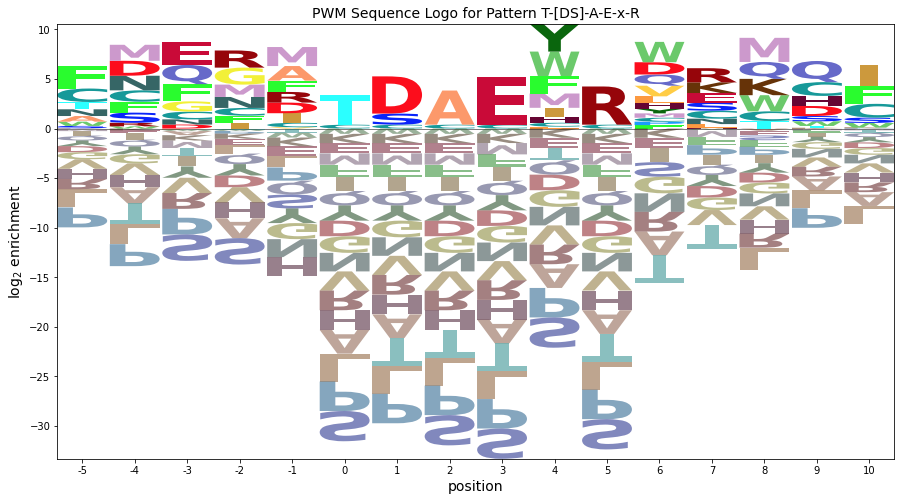

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.270927,0.0,0.000000,0.000000,0.451545,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.180618,0.000000,0.000000,0.000000,0.361236,0.451545,0.000000,0.000000,0.000000
1,0.000000,0.0,0.281642,0.000000,0.140821,0.000000,0.000000,0.000000,0.000000,0.000000,0.211231,0.352052,0.000000,0.000000,0.140821,0.633694,0.000000,0.000000,0.000000,0.000000
2,0.073320,0.0,0.073320,0.256622,0.183301,0.146641,0.073320,0.000000,0.000000,0.146641,0.000000,0.109981,0.000000,0.256622,0.000000,0.000000,0.073320,0.000000,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.066636,0.233224,0.000000,0.066636,0.000000,0.066636,0.099953,0.166589,0.133271,0.000000,0.299860,0.000000,0.133271,0.000000,0.000000,0.000000
4,0.255298,0.0,0.098191,0.000000,0.078553,0.000000,0.000000,0.078553,0.000000,0.039277,0.137468,0.000000,0.039277,0.000000,0.137468,0.039277,0.078553,0.058915,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000
6,0.000000,0.0,2.327291,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.014460,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


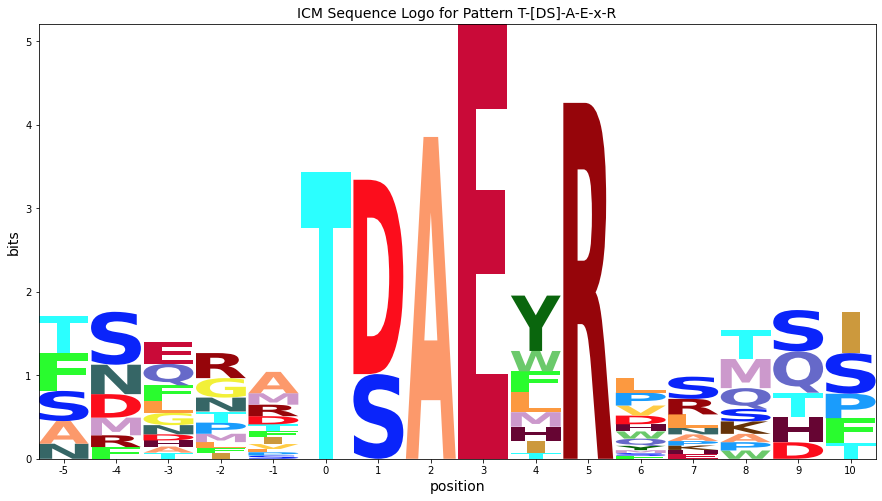

----------------------------------------------------------------------
V Pattern: S-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.392857,0.000000,0.000000,0.000000,0.000000,0.000000,0.410714,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.000000,0.107143,0.000000,0.000000,0.053571,0.000000
1,0.038462,0.000000,0.089744,0.000000,0.000000,0.038462,0.000000,0.000000,0.000000,0.038462,0.064103,0.000000,0.474359,0.000000,0.051282,0.115385,0.000000,0.089744,0.000000,0.000000
2,0.487500,0.000000,0.000000,0.037500,0.025000,0.087500,0.000000,0.025000,0.000000,0.037500,0.025000,0.050000,0.000000,0.000000,0.000000,0.037500,0.050000,0.037500,0.062500,0.037500
3,0.000000,0.275000,0.037500,0.037500,0.000000,0.000000,0.075000,0.187500,0.062500,0.037500,0.037500,0.075000,0.087500,0.000000,0.025000,0.000000,0.000000,0.025000,0.000000,0.037500
4,0.000000,0.000000,0.023256,0.000000,0.000000,0.058140,0.034884,0.000000,0.046512,0.093023,0.255814,0.081395,0.058140,0.000000,0.000000,0.069767,0.023256,0.034884,0.000000,0.220930
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.393556,4.916602,-1.570434,-1.039919,-1.239228,-1.677349,-1.985471,3.170648,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,0.130006,-1.985471,-0.245861,-2.808593,-1.928888,1.467041,-1.532959
1,-0.760338,0.026258,1.062784,-1.406701,-1.606010,-0.044131,-2.352254,-1.781097,-1.295670,-1.175376,1.075168,-2.236776,1.909613,-1.821739,-0.030325,-0.098070,-3.175376,0.704330,-0.899741,-1.899741
2,2.532443,-0.002888,-1.966362,0.564152,-0.050194,0.926722,-2.381400,-0.225281,-1.324816,-1.204522,0.046021,0.056005,-3.367461,-1.850885,-2.381400,-1.449145,-0.882594,-0.324816,1.656075,0.071112
3,-2.789485,4.520674,0.033638,0.564152,-1.635156,-2.073278,0.425955,2.189757,1.260146,-1.204522,0.461059,0.541432,-0.367461,-1.850885,-0.796437,-3.449145,-3.204522,-0.739854,-0.928888,0.071112
4,-2.873549,-0.086953,-0.465464,-1.519912,-1.719221,0.427621,-0.465464,-1.894307,0.913047,-0.118661,2.900557,0.650013,-0.866562,-1.934949,-2.465464,-0.725854,-1.703624,-0.408881,-1.012952,2.308976
5,-3.076366,-0.289769,-2.253244,-1.722729,-1.922038,-2.360159,-2.668281,-2.097124,-1.611698,-3.491403,-1.825822,-2.552804,-3.654342,-2.137766,-2.668281,2.950475,-3.491403,-2.611698,-1.215769,-2.215769
6,-3.076366,-0.289769,3.447196,-1.722729,-1.922038,-2.360159,-2.668281,-2.097124,-1.611698,-3.491403,-1.825822,-2.552804,-3.654342,-2.137766,-2.668281,1.964414,-3.491403,-2.611698,-1.215769,-2.215769
7,3.610135,-0.289769,-2.253244,-1.722729,-1.922038,-2.360159,-2.668281,-2.097124,-1.611698,-3.491403,-1.825822,-2.552804,-3.654342,-2.137766,-2.668281,-3.736026,-3.491403,-2.611698,-1.215769,-2.215769
8,-3.076366,-0.289769,-2.253244,4.963772,-1.922038,-2.360159,-2.668281,-2.097124,-1.611698,-3.491403,-1.825822,-2.552804,-3.654342,-2.137766,-2.668281,-3.736026,-3.491403,-2.611698,-1.215769,-2.215769


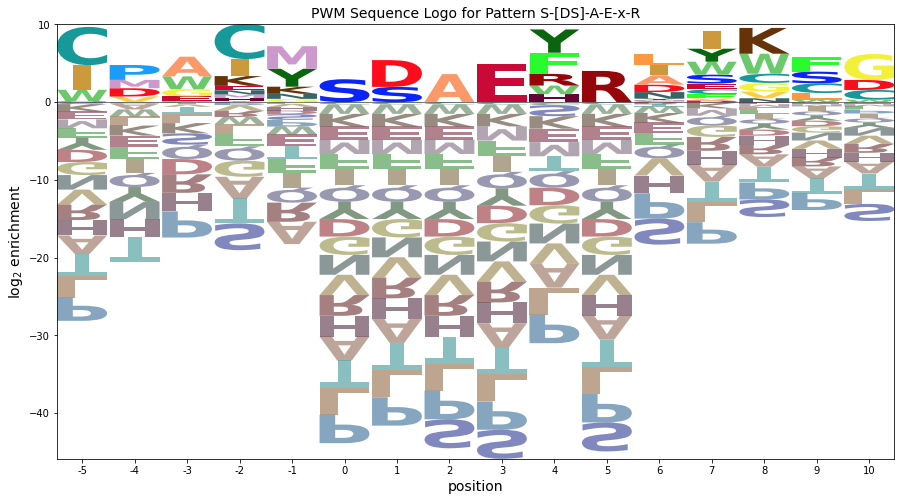

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,1.419728,0.000000,0.000000,0.000000,0.000000,0.000000,1.484261,0.000000,0.000000,0.000000,0.000000,0.000000,0.129066,0.000000,0.387198,0.000000,0.000000,0.193599,0.000000
1,0.047001,0.000000,0.109668,0.000000,0.000000,0.047001,0.000000,0.000000,0.000000,0.047001,0.078334,0.000000,0.579673,0.000000,0.062667,0.141002,0.000000,0.109668,0.000000,0.000000
2,0.683067,0.000000,0.000000,0.052544,0.035029,0.122602,0.000000,0.035029,0.000000,0.052544,0.035029,0.070058,0.000000,0.000000,0.000000,0.052544,0.070058,0.052544,0.087573,0.052544
3,0.000000,0.507329,0.069181,0.069181,0.000000,0.000000,0.138362,0.345906,0.115302,0.069181,0.069181,0.138362,0.161423,0.000000,0.046121,0.000000,0.000000,0.046121,0.000000,0.069181
4,0.000000,0.000000,0.030222,0.000000,0.000000,0.075554,0.045333,0.000000,0.060443,0.120887,0.332439,0.105776,0.075554,0.000000,0.000000,0.090665,0.030222,0.045333,0.000000,0.287106
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,1.468051,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.468051,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


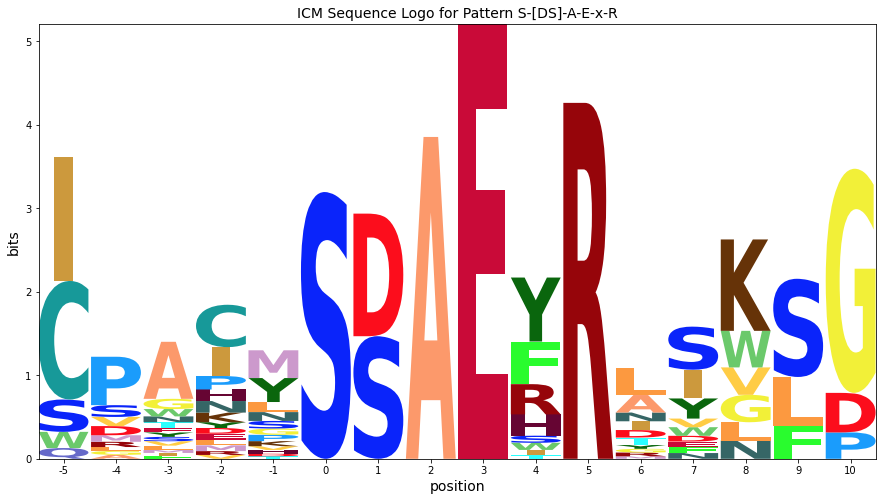

----------------------------------------------------------------------
W Pattern: D-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.421053,0.000000,0.000000,0.105263,0.105263,0.000000,0.000000,0.000000,0.368421,0.000000,0.000000,0.000000,0.000000
1,0.074074,0.0,0.000000,0.000000,0.000000,0.259259,0.074074,0.000000,0.000000,0.222222,0.111111,0.074074,0.000000,0.000000,0.000000,0.111111,0.000000,0.074074,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.066667,0.100000,0.100000,0.066667,0.066667,0.233333,0.000000,0.000000,0.000000,0.000000,0.066667,0.200000,0.000000,0.000000,0.000000,0.100000
3,0.048780,0.0,0.073171,0.121951,0.000000,0.000000,0.000000,0.000000,0.000000,0.048780,0.048780,0.073171,0.048780,0.219512,0.170732,0.000000,0.000000,0.000000,0.000000,0.146341
4,0.000000,0.0,0.062500,0.000000,0.000000,0.437500,0.041667,0.125000,0.000000,0.062500,0.041667,0.000000,0.041667,0.041667,0.000000,0.041667,0.062500,0.000000,0.000000,0.041667
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.388889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.611111,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.431031,1.355566,-0.607908,-0.077394,-0.276703,-0.714824,-1.022946,2.718136,0.033638,-1.846068,1.404475,0.677494,-2.009007,-0.492431,-1.022946,0.909309,-1.846068,-0.966362,0.429566,-0.570434
1,-0.115255,1.086379,-0.877095,-0.346580,-0.545889,2.015990,0.292830,-0.720976,-0.235549,0.692100,1.550326,0.408307,-2.278193,-0.761618,-1.292133,-0.359877,-2.115255,0.349413,0.160380,-0.839620
2,-1.789485,0.997112,-0.966362,-0.435848,0.949806,0.926722,0.618600,0.774719,1.260146,0.795478,-0.538941,-1.265923,-2.367461,-0.850885,0.203563,0.358210,-2.204522,-1.324816,0.071112,1.071112
3,-0.491403,0.710231,0.746756,1.862234,-0.922038,-1.360159,-1.668281,-1.097124,-0.611698,-0.906441,0.759140,0.447196,-1.069379,2.184162,1.331719,-2.736026,-2.491403,-1.611698,-0.215769,1.591586
4,-2.233091,0.553505,0.590031,-0.879454,-1.078763,2.942547,-0.240044,1.553505,-0.768423,-0.648129,0.602415,-1.709529,-1.226105,0.290471,-1.825007,-1.307789,-0.648129,-1.768423,-0.372494,0.212468
5,-2.355082,0.431515,4.249400,-1.001445,-1.200754,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,-3.014742,-2.770119,-1.890414,-0.494485,-1.494485
6,-2.355082,0.431515,2.927472,-1.001445,-1.200754,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,2.072721,-2.770119,-1.890414,-0.494485,-1.494485
7,3.426278,0.431515,-1.531960,-1.001445,-1.200754,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,-3.014742,-2.770119,-1.890414,-0.494485,-1.494485
8,-2.355082,0.431515,-1.531960,4.779915,-1.200754,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,-3.014742,-2.770119,-1.890414,-0.494485,-1.494485


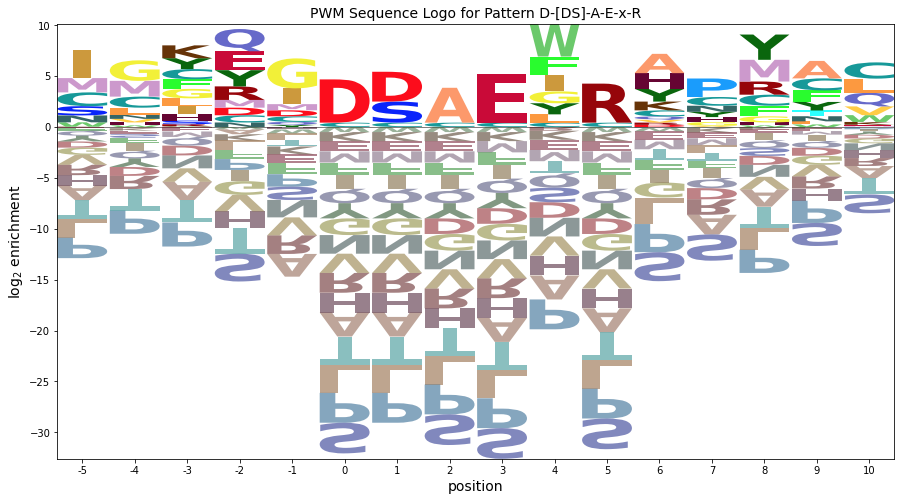

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.040187,0.000000,0.000000,0.260047,0.260047,0.000000,0.000000,0.000000,0.910164,0.000000,0.000000,0.000000,0.000000
1,0.097244,0.0,0.000000,0.000000,0.000000,0.340356,0.097244,0.000000,0.000000,0.291733,0.145867,0.097244,0.000000,0.000000,0.000000,0.145867,0.000000,0.097244,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.073232,0.109848,0.109848,0.073232,0.073232,0.256312,0.000000,0.000000,0.000000,0.000000,0.073232,0.219696,0.000000,0.000000,0.000000,0.109848
3,0.070161,0.0,0.105242,0.175403,0.000000,0.000000,0.000000,0.000000,0.000000,0.070161,0.070161,0.105242,0.070161,0.315725,0.245564,0.000000,0.000000,0.000000,0.000000,0.210484
4,0.000000,0.0,0.099323,0.000000,0.000000,0.695261,0.066215,0.198646,0.000000,0.099323,0.066215,0.000000,0.066215,0.066215,0.000000,0.066215,0.099323,0.000000,0.000000,0.066215
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.091716,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.715554,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


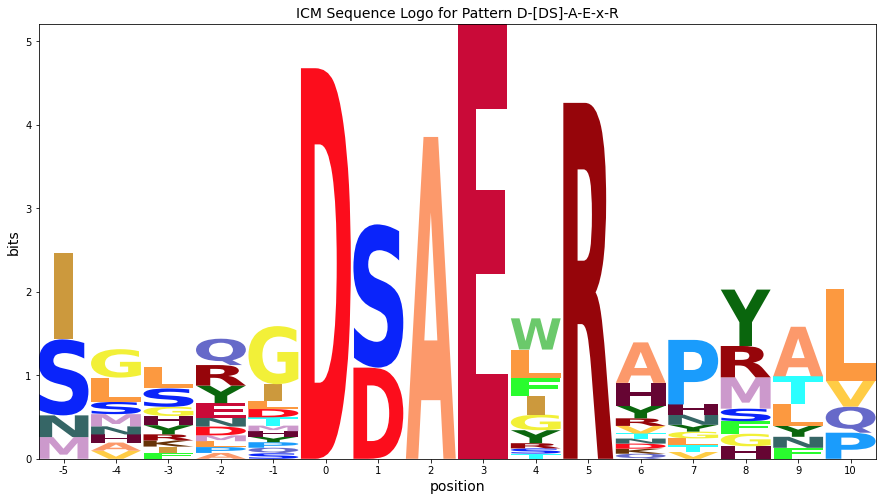

----------------------------------------------------------------------
X Pattern: S-[DS]-A-E-F
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.105263,0.000000,0.000000,0.105263,0.000000,0.315789,0.000000,0.000000,0.000000,0.210526,0.000000,0.000000,0.000000,0.157895,0.000000,0.000000,0.105263,0.000000
1,0.000000,0.0,0.225806,0.000000,0.000000,0.161290,0.064516,0.000000,0.000000,0.064516,0.225806,0.064516,0.000000,0.000000,0.000000,0.064516,0.129032,0.000000,0.000000,0.000000
2,0.060606,0.0,0.060606,0.090909,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,0.000000,0.242424,0.000000,0.000000,0.121212,0.060606,0.000000,0.272727,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.114286,0.000000,0.057143,0.200000,0.085714,0.114286,0.200000,0.000000,0.000000,0.114286,0.000000,0.057143,0.057143,0.000000
4,0.090909,0.0,0.250000,0.000000,0.000000,0.159091,0.000000,0.000000,0.090909,0.204545,0.000000,0.000000,0.045455,0.000000,0.045455,0.000000,0.000000,0.113636,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.704918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.295082,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.431031,1.355566,0.977054,-0.077394,-0.276703,0.870139,-1.022946,2.355566,0.033638,-1.846068,-0.180487,1.414459,-2.009007,-0.492431,-1.022946,-0.090691,-1.846068,-0.966362,2.014529,-0.570434
1,-1.818054,0.968543,2.005068,-0.464417,-0.663726,1.483116,0.174993,-0.838812,-0.353386,-0.648129,2.432490,0.290471,-2.396030,-0.879454,-1.409969,-0.892751,0.088837,-1.353386,0.042543,-0.957457
2,-0.288586,0.913047,0.534536,1.480088,-0.719221,-1.157342,-1.465464,-0.894307,-0.408881,-0.288586,-0.623005,1.819938,-2.451525,-0.934949,0.856464,-0.948246,-2.288586,1.913047,-0.012952,-1.012952
3,-1.926988,0.859608,-1.103866,-0.573351,-0.772660,-1.210781,0.803025,-0.947747,1.122643,0.657974,1.323555,0.918502,0.495036,-0.988389,-1.518903,-0.264720,-2.342026,0.122643,1.518571,-1.066391
4,0.176300,0.640968,2.262456,-0.791991,-0.991300,1.570579,-1.737544,-1.166387,1.640968,0.761262,-0.895085,-1.622066,-1.138642,-1.207029,-0.152581,-2.805288,-2.560666,0.904002,-0.285032,-1.285032
5,-2.485478,0.301118,-1.662356,-1.131841,-1.331150,-1.769271,-2.077394,-1.506237,-1.020810,-2.900516,-1.234935,-1.961916,-3.063455,-1.546879,-2.077394,2.809058,-2.900516,-2.020810,-0.624882,-1.624882
6,-2.485478,0.301118,3.797075,-1.131841,-1.331150,-1.769271,-2.077394,-1.506237,-1.020810,-2.900516,-1.234935,-1.961916,-3.063455,-1.546879,-2.077394,1.102789,-2.900516,-2.020810,-0.624882,-1.624882
7,3.468718,0.301118,-1.662356,-1.131841,-1.331150,-1.769271,-2.077394,-1.506237,-1.020810,-2.900516,-1.234935,-1.961916,-3.063455,-1.546879,-2.077394,-3.145138,-2.900516,-2.020810,-0.624882,-1.624882
8,-2.485478,0.301118,-1.662356,4.822355,-1.331150,-1.769271,-2.077394,-1.506237,-1.020810,-2.900516,-1.234935,-1.961916,-3.063455,-1.546879,-2.077394,-3.145138,-2.900516,-2.020810,-0.624882,-1.624882


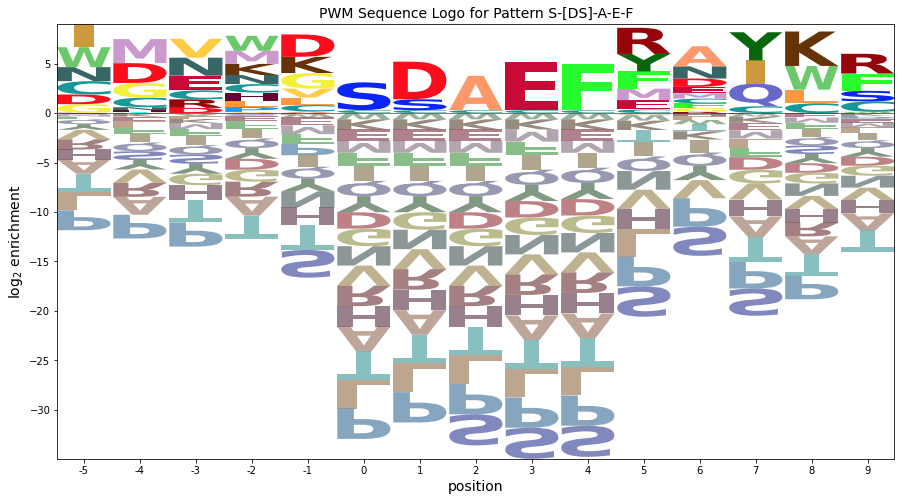

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.219267,0.000000,0.000000,0.219267,0.000000,0.657801,0.000000,0.000000,0.000000,0.438534,0.000000,0.000000,0.000000,0.328900,0.000000,0.000000,0.219267,0.000000
1,0.000000,0.0,0.356690,0.000000,0.000000,0.254779,0.101912,0.000000,0.000000,0.101912,0.356690,0.101912,0.000000,0.000000,0.000000,0.101912,0.203823,0.000000,0.000000,0.000000
2,0.091669,0.0,0.091669,0.137504,0.000000,0.000000,0.000000,0.000000,0.000000,0.137504,0.000000,0.366677,0.000000,0.000000,0.183339,0.091669,0.000000,0.412512,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.113973,0.000000,0.056987,0.199453,0.085480,0.113973,0.199453,0.000000,0.000000,0.113973,0.000000,0.056987,0.056987,0.000000
4,0.135116,0.0,0.371570,0.000000,0.000000,0.236453,0.000000,0.000000,0.135116,0.304011,0.000000,0.000000,0.067558,0.000000,0.067558,0.000000,0.000000,0.168895,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,2.371877,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.992879,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


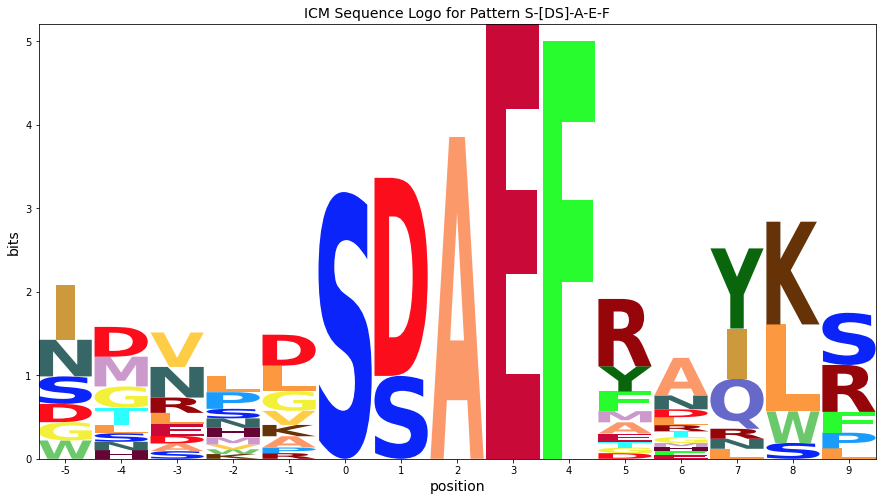

----------------------------------------------------------------------
Y Pattern: L-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.075000,0.100000,0.075000,0.000000,0.000000,0.000000,0.000000,0.450000,0.000000,0.125000,0.000000,0.175000
1,0.071429,0.0,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.095238,0.000000,0.071429,0.285714,0.000000,0.261905,0.000000,0.095238,0.047619,0.000000,0.000000
2,0.159091,0.0,0.000000,0.000000,0.000000,0.000000,0.068182,0.000000,0.000000,0.000000,0.159091,0.204545,0.204545,0.000000,0.045455,0.090909,0.000000,0.000000,0.000000,0.068182
3,0.074074,0.0,0.000000,0.000000,0.000000,0.314815,0.055556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.148148,0.277778,0.037037,0.092593,0.000000,0.000000
4,0.069444,0.0,0.027778,0.000000,0.083333,0.000000,0.000000,0.041667,0.000000,0.097222,0.055556,0.000000,0.222222,0.055556,0.000000,0.263889,0.041667,0.000000,0.000000,0.041667
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.625000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.375000,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.052519,0.734077,-1.229397,-0.698882,-0.898191,-1.336312,-1.644434,-1.073278,1.412149,-0.145628,1.198024,-1.528957,-2.630495,-1.113920,-1.644434,1.535749,-2.467557,0.997112,-0.191922,1.808078
1,-0.099825,0.686772,-1.276703,1.253812,-0.945497,-1.383618,-1.691740,-1.120583,-0.635156,-0.192934,-0.849281,0.423737,1.022639,-1.161225,1.893222,-2.759485,-0.192934,-0.050194,-0.239228,-1.239228
2,0.854372,0.640968,-1.322506,-0.791991,-0.991300,-1.429421,0.262456,-1.166387,-0.680960,-2.560666,2.104915,1.699862,0.598324,-1.207029,-0.152581,-0.483360,-2.560666,-1.680960,-0.285032,0.714968
3,-0.033154,0.431515,-1.531960,-1.001445,-1.200754,2.531050,0.053003,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,1.222928,0.985258,-1.185157,0.694549,-0.494485,-1.494485
4,-0.084228,0.117406,-0.261106,-1.315553,1.292493,-1.952983,-2.261106,0.310051,-1.204522,-0.084228,0.903281,-2.145628,0.840296,0.591337,-2.261106,0.993078,-1.084228,-2.204522,-0.808593,0.191407
5,-2.669190,0.117406,-1.846068,-1.315553,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,3.105597,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,-3.328850,-3.084228,-2.204522,-0.808593,-1.808593
6,-2.669190,0.117406,3.677494,-1.315553,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,-3.084228,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,1.478505,-3.084228,-2.204522,-0.808593,-1.808593
7,3.520634,0.117406,-1.846068,-1.315553,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,-3.084228,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,-3.328850,-3.084228,-2.204522,-0.808593,-1.808593
8,-2.669190,0.117406,-1.846068,4.874271,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,-3.084228,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,-3.328850,-3.084228,-2.204522,-0.808593,-1.808593


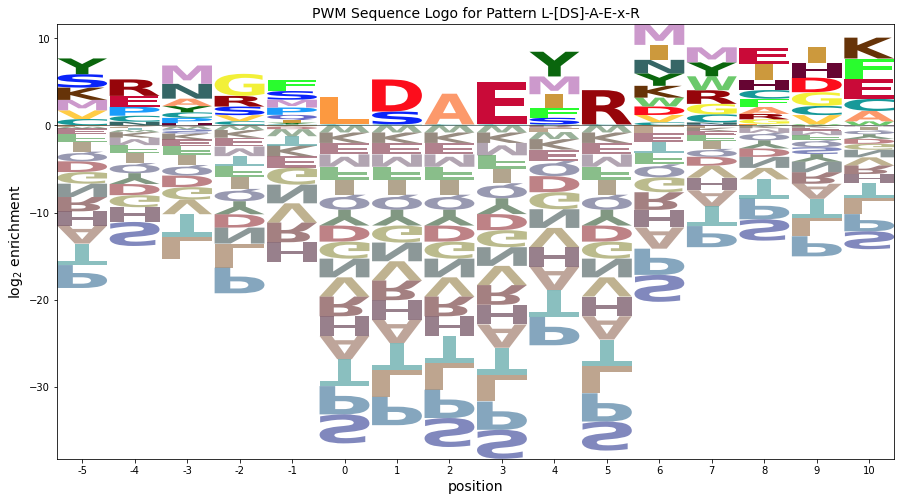

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.127662,0.170216,0.127662,0.000000,0.000000,0.000000,0.000000,0.765972,0.000000,0.212770,0.000000,0.297878
1,0.084248,0.0,0.000000,0.084248,0.000000,0.000000,0.000000,0.000000,0.000000,0.112331,0.000000,0.084248,0.336994,0.000000,0.308911,0.000000,0.112331,0.056166,0.000000,0.000000
2,0.200658,0.0,0.000000,0.000000,0.000000,0.000000,0.085996,0.000000,0.000000,0.000000,0.200658,0.257989,0.257989,0.000000,0.057331,0.114662,0.000000,0.000000,0.000000,0.085996
3,0.115349,0.0,0.000000,0.000000,0.000000,0.490235,0.086512,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.230699,0.432560,0.057675,0.144187,0.000000,0.000000
4,0.052028,0.0,0.020811,0.000000,0.062434,0.000000,0.000000,0.031217,0.000000,0.072840,0.041623,0.000000,0.166491,0.041623,0.000000,0.197708,0.031217,0.000000,0.000000,0.031217
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.979385,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.187631,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


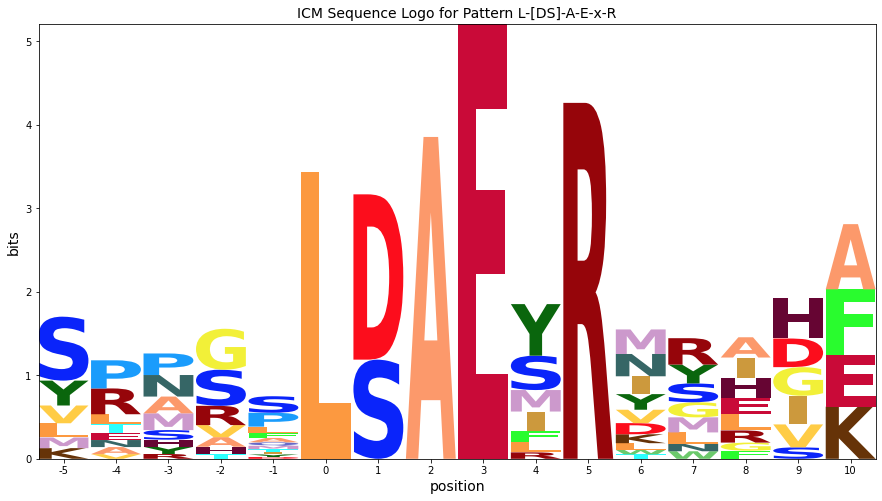

----------------------------------------------------------------------
Z Pattern: P-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.137931,0.000000,0.000000,0.103448,0.068966,0.000000,0.103448,0.000000,0.000000,0.000000,0.000000,0.000000,0.103448,0.172414,0.000000,0.000000,0.310345
1,0.264706,0.000000,0.000000,0.000000,0.000000,0.088235,0.058824,0.000000,0.000000,0.000000,0.000000,0.058824,0.147059,0.088235,0.117647,0.000000,0.000000,0.176471,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051724,0.310345,0.000000,0.137931,0.051724,0.155172,0.000000,0.051724,0.000000,0.120690,0.086207,0.000000,0.000000,0.034483
3,0.067568,0.000000,0.054054,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040541,0.189189,0.094595,0.040541,0.027027,0.040541,0.000000,0.364865,0.081081,0.000000,0.000000
4,0.058140,0.000000,0.000000,0.000000,0.000000,0.081395,0.000000,0.151163,0.000000,0.034884,0.000000,0.093023,0.069767,0.000000,0.209302,0.093023,0.000000,0.046512,0.000000,0.162791
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.558140,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.441860,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.760338,1.026258,-0.937216,1.915227,-0.606010,-1.044131,0.647746,0.803866,-0.295670,-0.175376,-0.509795,-1.236776,-2.338314,-0.821739,-1.352254,-0.419998,0.409587,-1.295670,0.100259,2.422187
1,1.421412,0.886080,-1.077394,-0.546879,-0.746188,0.815691,0.092531,-0.921275,-0.435848,-2.315553,-0.649972,0.208009,0.106470,1.038084,0.829497,-2.560176,-2.315553,1.371507,-0.039919,-1.039919
2,-2.431031,0.355566,-1.607908,-1.077394,-1.276703,-1.714824,-0.022946,2.796138,-0.966362,0.323857,0.819513,1.414459,-3.009007,0.507569,-2.022946,-0.090691,-0.261106,-1.966362,-0.570434,0.014529
3,-0.115255,0.086379,0.444833,-1.346580,-1.545889,-1.984010,-2.292133,-1.720976,-1.235549,-1.115255,2.457217,0.823345,-1.278193,-0.176655,-0.292133,-3.359877,1.692100,0.571806,-0.839620,-1.839620
4,-0.288586,-0.086953,-2.050427,-1.519912,-1.719221,0.842658,-2.465464,1.913047,-1.408881,-1.288586,-1.623005,0.819938,-0.644170,-1.934949,1.782463,-0.363284,-3.288586,-0.086953,-1.012952,1.893939
5,-2.873549,-0.086953,-2.050427,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,2.991419,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952
6,-2.873549,-0.086953,3.564283,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,1.752193,-3.288586,-2.408881,-1.012952,-2.012952
7,3.569395,-0.086953,-2.050427,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952
8,-2.873549,-0.086953,-2.050427,4.923032,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952


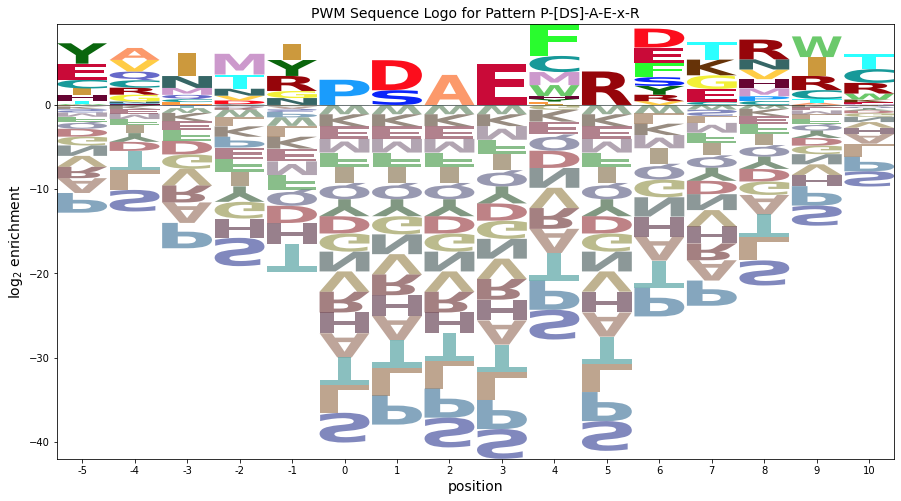

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.220415,0.000000,0.000000,0.165312,0.110208,0.000000,0.165312,0.000000,0.000000,0.000000,0.000000,0.000000,0.165312,0.275519,0.000000,0.000000,0.495935
1,0.339381,0.000000,0.000000,0.000000,0.000000,0.113127,0.075418,0.000000,0.000000,0.000000,0.000000,0.075418,0.188545,0.113127,0.150836,0.000000,0.000000,0.226254,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.072006,0.432035,0.000000,0.192016,0.072006,0.216018,0.000000,0.072006,0.000000,0.168014,0.120010,0.000000,0.000000,0.048004
3,0.086390,0.000000,0.069112,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051834,0.241891,0.120945,0.051834,0.034556,0.051834,0.000000,0.466504,0.103668,0.000000,0.000000
4,0.064903,0.000000,0.000000,0.000000,0.000000,0.090864,0.000000,0.168748,0.000000,0.038942,0.000000,0.103845,0.077884,0.000000,0.233651,0.103845,0.000000,0.051922,0.000000,0.181729
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.276395,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,1.692327,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.339759,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


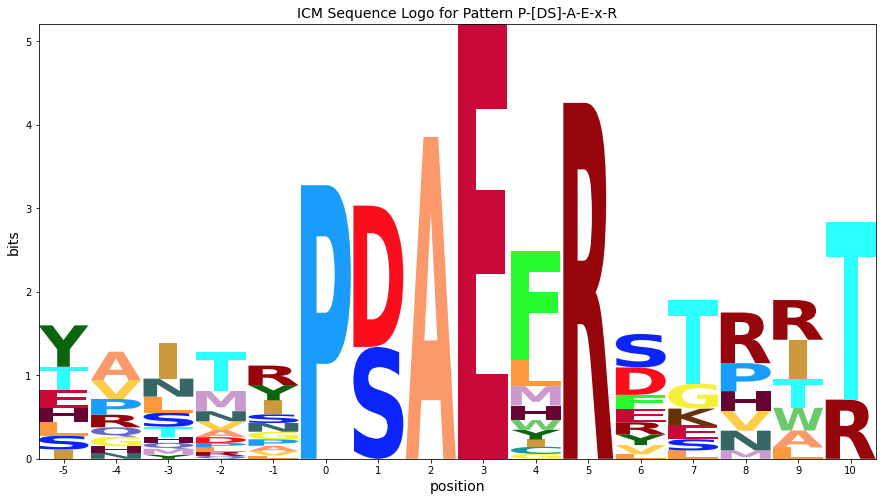

----------------------------------------------------------------------
a Pattern: N-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.148148,0.0,0.000000,0.000000,0.000000,0.000000,0.074074,0.259259,0.000000,0.000000,0.000000,0.222222,0.148148,0.0,0.000000,0.074074,0.074074,0.000000,0.000000,0.000000
1,0.062500,0.0,0.000000,0.000000,0.187500,0.250000,0.062500,0.000000,0.156250,0.156250,0.000000,0.000000,0.000000,0.0,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.062500,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.156250,0.000000,0.000000,0.000000,0.0,0.000000,0.250000,0.093750,0.062500,0.125000,0.125000
3,0.000000,0.0,0.081633,0.040816,0.061224,0.142857,0.142857,0.000000,0.040816,0.000000,0.000000,0.000000,0.163265,0.0,0.000000,0.285714,0.000000,0.040816,0.000000,0.000000
4,0.000000,0.0,0.105263,0.000000,0.070175,0.000000,0.000000,0.087719,0.035088,0.245614,0.105263,0.087719,0.000000,0.0,0.035088,0.122807,0.000000,0.070175,0.000000,0.035088
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.477612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.522388,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.621711,1.086379,-0.877095,-0.346580,-0.545889,-0.984010,0.292830,2.279024,-0.235549,-2.115255,-0.449674,1.630700,0.043735,-0.761618,-1.292133,-0.774915,-0.530292,-1.235549,0.160380,-0.839620
1,-0.261106,0.940528,-1.022946,-0.492431,2.115615,2.040064,0.146979,-0.866827,2.203563,0.323857,-0.595525,-1.322506,-2.424044,-0.907469,-1.437983,-0.183800,-2.261106,-1.381400,0.014529,-0.985471
2,-1.846068,0.940528,0.562017,-0.492431,-0.691740,1.192067,-1.437983,-0.866827,-0.381400,0.323857,-0.595525,-1.322506,-2.424044,-0.907469,-1.437983,0.664197,-0.261106,0.203563,2.336457,1.336457
3,-2.254153,0.532443,0.890897,0.684447,0.900175,1.462054,1.153932,-1.274911,0.795478,-2.669190,-1.003609,-1.730591,0.337796,-1.315553,-1.846068,0.993078,-2.669190,-0.204522,-0.393556,-1.393556
4,-2.412415,0.374181,1.218062,-1.058778,1.063841,-1.696208,-2.004330,1.151789,0.637216,1.079438,1.645483,0.696109,-2.990391,-1.473816,-0.419368,-0.072075,-2.827452,0.374181,-0.551818,0.033144
5,-2.588572,0.198024,-1.765450,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,4.022453,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975
6,-2.588572,0.198024,3.278944,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,1.921693,-3.003609,-2.123904,-0.727975,-1.727975
7,3.498891,0.198024,-1.765450,-1.234935,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975
8,-2.588572,0.198024,-1.765450,4.852528,-1.434244,-1.872365,-2.180487,-1.609331,-1.123904,-3.003609,-1.338028,-2.065010,-3.166548,-1.649972,-2.180487,-3.248232,-3.003609,-2.123904,-0.727975,-1.727975


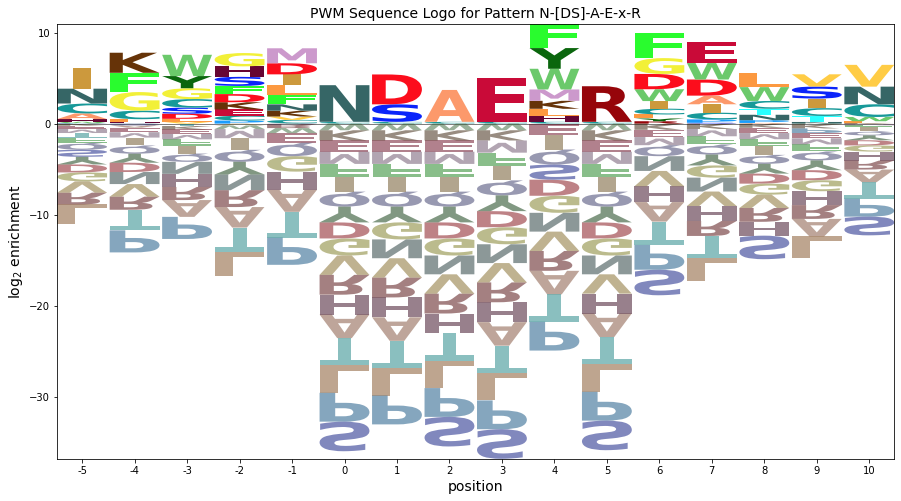

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.215080,0.0,0.000000,0.000000,0.000000,0.000000,0.107540,0.376389,0.000000,0.000000,0.000000,0.322619,0.215080,0.0,0.000000,0.107540,0.107540,0.000000,0.000000,0.000000
1,0.105762,0.0,0.000000,0.000000,0.317287,0.423049,0.105762,0.000000,0.264406,0.264406,0.000000,0.000000,0.000000,0.0,0.000000,0.211524,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.077016,0.000000,0.000000,0.154031,0.000000,0.000000,0.000000,0.192539,0.000000,0.000000,0.000000,0.0,0.000000,0.308063,0.115524,0.077016,0.154031,0.154031
3,0.000000,0.0,0.094022,0.047011,0.070516,0.164538,0.164538,0.000000,0.047011,0.000000,0.000000,0.000000,0.188044,0.0,0.000000,0.329077,0.000000,0.047011,0.000000,0.000000
4,0.000000,0.0,0.106904,0.000000,0.071269,0.000000,0.000000,0.089086,0.035635,0.249442,0.106904,0.089086,0.000000,0.0,0.035635,0.124721,0.000000,0.071269,0.000000,0.035635
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.377934,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.387154,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.517199,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


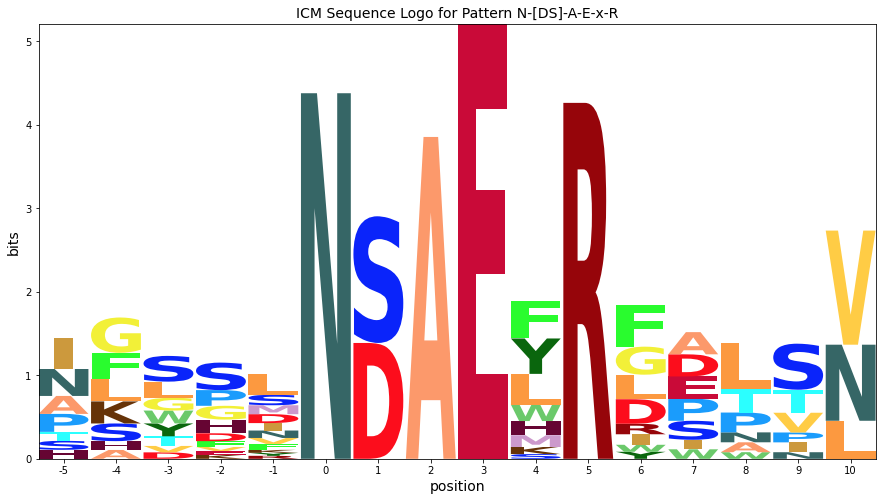

----------------------------------------------------------------------
b Pattern: L-[DS]-A-E-F
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.235294,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.058824,0.147059,0.000000,0.000000,0.352941,0.000000,0.205882,0.000000
1,0.000000,0.0,0.041667,0.000000,0.000000,0.104167,0.000000,0.000000,0.000000,0.062500,0.145833,0.416667,0.104167,0.083333,0.000000,0.000000,0.041667,0.000000,0.000000,0.000000
2,0.070175,0.0,0.000000,0.000000,0.000000,0.087719,0.035088,0.000000,0.000000,0.070175,0.000000,0.000000,0.122807,0.210526,0.000000,0.280702,0.122807,0.000000,0.000000,0.000000
3,0.000000,0.0,0.065574,0.065574,0.000000,0.000000,0.049180,0.032787,0.000000,0.000000,0.065574,0.262295,0.000000,0.032787,0.000000,0.147541,0.000000,0.196721,0.081967,0.000000
4,0.000000,0.0,0.126761,0.028169,0.000000,0.000000,0.000000,0.056338,0.000000,0.056338,0.098592,0.070423,0.084507,0.000000,0.000000,0.140845,0.042254,0.000000,0.000000,0.295775
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.746479,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.253521,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,1.269409,0.886080,-1.077394,-0.546879,-0.746188,-1.184309,-1.492431,-0.921275,-0.435848,-2.315553,-0.649972,-1.376954,-0.893530,1.623046,-1.492431,-2.560176,1.384886,-1.435848,2.960081,-1.039919
1,-2.233091,0.553505,0.174993,-0.879454,-1.078763,1.068078,-1.825007,-1.253850,-0.768423,-0.648129,2.017452,2.682788,-0.226105,1.027436,-1.825007,-2.892751,-1.063166,-1.768423,-0.372494,-1.372494
2,-0.090487,0.374181,-1.589293,-1.058778,-1.258087,0.888755,-0.419368,-1.433174,-0.947747,-0.505524,-1.161872,-1.888853,0.009609,2.226624,-2.004330,1.015388,0.172548,-1.947747,-0.551818,-1.551818
3,-2.485478,0.301118,0.659572,1.190087,-1.331150,-1.769271,-0.077394,0.078725,-1.020810,-2.900516,1.086993,2.125546,-3.063455,0.038084,-2.077394,0.176790,-2.900516,1.679630,1.960081,-1.624882
4,-2.653423,0.133173,1.491627,0.285176,-1.499095,-1.937216,-2.245338,0.647746,-1.188755,-0.746532,1.597120,0.455101,-0.424044,-1.714824,-2.245338,0.146349,-1.068461,-2.188755,-0.792826,2.666605
5,-2.653423,0.133173,-1.830301,-1.299786,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,3.101464,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,-3.068461,-2.188755,-0.792826,-1.792826
6,-2.653423,0.133173,3.924587,-1.299786,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,0.934845,-3.068461,-2.188755,-0.792826,-1.792826
7,3.516502,0.133173,-1.830301,-1.299786,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,-3.068461,-2.188755,-0.792826,-1.792826
8,-2.653423,0.133173,-1.830301,4.870139,-1.499095,-1.937216,-2.245338,-1.674182,-1.188755,-3.068461,-1.402880,-2.129861,-3.231399,-1.714824,-2.245338,-3.313083,-3.068461,-2.188755,-0.792826,-1.792826


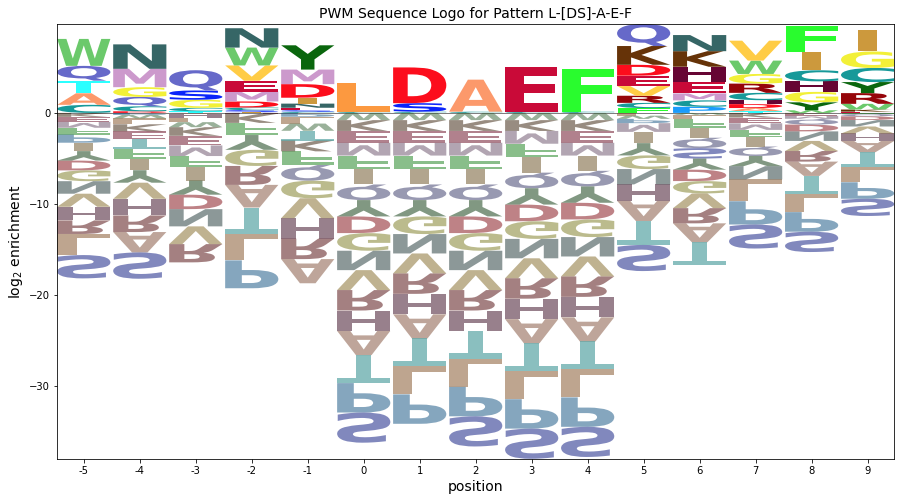

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.483989,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120997,0.302493,0.000000,0.000000,0.725983,0.000000,0.423490,0.000000
1,0.000000,0.0,0.074859,0.000000,0.000000,0.187147,0.000000,0.000000,0.000000,0.112288,0.262006,0.748589,0.187147,0.149718,0.000000,0.000000,0.074859,0.000000,0.000000,0.000000
2,0.073439,0.0,0.000000,0.000000,0.000000,0.091799,0.036720,0.000000,0.000000,0.073439,0.000000,0.000000,0.128519,0.220318,0.000000,0.293758,0.128519,0.000000,0.000000,0.000000
3,0.000000,0.0,0.096042,0.096042,0.000000,0.000000,0.072032,0.048021,0.000000,0.000000,0.096042,0.384169,0.000000,0.048021,0.000000,0.216095,0.000000,0.288127,0.120053,0.000000
4,0.000000,0.0,0.162554,0.036123,0.000000,0.000000,0.000000,0.072246,0.000000,0.072246,0.126431,0.090308,0.108369,0.000000,0.000000,0.180615,0.054185,0.000000,0.000000,0.379292
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,2.601304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.883462,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


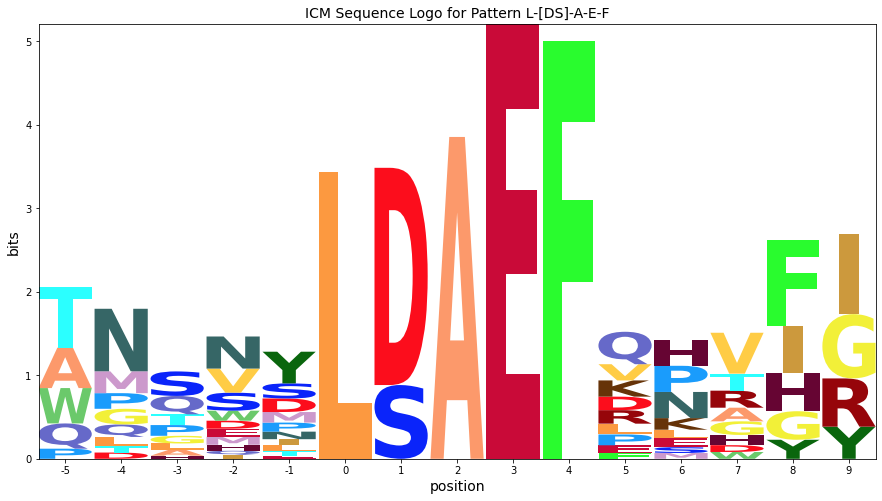

----------------------------------------------------------------------
c Pattern: A-E-[FY]-R-A
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.080000,0.160000,0.000000,0.080000,0.000000,0.000000,0.680000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.100000,0.0,0.000000,0.000000,0.133333,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000,0.133333,0.166667,0.000000,0.233333,0.066667,0.000000,0.100000,0.000000,0.000000
2,0.000000,0.0,0.068182,0.068182,0.090909,0.272727,0.045455,0.000000,0.000000,0.068182,0.000000,0.045455,0.090909,0.000000,0.068182,0.045455,0.045455,0.000000,0.000000,0.090909
3,0.050847,0.0,0.203390,0.067797,0.000000,0.000000,0.000000,0.000000,0.000000,0.118644,0.000000,0.033898,0.067797,0.050847,0.033898,0.169492,0.203390,0.000000,0.000000,0.000000
4,0.046875,0.0,0.234375,0.125000,0.000000,0.062500,0.000000,0.000000,0.000000,0.046875,0.000000,0.046875,0.000000,0.000000,0.000000,0.187500,0.218750,0.000000,0.000000,0.031250
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.651515,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.348485
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.637482,1.149115,-0.814359,1.301118,1.838775,-0.921275,0.355566,-0.658240,-0.172813,2.117406,-0.386938,-1.113920,-2.215458,-0.698882,-1.229397,-2.297141,-2.052519,-1.172813,0.223115,-0.776885
1,0.210515,0.997112,-0.966362,-0.435848,1.686772,-1.073278,-1.381400,0.774719,-0.324816,-2.204522,-0.538941,1.056005,0.217502,-0.850885,1.618600,-0.864182,-2.204522,0.675184,0.071112,-0.928888
2,-2.145628,0.640968,0.677494,1.208009,1.330628,2.271018,-0.152581,-1.166387,-0.680960,-0.560666,-0.895085,-0.037104,-0.401676,-1.207029,0.262456,-1.220326,-0.975703,-1.680960,-0.285032,1.036897
3,-0.449409,0.337187,2.074153,1.226156,-1.295081,-1.733202,-2.041324,-1.470168,-0.984741,0.135553,-1.198866,-0.340885,-0.705457,0.489190,-0.456362,0.350363,0.835993,-1.984741,-0.588812,-1.588812
4,-0.537946,0.248650,2.285176,1.985616,-1.383618,0.500189,-2.129861,-1.558704,-1.073278,-0.952983,-1.287402,-0.014384,-3.115922,-1.599346,-2.129861,0.502834,0.953907,-2.073278,-0.677349,-0.092386
5,3.494196,0.214703,-1.748771,-1.218256,-1.417565,-1.855686,-2.163808,-1.592652,-1.107225,-2.986931,-1.321350,-2.048331,-3.149869,-1.633294,-2.163808,-3.231553,-2.986931,-2.107225,-0.711296,-1.711296
6,-2.571893,0.214703,-1.748771,4.847833,-1.417565,-1.855686,-2.163808,-1.592652,-1.107225,-2.986931,-1.321350,-2.048331,-3.149869,-1.633294,-2.163808,-3.231553,-2.986931,-2.107225,-0.711296,-1.711296
7,-2.571893,0.214703,-1.748771,-1.218256,4.041867,-1.855686,-2.163808,-1.592652,-1.107225,-2.986931,-1.321350,-2.048331,-3.149869,-1.633294,-2.163808,-3.231553,-2.986931,-2.107225,-0.711296,2.873666
8,-2.571893,0.214703,-1.748771,-1.218256,-1.417565,-1.855686,-2.163808,-1.592652,-1.107225,-2.986931,-1.321350,-2.048331,-3.149869,-1.633294,3.902281,-3.231553,-2.986931,-2.107225,-0.711296,-1.711296


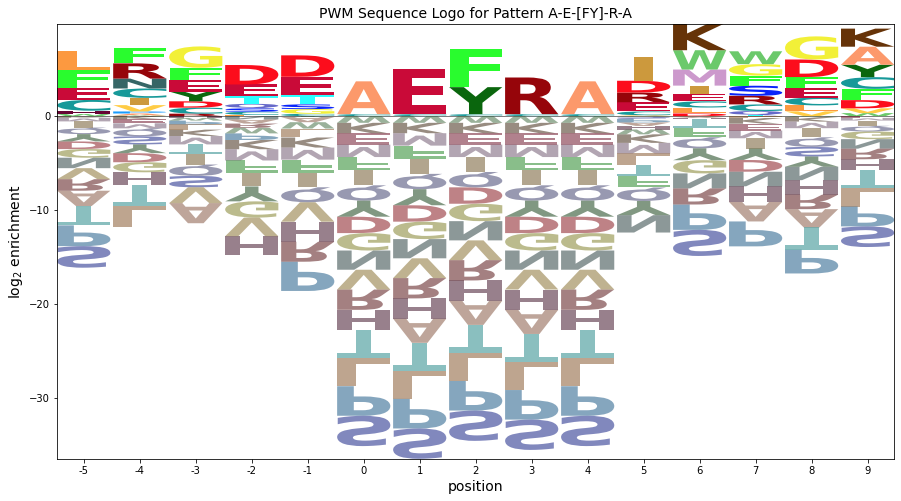

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.201072,0.402143,0.000000,0.201072,0.000000,0.000000,1.709108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.126356,0.0,0.000000,0.000000,0.168475,0.000000,0.000000,0.084237,0.000000,0.000000,0.000000,0.168475,0.210593,0.000000,0.294830,0.084237,0.000000,0.126356,0.000000,0.000000
2,0.000000,0.0,0.068154,0.068154,0.090872,0.272616,0.045436,0.000000,0.000000,0.068154,0.000000,0.045436,0.090872,0.000000,0.068154,0.045436,0.045436,0.000000,0.000000,0.090872
3,0.044753,0.0,0.179012,0.059671,0.000000,0.000000,0.000000,0.000000,0.000000,0.104424,0.000000,0.029835,0.059671,0.044753,0.029835,0.149177,0.179012,0.000000,0.000000,0.000000
4,0.058763,0.0,0.293816,0.156702,0.000000,0.078351,0.000000,0.000000,0.000000,0.058763,0.000000,0.058763,0.000000,0.000000,0.000000,0.235053,0.274228,0.000000,0.000000,0.039175
5,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,2.588881,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.384750
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.262456,0.000000,0.000000,0.000000,0.000000,0.000000


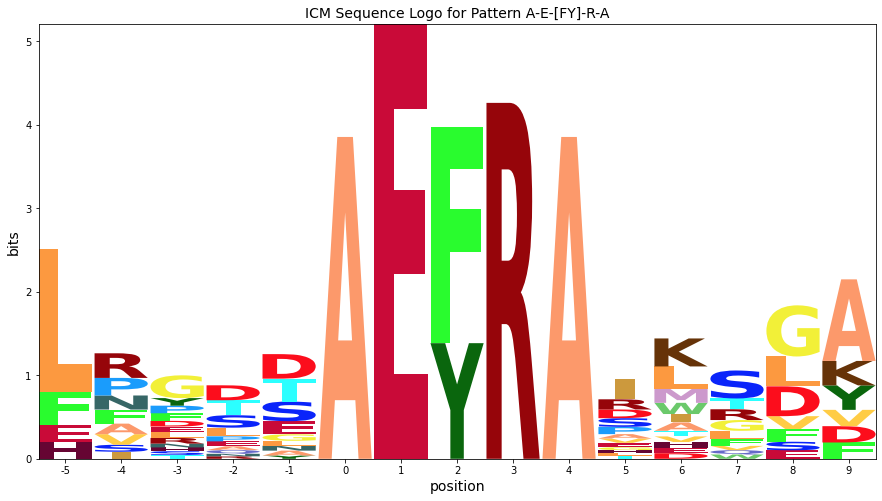

----------------------------------------------------------------------
d Pattern: A-E-[FY]-R-T
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.096774,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.193548,0.064516,0.580645,0.000000,0.000000,0.000000,0.064516,0.000000,0.000000
1,0.086957,0.0,0.000000,0.000000,0.108696,0.043478,0.195652,0.282609,0.0,0.000000,0.108696,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.043478,0.086957
2,0.068966,0.0,0.034483,0.034483,0.034483,0.000000,0.000000,0.068966,0.0,0.120690,0.155172,0.000000,0.000000,0.000000,0.034483,0.120690,0.275862,0.051724,0.000000,0.000000
3,0.155172,0.0,0.000000,0.051724,0.000000,0.155172,0.000000,0.000000,0.0,0.034483,0.000000,0.189655,0.034483,0.000000,0.034483,0.051724,0.224138,0.000000,0.000000,0.068966
4,0.000000,0.0,0.064516,0.112903,0.000000,0.274194,0.000000,0.032258,0.0,0.000000,0.000000,0.258065,0.000000,0.000000,0.000000,0.129032,0.129032,0.000000,0.000000,0.000000
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.629032,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.370968
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.818054,0.968543,-0.994932,1.535583,-0.663726,-1.101847,-1.409969,-0.838812,-0.353386,-2.233091,-0.567510,1.512863,-0.811067,3.368473,-1.409969,-2.477714,-2.233091,0.231577,0.042543,-0.957457
1,0.131906,0.596574,-1.366900,-0.836386,1.549268,0.111147,1.539990,2.596574,-0.725354,-2.605060,1.645483,-1.666461,-2.767999,-1.251423,-1.781938,-2.849682,-2.605060,-0.140392,1.255537,0.992502
2,-0.109103,0.355566,-0.022946,0.507569,0.308260,-1.714824,-2.022946,0.870139,-0.966362,0.153932,2.141441,-1.907469,-3.009007,-1.492431,-0.437983,-0.090691,1.241395,0.033638,-0.570434,-1.570434
3,0.890897,0.355566,-1.607908,0.922606,-1.276703,1.607104,-2.022946,-1.451789,-0.966362,-1.261106,-1.180487,1.677494,-1.424044,-1.492431,-0.437983,-1.090691,0.961287,-1.966362,-0.570434,0.751494
4,-2.503180,0.283416,0.641870,1.850456,-1.348852,2.382952,-2.095096,0.061023,-1.038512,-2.918218,-1.252637,2.107844,-3.081157,-1.564581,-2.095096,0.007085,0.251707,-2.038512,-0.642584,-1.642584
5,3.474099,0.283416,-1.680058,-1.149544,-1.348852,-1.786973,-2.095096,-1.523939,-1.038512,-2.918218,-1.252637,-1.979619,-3.081157,-1.564581,-2.095096,-3.162840,-2.918218,-2.038512,-0.642584,-1.642584
6,-2.503180,0.283416,-1.680058,4.827736,-1.348852,-1.786973,-2.095096,-1.523939,-1.038512,-2.918218,-1.252637,-1.979619,-3.081157,-1.564581,-2.095096,-3.162840,-2.918218,-2.038512,-0.642584,-1.642584
7,-2.503180,0.283416,-1.680058,-1.149544,3.973076,-1.786973,-2.095096,-1.523939,-1.038512,-2.918218,-1.252637,-1.979619,-3.081157,-1.564581,-2.095096,-3.162840,-2.918218,-2.038512,-0.642584,2.942379
8,-2.503180,0.283416,-1.680058,-1.149544,-1.348852,-1.786973,-2.095096,-1.523939,-1.038512,-2.918218,-1.252637,-1.979619,-3.081157,-1.564581,3.882184,-3.162840,-2.918218,-2.038512,-0.642584,-1.642584


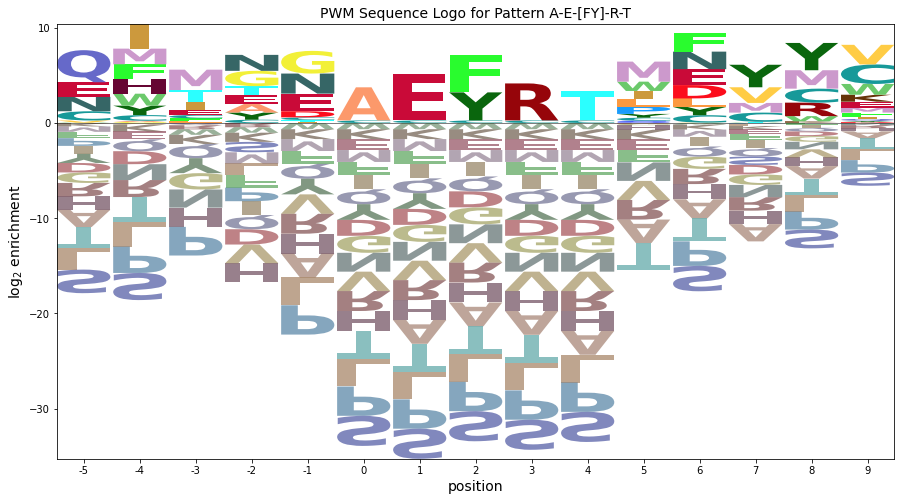

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.278145,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.556291,0.185430,1.668872,0.000000,0.000000,0.000000,0.185430,0.000000,0.000000
1,0.156945,0.0,0.000000,0.000000,0.196182,0.078473,0.353127,0.510073,0.0,0.000000,0.196182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078473,0.078473,0.156945
2,0.064517,0.0,0.032258,0.032258,0.032258,0.000000,0.000000,0.064517,0.0,0.112904,0.145163,0.000000,0.000000,0.000000,0.032258,0.112904,0.258067,0.048388,0.000000,0.000000
3,0.165025,0.0,0.000000,0.055008,0.000000,0.165025,0.000000,0.000000,0.0,0.036672,0.000000,0.201697,0.036672,0.000000,0.036672,0.055008,0.238369,0.000000,0.000000,0.073344
4,0.000000,0.0,0.111999,0.195997,0.000000,0.475994,0.000000,0.055999,0.0,0.000000,0.000000,0.447994,0.000000,0.000000,0.000000,0.223997,0.223997,0.000000,0.000000,0.000000
5,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,2.483622,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.464700
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.262456,0.000000,0.000000,0.000000,0.000000,0.000000


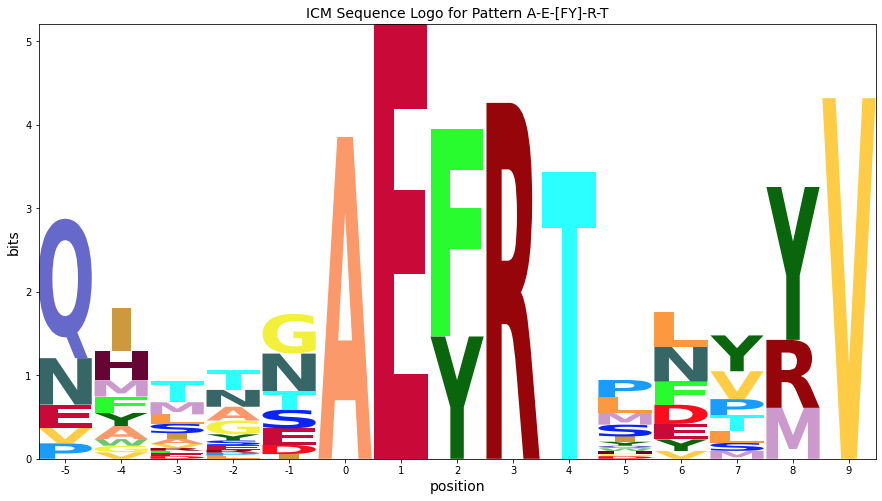

----------------------------------------------------------------------
e Pattern: A-E-[FY]-R-S
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.075472,0.264151,0.000000,0.000000,0.000000,0.000000,0.037736,0.000000,0.000000,0.000000,0.150943,0.094340,0.283019,0.0,0.094340
1,0.304348,0.0,0.101449,0.000000,0.000000,0.000000,0.000000,0.000000,0.057971,0.057971,0.072464,0.101449,0.000000,0.028986,0.000000,0.173913,0.101449,0.000000,0.0,0.000000
2,0.215190,0.0,0.050633,0.000000,0.000000,0.253165,0.000000,0.000000,0.000000,0.025316,0.000000,0.000000,0.050633,0.000000,0.000000,0.253165,0.063291,0.000000,0.0,0.088608
3,0.025316,0.0,0.000000,0.025316,0.063291,0.000000,0.000000,0.050633,0.037975,0.189873,0.000000,0.000000,0.392405,0.025316,0.075949,0.000000,0.025316,0.000000,0.0,0.088608
4,0.024096,0.0,0.192771,0.060241,0.000000,0.048193,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.349398,0.325301,0.000000,0.0,0.000000
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.0,0.000000,0.000000,0.566265,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.433735
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.335453,0.451143,-1.512331,-0.981816,-1.181125,0.702682,1.979522,-1.356212,-0.870785,-2.750491,-1.084910,-0.226929,-2.913429,-1.396854,-1.927368,0.174812,-0.165528,2.129215,-0.474856,1.110106
1,1.838070,0.165234,1.201760,-1.267725,-1.467034,-1.905155,-2.213277,-1.642120,1.165234,-0.714471,1.214144,0.902200,-3.199338,-0.097800,-2.213277,0.419418,-0.036399,-2.156694,-0.760765,-1.760765
2,1.394940,0.011611,0.370065,-1.421348,-1.620657,2.333539,-2.366900,-1.795744,-1.310317,-1.605060,-1.524442,-2.251423,-1.031033,-1.836386,-2.366900,0.957672,-0.605060,-2.310317,-0.914388,1.085612
3,-1.190023,0.011611,-1.951863,0.163614,0.964306,-2.058778,-2.366900,0.526184,0.689683,0.809977,-1.524442,-2.251423,1.647039,-0.251423,0.440455,-3.434645,-1.605060,-2.310317,-0.914388,1.085612
4,-1.247166,-0.045533,2.078456,1.106470,-1.677801,0.206006,-2.424044,-1.852888,-1.367461,-3.247166,-1.581586,-2.308567,-3.410105,-1.893530,-2.424044,1.415102,1.560188,-2.367461,-0.971532,-1.971532
5,3.560188,-0.045533,-2.009007,-1.478492,-1.677801,-2.115922,-2.424044,-1.852888,-1.367461,-3.247166,-1.581586,-2.308567,-3.410105,-1.893530,-2.424044,-3.491789,-3.247166,-2.367461,-0.971532,-1.971532
6,-2.832129,-0.045533,-2.009007,4.913825,-1.677801,-2.115922,-2.424044,-1.852888,-1.367461,-3.247166,-1.581586,-2.308567,-3.410105,-1.893530,-2.424044,-3.491789,-3.247166,-2.367461,-0.971532,-1.971532
7,-2.832129,-0.045533,-2.009007,-1.478492,3.907162,-2.115922,-2.424044,-1.852888,-1.367461,-3.247166,-1.581586,-2.308567,-3.410105,-1.893530,-2.424044,-3.491789,-3.247166,-2.367461,-0.971532,3.237921
8,-2.832129,-0.045533,-2.009007,-1.478492,-1.677801,-2.115922,-2.424044,-1.852888,-1.367461,-3.247166,-1.581586,-2.308567,-3.410105,-1.893530,3.968273,-3.491789,-3.247166,-2.367461,-0.971532,-1.971532


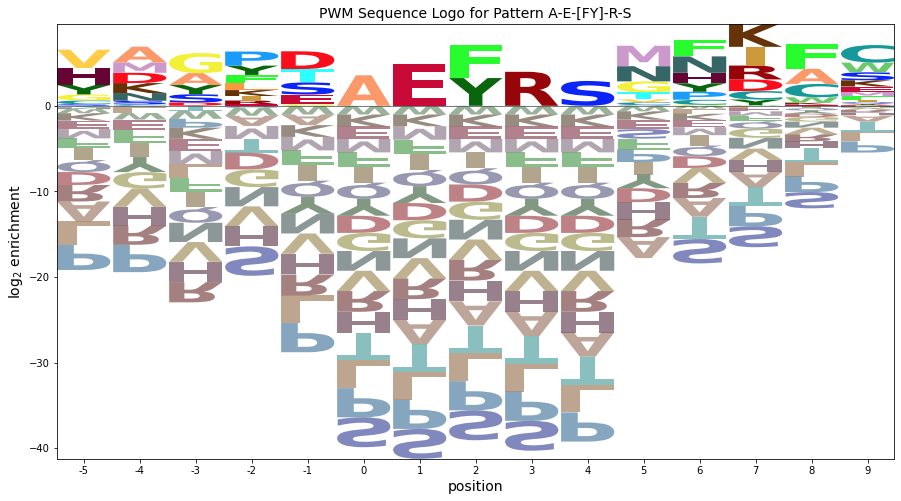

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.118723,0.41553,0.000000,0.000000,0.000000,0.000000,0.059361,0.000000,0.000000,0.000000,0.237446,0.148404,0.445211,0.0,0.148404
1,0.349426,0.0,0.116475,0.000000,0.000000,0.000000,0.00000,0.000000,0.066557,0.066557,0.083197,0.116475,0.000000,0.033279,0.000000,0.199672,0.116475,0.000000,0.0,0.000000
2,0.281523,0.0,0.066241,0.000000,0.000000,0.331204,0.00000,0.000000,0.000000,0.033120,0.000000,0.000000,0.066241,0.000000,0.000000,0.331204,0.082801,0.000000,0.0,0.115921
3,0.028320,0.0,0.000000,0.028320,0.070800,0.000000,0.00000,0.056640,0.042480,0.212401,0.000000,0.000000,0.438961,0.028320,0.084960,0.000000,0.028320,0.000000,0.0,0.099120
4,0.040100,0.0,0.320800,0.100250,0.000000,0.080200,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.581450,0.541350,0.000000,0.0,0.000000
5,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.0,0.000000,0.000000,2.205039,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.688966
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.262456,0.000000,0.000000,0.000000,0.0,0.000000


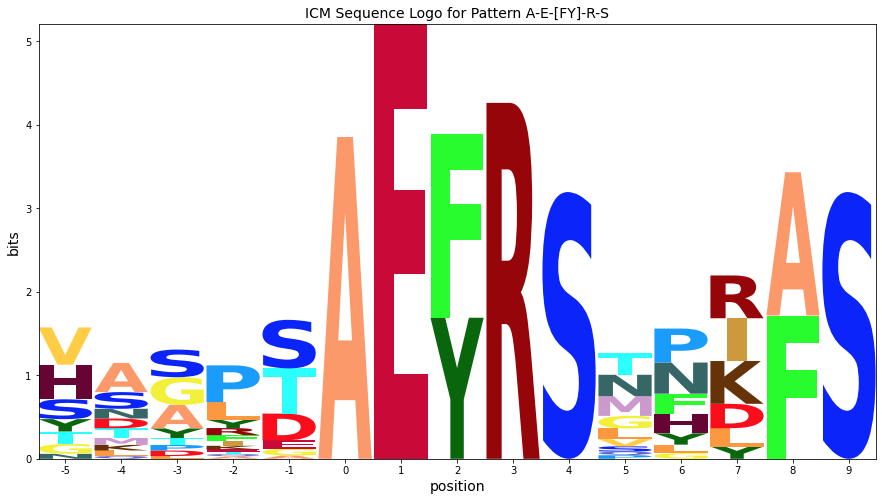

----------------------------------------------------------------------
f Pattern: N-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.136364,0.0,0.136364,0.090909,0.000000,0.090909,0.000000,0.090909,0.000000,0.000000,0.000000,0.000000,0.227273,0.136364,0.090909,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.0,0.088235,0.058824,0.000000,0.000000,0.058824,0.147059,0.000000,0.088235,0.117647,0.147059,0.000000,0.000000,0.117647,0.176471,0.000000,0.000000
2,0.113636,0.0,0.000000,0.0,0.113636,0.000000,0.068182,0.000000,0.000000,0.113636,0.000000,0.000000,0.068182,0.000000,0.000000,0.000000,0.045455,0.295455,0.045455,0.136364
3,0.000000,0.0,0.025000,0.0,0.087500,0.062500,0.000000,0.000000,0.025000,0.187500,0.225000,0.000000,0.025000,0.000000,0.037500,0.025000,0.187500,0.037500,0.000000,0.075000
4,0.000000,0.0,0.036585,0.0,0.048780,0.280488,0.000000,0.000000,0.000000,0.000000,0.000000,0.182927,0.097561,0.000000,0.024390,0.121951,0.060976,0.036585,0.085366,0.024390
5,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.0,0.317647,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.682353


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.537946,1.248650,1.285176,-0.184309,1.616382,0.763224,-1.129861,1.026258,-0.073278,-0.368021,-0.287402,-1.014384,-2.115922,-0.599346,1.455101,-0.197606,-0.368021,-1.073278,0.322651,-0.677349
1,-1.900516,0.886080,-1.077394,-0.546879,1.253812,0.400654,-1.492431,-0.921275,1.149115,0.269409,-0.649972,0.623046,-0.156564,1.623046,-1.492431,-2.560176,0.006375,1.371507,-0.039919,-1.039919
2,0.439334,0.640968,-1.322506,-0.791991,1.593662,-1.429421,0.262456,-1.166387,-0.680960,0.024297,-0.895085,-1.622066,-0.723605,-1.207029,-1.737544,-2.805288,-0.975703,2.126395,1.299931,1.522323
3,-2.789485,-0.002888,-0.381400,-1.435848,1.364844,0.511685,-2.381400,-1.810243,0.260146,0.795478,2.708986,-2.265923,-1.782498,-1.850885,-0.381400,-1.864182,0.795478,-0.324816,-0.928888,0.878467
4,-2.818054,-0.031457,0.005068,-1.464417,0.658202,2.483116,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,1.705508,-0.226105,-1.879454,-0.825007,-0.018282,-0.648129,-0.353386,2.042543,-0.372494
5,-2.859874,-0.073278,-2.036752,-1.506237,-1.705546,-2.143667,-2.451789,-1.880633,-1.395206,-3.274911,-1.609331,4.089953,-3.437850,-1.921275,-2.451789,-3.519534,-3.274911,-2.395206,-0.999277,-1.999277
6,3.566391,-0.073278,-2.036752,-1.506237,-1.705546,-2.143667,-2.451789,-1.880633,-1.395206,-3.274911,-1.609331,-2.336312,-3.437850,-1.921275,-2.451789,-3.519534,-3.274911,-2.395206,-0.999277,-1.999277
7,-2.859874,-0.073278,-2.036752,4.920028,-1.705546,-2.143667,-2.451789,-1.880633,-1.395206,-3.274911,-1.609331,-2.336312,-3.437850,-1.921275,-2.451789,-3.519534,-3.274911,-2.395206,-0.999277,-1.999277
8,-2.859874,-0.073278,-2.036752,-1.506237,3.101809,-2.143667,-2.451789,-1.880633,-1.395206,-3.274911,-1.609331,-2.336312,-3.437850,-1.921275,-2.451789,-3.519534,-3.274911,-2.395206,-0.999277,3.883366


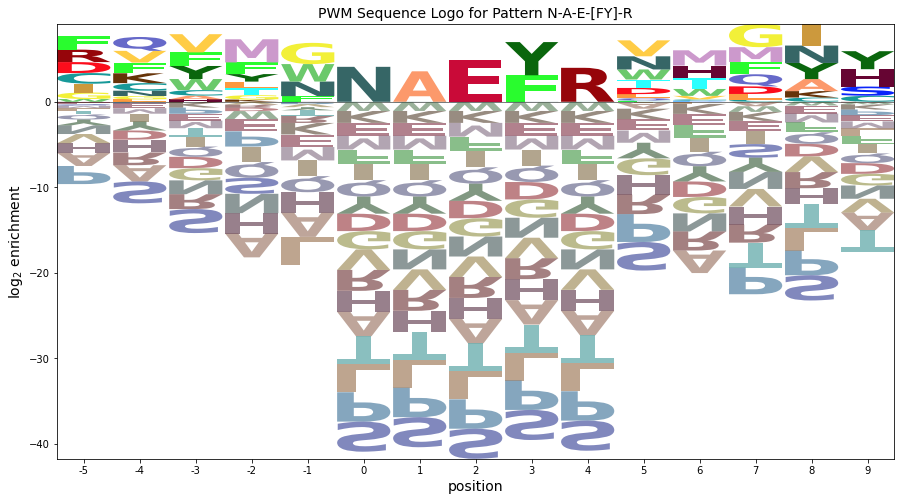

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.175336,0.000000,0.175336,0.116891,0.000000,0.116891,0.000000,0.116891,0.000000,0.000000,0.000000,0.000000,0.292226,0.175336,0.116891,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.096392,0.064261,0.000000,0.000000,0.064261,0.160653,0.000000,0.096392,0.128522,0.160653,0.000000,0.000000,0.128522,0.192783,0.000000,0.000000
2,0.151378,0.0,0.000000,0.000000,0.151378,0.000000,0.090827,0.000000,0.000000,0.151378,0.000000,0.000000,0.090827,0.000000,0.000000,0.000000,0.060551,0.393584,0.060551,0.181654
3,0.000000,0.0,0.028357,0.000000,0.099251,0.070893,0.000000,0.000000,0.028357,0.212680,0.255217,0.000000,0.028357,0.000000,0.042536,0.028357,0.212680,0.042536,0.000000,0.085072
4,0.000000,0.0,0.045708,0.000000,0.060944,0.350430,0.000000,0.000000,0.000000,0.000000,0.000000,0.228541,0.121889,0.000000,0.030472,0.152361,0.076180,0.045708,0.106653,0.030472
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.377934,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.240878,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.665589


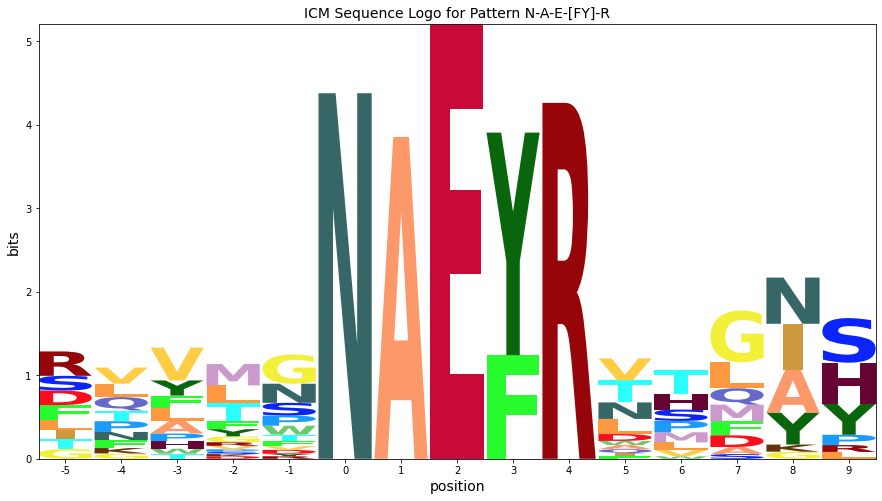

----------------------------------------------------------------------
g Pattern: S-x-D-A-E-[FY]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.178571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.071429,0.071429,0.535714,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.178571,0.000000,0.214286,0.142857,0.071429,0.000000,0.392857
2,0.133333,0.0,0.000000,0.044444,0.111111,0.000000,0.000000,0.044444,0.000000,0.088889,0.000000,0.000000,0.111111,0.000000,0.088889,0.000000,0.377778,0.000000,0.000000,0.000000
3,0.044444,0.0,0.000000,0.000000,0.088889,0.111111,0.000000,0.044444,0.133333,0.111111,0.044444,0.000000,0.088889,0.000000,0.244444,0.000000,0.000000,0.088889,0.000000,0.000000
4,0.081633,0.0,0.081633,0.000000,0.122449,0.000000,0.000000,0.000000,0.000000,0.040816,0.000000,0.000000,0.000000,0.000000,0.000000,0.102041,0.081633,0.265306,0.102041,0.122449
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.027778,0.0,0.083333,0.000000,0.000000,0.027778,0.027778,0.111111,0.041667,0.125000,0.138889,0.152778,0.208333,0.055556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.730591,1.056005,-0.907469,-0.376954,-0.576263,1.570579,-1.322506,-0.751350,-0.265923,-2.145628,-0.480047,-1.207029,-2.308567,-0.791991,-1.322506,-0.068323,-0.560666,0.319040,4.130006,-0.869994
1,-1.730591,1.056005,-0.907469,-0.376954,-0.576263,-1.014384,-1.322506,-0.751350,-0.265923,-2.145628,-0.480047,-1.207029,-2.308567,1.792971,-1.322506,0.417104,0.176300,0.319040,0.130006,2.714968
2,0.639359,0.618600,-1.344874,0.770603,1.571294,-1.451789,-1.759912,0.396208,-0.703328,-0.261106,-0.917453,-1.644434,-0.161010,-1.229397,0.562017,-2.827656,1.586891,-1.703328,-0.307399,-1.307399
3,-0.583034,0.618600,-1.344874,-0.814359,1.308260,1.133173,-1.759912,0.396208,2.104027,0.001929,0.667510,-1.644434,-0.424044,-1.229397,1.825051,-2.827656,-2.583034,0.618600,-0.307399,-1.307399
4,0.067775,0.532443,0.890897,-0.900516,1.707530,-1.537946,-1.846068,-1.274911,-0.789485,-1.084228,-1.003609,-1.730591,-2.832129,-1.315553,-1.846068,-0.328850,-0.347262,2.017870,2.191407,1.413799
5,-2.669190,0.117406,-1.846068,-1.315553,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,-3.084228,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,2.860974,-3.084228,-2.204522,-0.808593,-1.808593
6,-1.084228,0.117406,0.961287,-1.315553,-1.514862,-0.368021,-0.676143,1.479976,0.795478,0.237700,2.040785,1.439334,0.752834,0.591337,-2.261106,-3.328850,-3.084228,-2.204522,-0.808593,-1.808593
7,-2.669190,0.117406,4.343756,-1.315553,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,-3.084228,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,-3.328850,-3.084228,-2.204522,-0.808593,-1.808593
8,3.520634,0.117406,-1.846068,-1.315553,-1.514862,-1.952983,-2.261106,-1.689949,-1.204522,-3.084228,-1.418647,-2.145628,-3.247166,-1.730591,-2.261106,-3.328850,-3.084228,-2.204522,-0.808593,-1.808593


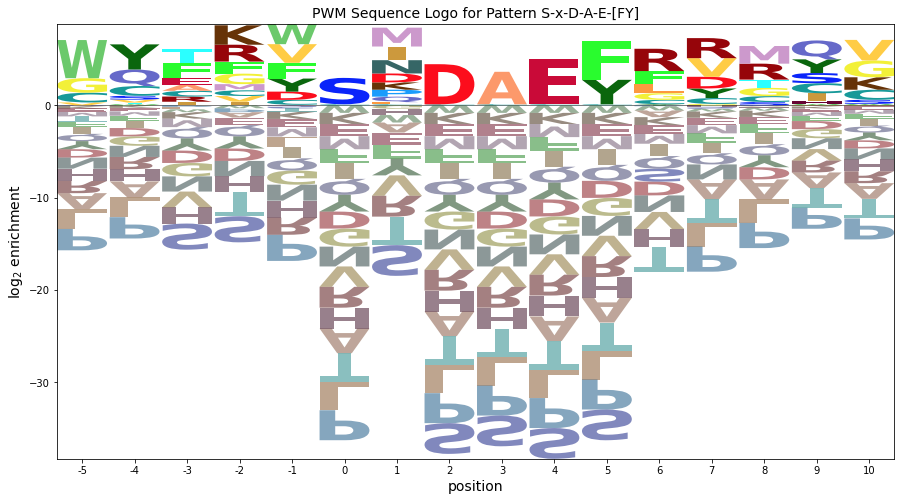

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.538776,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.431021,0.215510,0.215510,1.616328,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.369646,0.000000,0.443575,0.295716,0.147858,0.000000,0.813220
2,0.162943,0.0,0.000000,0.054314,0.135786,0.000000,0.000000,0.054314,0.000000,0.108629,0.000000,0.000000,0.135786,0.000000,0.108629,0.000000,0.461672,0.000000,0.000000,0.000000
3,0.055805,0.0,0.000000,0.000000,0.111610,0.139513,0.000000,0.055805,0.167415,0.139513,0.055805,0.000000,0.111610,0.000000,0.306928,0.000000,0.000000,0.111610,0.000000,0.000000
4,0.111662,0.0,0.111662,0.000000,0.167493,0.000000,0.000000,0.000000,0.000000,0.055831,0.000000,0.000000,0.000000,0.000000,0.000000,0.139578,0.111662,0.362902,0.139578,0.167493
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.030471,0.0,0.091412,0.000000,0.000000,0.030471,0.030471,0.121882,0.045706,0.137118,0.152353,0.167588,0.228530,0.060941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


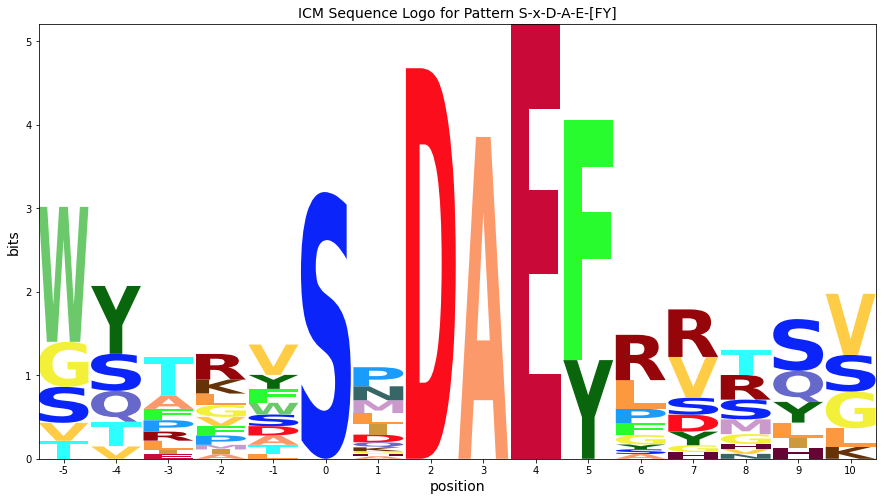

----------------------------------------------------------------------
h Pattern: S-x-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.242424,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.170732,0.000000,0.000000,0.073171,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.536585,0.000000,0.097561,0.000000,0.000000,0.121951,0.000000,0.000000
2,0.440000,0.000000,0.000000,0.060000,0.000000,0.120000,0.000000,0.080000,0.000000,0.060000,0.000000,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.160000,0.000000
3,0.000000,0.349206,0.000000,0.000000,0.000000,0.000000,0.063492,0.000000,0.079365,0.111111,0.047619,0.063492,0.000000,0.000000,0.000000,0.047619,0.047619,0.190476,0.000000,0.000000
4,0.057143,0.000000,0.000000,0.000000,0.000000,0.071429,0.042857,0.000000,0.057143,0.185714,0.314286,0.057143,0.100000,0.000000,0.000000,0.028571,0.000000,0.085714,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.148936,0.021277,0.000000,0.180851,0.000000,0.031915,0.000000,0.000000,0.000000,0.106383,0.000000,0.000000,0.000000,0.489362,0.021277,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.873549,5.436609,-1.050427,-0.519912,-0.719221,-1.157342,-1.465464,2.275618,-0.408881,-2.288586,-0.623005,-1.349987,-2.451525,-0.934949,-1.465464,-0.533209,-2.288586,-1.408881,-0.012952,-1.012952
1,-2.076366,0.710231,1.746756,-0.722729,-0.922038,0.639841,-1.668281,-1.097124,-0.611698,-2.491403,-0.825822,-1.552804,1.869220,-1.137766,0.653647,-2.736026,-2.491403,0.973265,-0.215769,-1.215769
2,2.248650,0.511685,-1.451789,1.078725,-1.120583,1.248650,-1.866827,1.026258,-0.810243,-0.689949,-1.024368,0.570579,-2.852888,-1.336312,-1.866827,-2.934571,-2.689949,-1.810243,2.755610,-1.414315
3,-2.520668,4.789490,-1.697546,-1.167031,-1.366340,-1.804461,0.209345,-1.541426,1.528963,0.064295,0.729876,0.324822,-3.098644,-1.582068,-2.112583,-1.180328,-0.935705,1.644440,-0.660071,-1.660071
4,-0.315553,0.149115,-1.814359,-1.283845,-1.483153,0.663688,-0.229397,-1.658240,1.149115,0.754836,3.136624,0.208009,-0.215458,-1.698882,-2.229397,-1.712179,-3.052519,0.634542,-0.776885,-1.776885
5,-2.978518,-0.191922,-2.155396,-1.624882,-1.824190,-2.262311,-2.570434,-1.999277,-1.513850,-3.393556,-1.727975,-2.454957,-3.556495,-2.039919,-2.570434,2.931677,-3.393556,-2.513850,-1.117922,-2.117922
6,-2.978518,-0.191922,1.751494,-0.039919,-1.824190,1.907614,-2.570434,0.000723,-1.513850,-3.393556,-1.727975,1.004475,-3.556495,-2.039919,-2.570434,1.916411,-1.808593,-2.513850,-1.117922,-2.117922
7,3.591337,-0.191922,-2.155396,-1.624882,-1.824190,-2.262311,-2.570434,-1.999277,-1.513850,-3.393556,-1.727975,-2.454957,-3.556495,-2.039919,-2.570434,-3.638178,-3.393556,-2.513850,-1.117922,-2.117922
8,-2.978518,-0.191922,-2.155396,4.944974,-1.824190,-2.262311,-2.570434,-1.999277,-1.513850,-3.393556,-1.727975,-2.454957,-3.556495,-2.039919,-2.570434,-3.638178,-3.393556,-2.513850,-1.117922,-2.117922


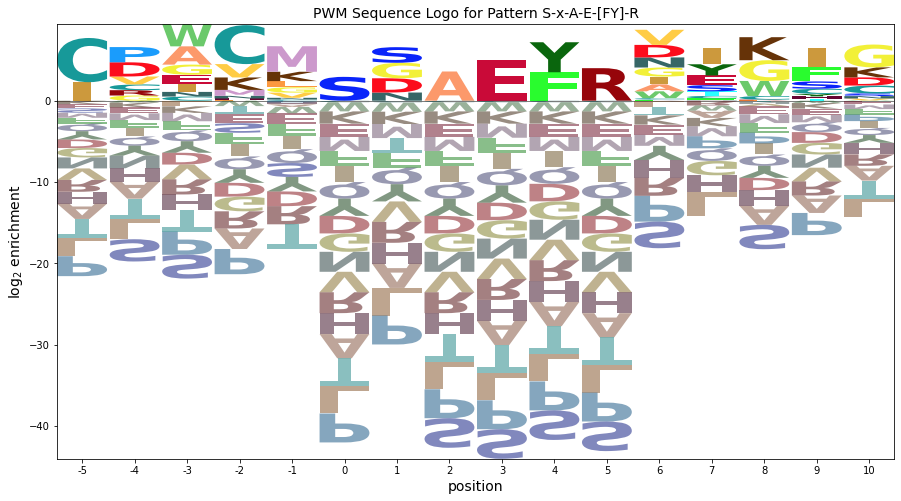

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,3.126297,0.000000,0.000000,0.000000,0.000000,0.000000,1.136835,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.426313,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.331652,0.000000,0.000000,0.142136,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.042334,0.000000,0.189515,0.000000,0.000000,0.236894,0.000000,0.000000
2,0.894624,0.000000,0.000000,0.121994,0.000000,0.243988,0.000000,0.162659,0.000000,0.121994,0.000000,0.162659,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.325318,0.000000
3,0.000000,0.800752,0.000000,0.000000,0.000000,0.000000,0.145591,0.000000,0.181989,0.254785,0.109193,0.145591,0.000000,0.000000,0.000000,0.109193,0.109193,0.436774,0.000000,0.000000
4,0.079014,0.000000,0.000000,0.000000,0.000000,0.098768,0.059261,0.000000,0.079014,0.256797,0.434580,0.079014,0.138275,0.000000,0.000000,0.039507,0.000000,0.118522,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.266870,0.038124,0.000000,0.324056,0.000000,0.057186,0.000000,0.000000,0.000000,0.190621,0.000000,0.000000,0.000000,0.876857,0.038124,0.000000,0.000000,0.000000
7,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


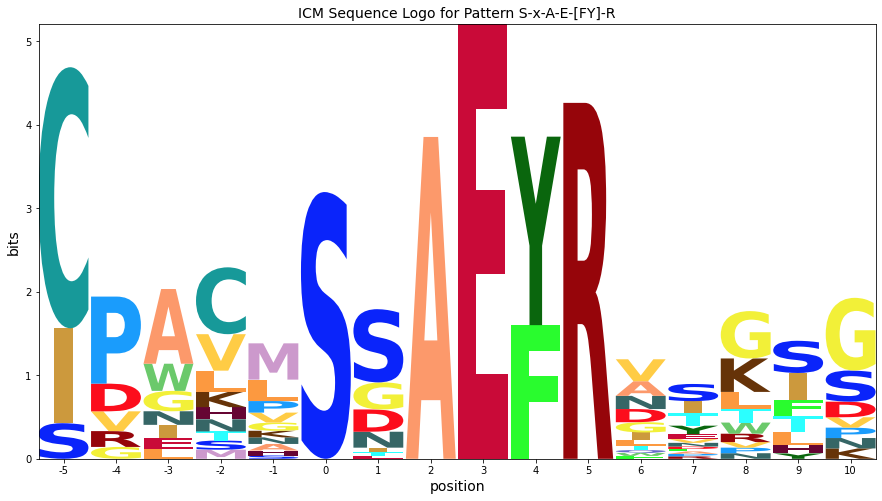

----------------------------------------------------------------------
i Pattern: D-A-E-[FY]-A
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.153846,0.000000,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.153846,0.538462,0.000000,0.000000
1,0.090909,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,0.000000,0.136364,0.000000,0.000000,0.000000,0.227273,0.000000,0.272727,0.090909,0.090909
2,0.000000,0.0,0.090909,0.000000,0.272727,0.000000,0.121212,0.151515,0.000000,0.000000,0.000000,0.060606,0.000000,0.000000,0.000000,0.121212,0.000000,0.121212,0.000000,0.060606
3,0.000000,0.0,0.000000,0.000000,0.000000,0.060606,0.272727,0.000000,0.060606,0.000000,0.000000,0.000000,0.121212,0.000000,0.000000,0.060606,0.212121,0.212121,0.000000,0.000000
4,0.128205,0.0,0.000000,0.000000,0.000000,0.000000,0.128205,0.051282,0.000000,0.000000,0.076923,0.051282,0.000000,0.000000,0.102564,0.128205,0.230769,0.051282,0.051282,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.688889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.311111


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.190023,1.596574,-0.366900,0.163614,-0.035694,1.111147,-0.781938,1.374181,0.274646,-1.605060,0.060521,-0.666461,-1.767999,-0.251423,-0.781938,-1.849682,-0.020098,2.274646,0.670574,-0.329426
1,0.047017,1.248650,-0.714824,-0.184309,-0.383618,-0.821739,-1.129861,-0.558704,-0.073278,-0.368021,-0.287402,0.985616,-2.115922,-0.599346,-1.129861,0.387357,-1.952983,1.734077,1.907614,0.907614
2,-1.873549,0.913047,0.949573,-0.519912,2.602707,-1.157342,0.856464,1.690655,-0.408881,-2.288586,-0.623005,0.234976,-2.451525,-0.934949,-1.465464,-0.211281,-2.288586,0.913047,-0.012952,0.572011
3,-1.873549,0.913047,-1.050427,-0.519912,-0.719221,0.427621,1.856464,-0.894307,1.176082,-2.288586,-0.623005,-1.349987,-0.129597,-0.934949,-1.465464,-0.948246,0.711414,1.591119,-0.012952,-1.012952
4,0.556691,0.758325,-1.205149,-0.674635,-0.873943,-1.312064,0.964776,0.535932,-0.563603,-2.443309,1.222272,0.080253,-2.606248,-1.089672,0.701741,-0.102969,0.878619,0.021359,1.417288,-1.167675
5,-2.167996,0.618600,4.178688,-0.814359,-1.013668,-1.451789,-1.759912,-1.188755,-0.703328,-2.583034,-0.917453,-1.644434,-2.745972,-1.229397,-1.759912,-2.827656,-2.583034,-1.703328,-0.307399,-1.307399
6,3.355566,0.618600,-1.344874,-0.814359,-1.013668,-1.451789,-1.759912,-1.188755,-0.703328,-2.583034,-0.917453,-1.644434,-2.745972,-1.229397,-1.759912,-2.827656,-2.583034,-1.703328,-0.307399,-1.307399
7,-2.167996,0.618600,-1.344874,4.709203,-1.013668,-1.451789,-1.759912,-1.188755,-0.703328,-2.583034,-0.917453,-1.644434,-2.745972,-1.229397,-1.759912,-2.827656,-2.583034,-1.703328,-0.307399,-1.307399
8,-2.167996,0.618600,-1.344874,-0.814359,3.986332,-1.451789,-1.759912,-1.188755,-0.703328,-2.583034,-0.917453,-1.644434,-2.745972,-1.229397,-1.759912,-2.827656,-2.583034,-1.703328,-0.307399,2.599491


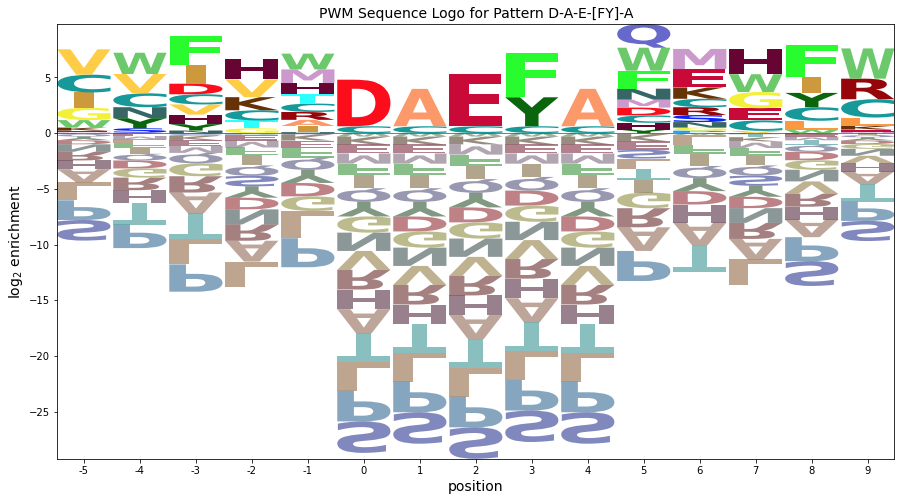

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.396048,0.000000,0.396048,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.396048,1.386170,0.000000,0.000000
1,0.133205,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.133205,0.000000,0.199808,0.000000,0.000000,0.000000,0.333013,0.000000,0.399616,0.133205,0.133205
2,0.000000,0.0,0.151511,0.000000,0.454532,0.000000,0.202014,0.252518,0.000000,0.000000,0.000000,0.101007,0.000000,0.000000,0.000000,0.202014,0.000000,0.202014,0.000000,0.101007
3,0.000000,0.0,0.000000,0.000000,0.000000,0.086891,0.391010,0.000000,0.086891,0.000000,0.000000,0.000000,0.173782,0.000000,0.000000,0.086891,0.304119,0.304119,0.000000,0.000000
4,0.119493,0.0,0.000000,0.000000,0.000000,0.000000,0.119493,0.047797,0.000000,0.000000,0.071696,0.047797,0.000000,0.000000,0.095595,0.119493,0.215088,0.047797,0.047797,0.000000
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,2.771307,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.251558


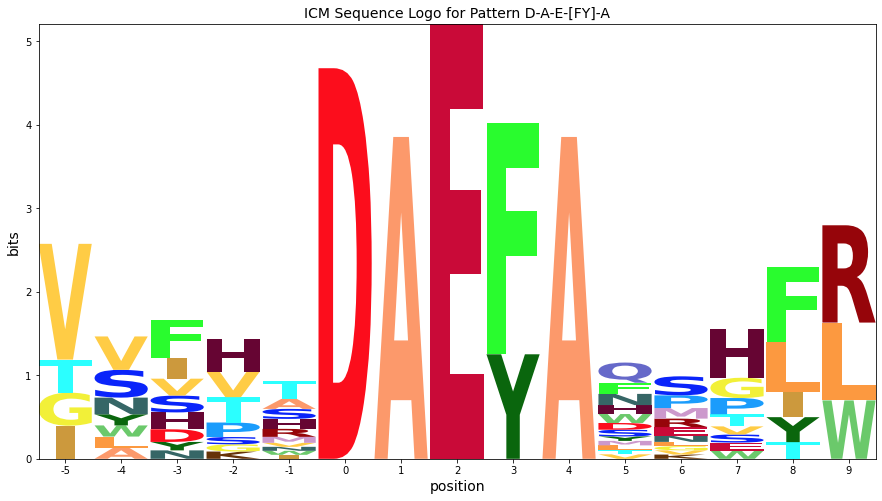

----------------------------------------------------------------------
j Pattern: G-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.060606,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060606,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.393939,0.000000,0.151515
1,0.000000,0.0,0.000000,0.000000,0.000000,0.100000,0.075000,0.100000,0.000000,0.000000,0.000000,0.100000,0.000000,0.325000,0.000000,0.050000,0.175000,0.000000,0.075000,0.000000
2,0.000000,0.0,0.040816,0.000000,0.000000,0.000000,0.040816,0.306122,0.000000,0.204082,0.081633,0.000000,0.000000,0.040816,0.000000,0.061224,0.061224,0.163265,0.000000,0.000000
3,0.072727,0.0,0.000000,0.000000,0.000000,0.036364,0.000000,0.036364,0.000000,0.200000,0.000000,0.000000,0.090909,0.000000,0.036364,0.200000,0.272727,0.054545,0.000000,0.000000
4,0.063492,0.0,0.031746,0.031746,0.000000,0.000000,0.000000,0.000000,0.000000,0.031746,0.000000,0.063492,0.079365,0.079365,0.031746,0.269841,0.253968,0.000000,0.000000,0.063492
5,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.492308,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.507692


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.288586,0.913047,-1.050427,-0.519912,-0.719221,-1.157342,-1.465464,-0.894307,1.176082,-2.288586,-0.623005,-1.349987,-2.451525,-0.934949,-1.465464,1.051754,-2.288586,2.398474,-0.012952,1.572011
1,-2.052519,0.734077,-1.229397,-0.698882,-0.898191,0.985616,0.355566,1.248650,-0.587851,-2.467557,-0.801976,0.792971,-2.630495,2.693435,-1.644434,-1.127216,0.532443,-1.587851,1.808078,-1.191922
2,-2.254153,0.532443,0.153932,-0.900516,-1.099825,-1.537946,-0.261106,2.725089,-0.789485,0.790241,1.318319,-1.730591,-2.832129,0.269409,-1.846068,-0.913813,-0.669190,1.380440,-0.393556,-1.393556
3,-0.052519,0.412149,-1.551325,-1.020810,-1.220119,-0.073278,-1.966362,0.189757,-0.909779,0.795478,-1.123904,-1.850885,-0.367461,-1.435848,-0.381400,0.550855,1.210515,0.090221,-0.513850,-1.513850
4,-0.198740,0.265928,-0.112583,0.417932,-1.366340,-1.804461,-2.112583,-1.541426,-1.056000,-1.350743,-1.270124,0.324822,-0.513681,1.002894,-0.527621,0.989597,1.151757,-2.056000,-0.660071,0.661857
5,-2.555019,0.231577,-1.731897,-1.201382,-1.400691,4.205582,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
6,3.489375,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
7,-2.555019,0.231577,-1.731897,4.843012,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
8,-2.555019,0.231577,-1.731897,-1.201382,3.643703,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,3.393040


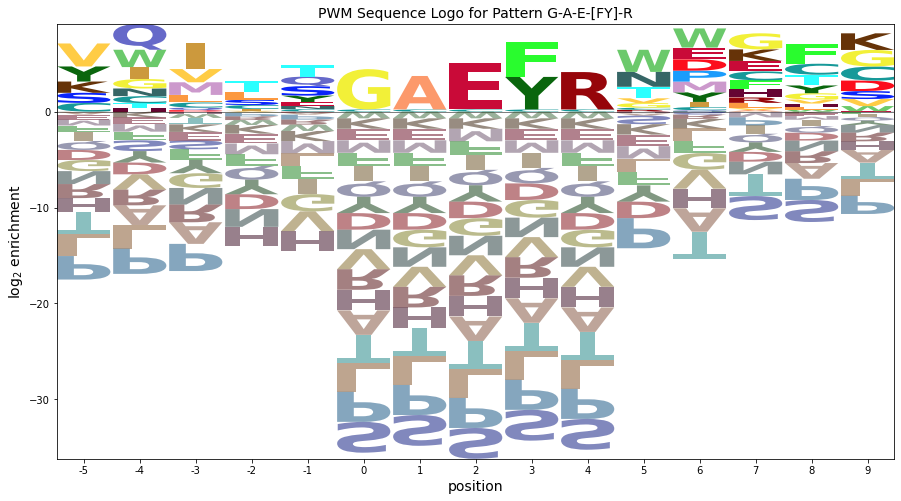

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.125831,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125831,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.692072,0.000000,0.817903,0.000000,0.314578
1,0.000000,0.0,0.000000,0.000000,0.000000,0.170560,0.127920,0.170560,0.000000,0.000000,0.000000,0.170560,0.000000,0.554320,0.000000,0.085280,0.298480,0.000000,0.127920,0.000000
2,0.000000,0.0,0.061182,0.000000,0.000000,0.000000,0.061182,0.458866,0.000000,0.305911,0.122364,0.000000,0.000000,0.061182,0.000000,0.091773,0.091773,0.244728,0.000000,0.000000
3,0.057858,0.0,0.000000,0.000000,0.000000,0.028929,0.000000,0.028929,0.000000,0.159109,0.000000,0.000000,0.072322,0.000000,0.028929,0.159109,0.216967,0.043393,0.000000,0.000000
4,0.049169,0.0,0.024584,0.024584,0.000000,0.000000,0.000000,0.000000,0.000000,0.024584,0.000000,0.049169,0.061461,0.061461,0.024584,0.208966,0.196674,0.000000,0.000000,0.049169
5,0.000000,0.0,0.000000,0.000000,0.000000,4.570579,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.900182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.959563


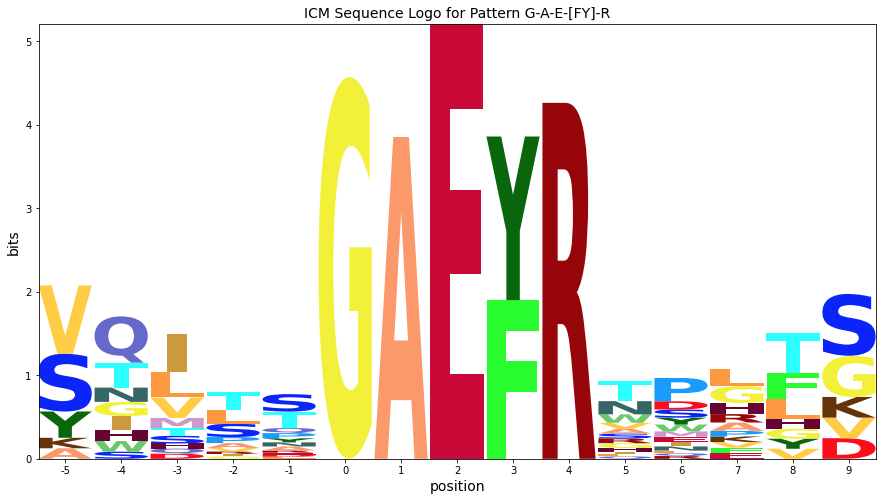

----------------------------------------------------------------------
k Pattern: S-G-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.320000,0.000000,0.000000,0.120000,0.080000,0.000000,0.080000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.057143,0.0,0.057143,0.000000,0.057143,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.171429,0.000000,0.000000,0.228571,0.142857,0.057143,0.228571,0.000000
2,0.000000,0.0,0.086957,0.130435,0.000000,0.000000,0.000000,0.043478,0.000000,0.043478,0.086957,0.000000,0.000000,0.043478,0.000000,0.000000,0.326087,0.195652,0.043478,0.000000
3,0.038462,0.0,0.000000,0.192308,0.038462,0.000000,0.000000,0.115385,0.000000,0.057692,0.038462,0.115385,0.038462,0.000000,0.000000,0.076923,0.173077,0.000000,0.000000,0.115385
4,0.074074,0.0,0.074074,0.277778,0.055556,0.000000,0.000000,0.000000,0.000000,0.185185,0.037037,0.037037,0.111111,0.000000,0.111111,0.000000,0.000000,0.000000,0.037037,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.611111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.388889


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.637482,1.149115,-0.814359,-0.283845,-0.483153,2.248650,-1.229397,-0.658240,1.827187,-0.467557,-0.386938,0.471043,1.243974,-0.698882,-1.229397,-2.297141,-2.052519,-1.172813,0.223115,-0.776885
1,-0.342026,0.859608,0.481097,-0.573351,0.812302,-1.210781,-1.518903,-0.947747,-0.462320,-2.342026,-0.676445,-1.403426,0.302391,-0.988389,-1.518903,0.583277,0.242937,0.122643,3.103534,-1.066391
2,-2.190023,0.596574,0.955028,1.970969,-1.035694,-1.473816,-1.781938,0.374181,-0.725354,-1.020098,1.382449,-1.666461,-2.767999,0.333539,-1.781938,-2.849682,1.394940,1.596574,1.255537,-1.329426
3,-0.730591,0.471043,-1.492431,2.497515,0.423737,-1.599346,-1.907469,1.471043,-0.850885,-0.730591,0.519953,1.015363,-1.308567,-1.376954,-1.907469,-0.653285,0.591337,-1.850885,-0.454957,1.352398
4,-0.033154,0.431515,0.789969,2.998555,0.799246,-1.638875,-1.946997,-1.375840,-0.890414,0.689312,0.480424,-0.246557,-0.125703,-1.416482,0.860358,-3.014742,-2.770119,-1.890414,1.090478,-1.494485
5,-2.355082,0.431515,-1.531960,-1.001445,-1.200754,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,2.766618,-2.770119,-1.890414,-0.494485,-1.494485
6,-2.355082,0.431515,-1.531960,-1.001445,-1.200754,4.142485,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,-3.014742,-2.770119,-1.890414,-0.494485,-1.494485
7,-2.355082,0.431515,-1.531960,4.779915,-1.200754,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,-3.014742,-2.770119,-1.890414,-0.494485,-1.494485
8,-2.355082,0.431515,-1.531960,-1.001445,3.886709,-1.638875,-1.946997,-1.375840,-0.890414,-2.770119,-1.104538,-1.831520,-2.933058,-1.416482,-1.946997,-3.014742,-2.770119,-1.890414,-0.494485,2.964947


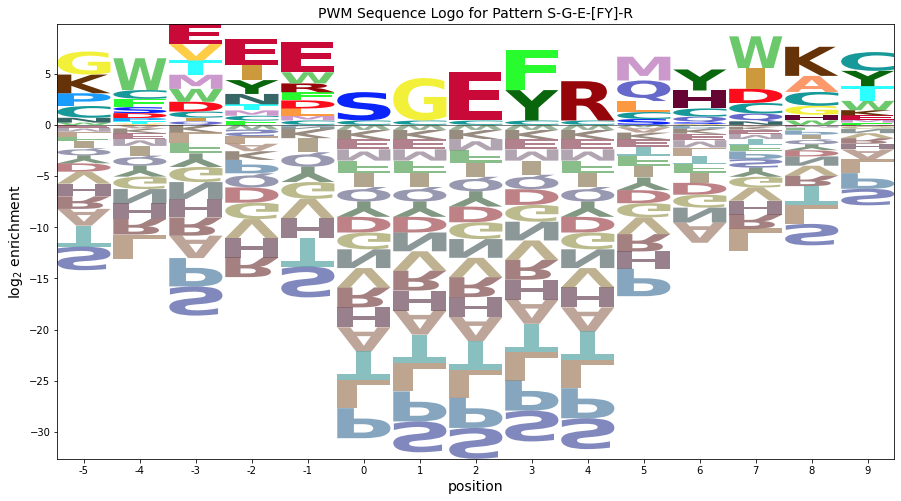

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.650214,0.000000,0.000000,0.243830,0.162554,0.000000,0.162554,0.812768,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.077463,0.0,0.077463,0.000000,0.077463,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.232390,0.000000,0.000000,0.309853,0.193658,0.077463,0.309853,0.000000
2,0.000000,0.0,0.134139,0.201208,0.000000,0.000000,0.000000,0.067069,0.000000,0.067069,0.134139,0.000000,0.000000,0.067069,0.000000,0.000000,0.503021,0.301812,0.067069,0.000000
3,0.042004,0.0,0.000000,0.210018,0.042004,0.000000,0.000000,0.126011,0.000000,0.063005,0.042004,0.126011,0.042004,0.000000,0.000000,0.084007,0.189016,0.000000,0.000000,0.126011
4,0.104429,0.0,0.104429,0.391610,0.078322,0.000000,0.000000,0.000000,0.000000,0.261073,0.052215,0.052215,0.156644,0.000000,0.156644,0.000000,0.000000,0.000000,0.052215,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,4.570579,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,2.401906,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.528486


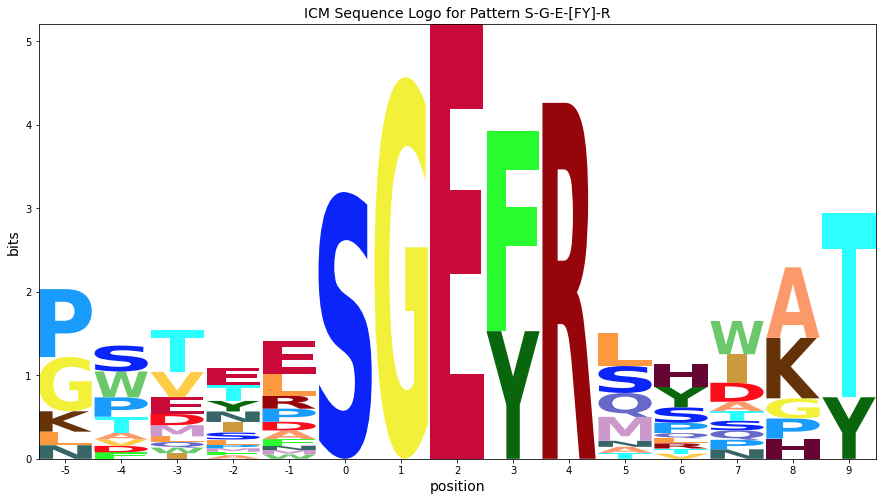

----------------------------------------------------------------------
l Pattern: P-x-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.095238,0.095238,0.000000,0.000000,0.000000,0.000000,0.000000,0.095238,0.000000,0.0,0.000000,0.333333,0.380952,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.142857,0.095238,0.190476,0.000000,0.000000,0.000000,0.000000,0.000000,0.238095,0.0,0.095238,0.238095,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.037037,0.074074,0.000000,0.222222,0.333333,0.037037,0.055556,0.000000,0.092593,0.000000,0.0,0.000000,0.000000,0.092593,0.055556,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.040541,0.027027,0.000000,0.000000,0.067568,0.067568,0.148649,0.000000,0.0,0.000000,0.189189,0.337838,0.081081,0.000000,0.040541
4,0.197674,0.0,0.000000,0.000000,0.000000,0.116279,0.034884,0.046512,0.000000,0.081395,0.000000,0.058140,0.081395,0.0,0.209302,0.000000,0.000000,0.034884,0.000000,0.139535
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.209302,0.000000,0.000000,0.058140,0.000000,0.000000,0.000000,0.034884,0.000000,0.093023,0.000000,0.0,0.000000,0.360465,0.220930,0.000000,0.000000,0.023256
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.503180,1.283416,-0.680058,-0.149544,1.236110,0.797989,-1.095096,-0.523939,-0.038512,-1.918218,-0.252637,0.605344,-2.081157,-0.564581,-1.095096,0.837160,1.251707,-1.038512,0.357416,-0.642584
1,-1.503180,1.283416,-0.680058,-0.149544,1.651148,0.797989,1.226832,-0.523939,-0.038512,-1.918218,-0.252637,-0.979619,0.503806,-0.564581,0.489867,0.422122,-1.918218,-1.038512,0.357416,-0.642584
2,-2.355082,0.431515,-1.531960,0.583518,1.121174,-1.638875,1.753443,2.872087,0.694549,-0.770119,-1.104538,0.753443,-2.933058,-1.416482,-1.946997,-3.014742,-0.185157,0.109586,-0.494485,-1.494485
3,-2.700217,0.086379,-1.877095,-1.346580,-1.545889,0.015990,-0.707170,-1.720976,-1.235549,-0.530292,1.135289,1.408307,-3.278193,-1.761618,-2.292133,0.547013,1.585185,0.571806,-0.839620,0.160380
4,1.296376,-0.086953,-2.050427,-1.519912,-1.719221,1.302090,-0.465464,0.427621,-1.408881,-0.288586,-1.623005,0.234976,-0.451525,-1.934949,1.782463,-3.533209,-3.288586,-0.408881,-1.012952,1.687488
5,-2.873549,-0.086953,-2.050427,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,2.991419,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952
6,-2.873549,-0.086953,2.197501,-1.519912,-1.719221,0.427621,-2.465464,-1.894307,-1.408881,-1.288586,-1.623005,0.819938,-3.451525,-1.934949,-2.465464,1.466791,1.033342,-2.408881,-1.012952,-0.427989
7,3.569395,-0.086953,-2.050427,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952
8,-2.873549,-0.086953,-2.050427,4.923032,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952


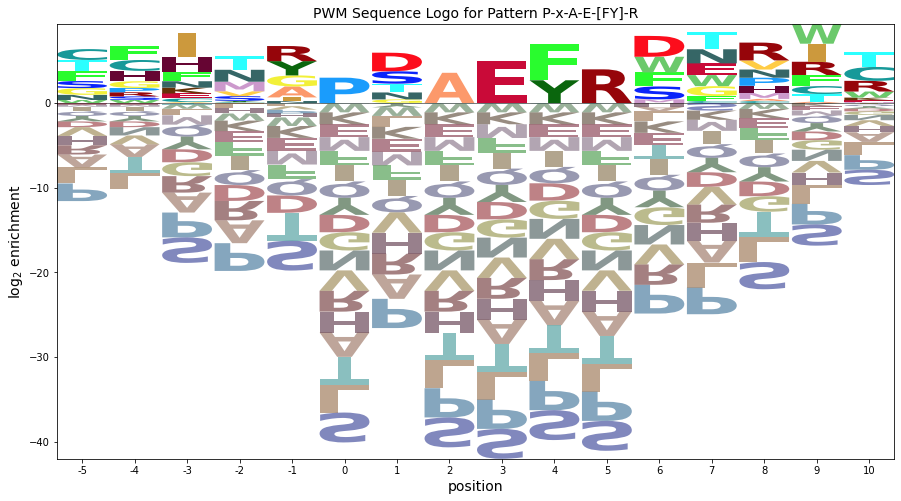

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.159659,0.159659,0.000000,0.000000,0.000000,0.000000,0.000000,0.159659,0.000000,0.0,0.000000,0.558808,0.638638,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.202946,0.135297,0.270594,0.000000,0.000000,0.000000,0.000000,0.000000,0.338243,0.0,0.135297,0.338243,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.064231,0.128461,0.000000,0.385384,0.578075,0.064231,0.096346,0.000000,0.160576,0.000000,0.0,0.000000,0.000000,0.160576,0.096346,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.044965,0.029977,0.000000,0.000000,0.074942,0.074942,0.164871,0.000000,0.0,0.000000,0.209836,0.374708,0.089930,0.000000,0.044965
4,0.218501,0.0,0.000000,0.000000,0.000000,0.128530,0.038559,0.051412,0.000000,0.089971,0.000000,0.064265,0.089971,0.0,0.231354,0.000000,0.000000,0.038559,0.000000,0.154236
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.276395,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.304846,0.000000,0.000000,0.084679,0.000000,0.000000,0.000000,0.050808,0.000000,0.135487,0.000000,0.0,0.000000,0.525012,0.321782,0.000000,0.000000,0.033872
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


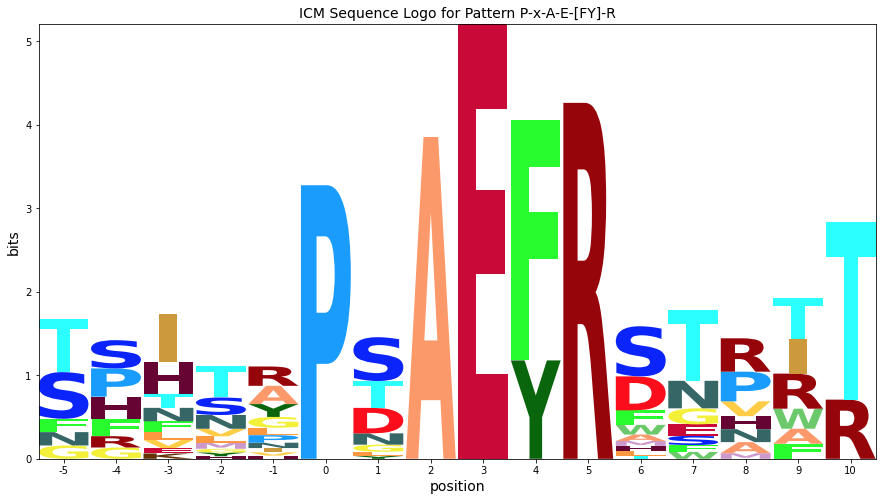

----------------------------------------------------------------------
m Pattern: N-x-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.0,0.000000,0.000000,0.444444,0.222222,0.00,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.080000,0.0,0.000000,0.000000,0.240000,0.320000,0.000000,0.000000,0.2,0.000000,0.080000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.080000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.114286,0.057143,0.000000,0.0,0.142857,0.057143,0.057143,0.000000,0.00,0.000000,0.314286,0.000000,0.000000,0.257143,0.000000
3,0.000000,0.0,0.136364,0.000000,0.000000,0.159091,0.000000,0.000000,0.0,0.000000,0.045455,0.272727,0.090909,0.00,0.000000,0.295455,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.0,0.000000,0.000000,0.065574,0.081967,0.000000,0.114754,0.0,0.000000,0.344262,0.032787,0.000000,0.00,0.114754,0.147541,0.032787,0.065574,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.062500,0.031250,0.000000,0.062500,0.000000,0.000000,0.0,0.000000,0.000000,0.234375,0.078125,0.00,0.000000,0.421875,0.109375,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.393556,1.393040,-0.570434,-0.039919,-0.239228,-0.677349,-0.985471,1.907614,0.071112,-1.808593,-0.143013,2.299931,0.350396,-0.454957,0.599491,-2.053216,-1.808593,-0.928888,0.467041,-0.532959
1,-0.052519,1.149115,-0.814359,-0.283845,2.324202,2.248650,-1.229397,-0.658240,2.412149,-2.052519,1.198024,-1.113920,-2.215458,-0.698882,-1.229397,-2.297141,-2.052519,-1.172813,0.223115,0.808078
2,-1.926988,0.859608,-1.103866,-0.573351,-0.772660,1.111147,0.066059,-0.947747,-0.462320,0.242937,0.908518,0.181536,-2.504964,-0.988389,-1.518903,0.998314,-2.342026,-1.462320,3.255537,-1.066391
3,-2.145628,0.640968,1.484849,-0.791991,-0.991300,1.570579,-1.737544,-1.166387,-0.680960,-2.560666,0.689878,2.078373,-0.401676,-1.207029,-1.737544,1.002067,-2.560666,-1.680960,-0.285032,-1.285032
4,-2.485478,0.301118,-1.662356,-1.131841,0.990778,0.815691,-2.077394,1.493763,-1.020810,-2.900516,3.224497,-0.376954,-3.063455,-1.546879,0.922606,0.176790,-1.315553,0.301118,-0.624882,-1.624882
5,-2.537946,0.248650,-1.714824,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,4.007984,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
6,-2.537946,0.248650,0.607104,0.400654,-1.383618,0.500189,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,1.985616,-0.530959,-1.599346,-2.129861,1.609749,0.047017,-2.073278,-0.677349,-1.677349
7,3.484422,0.248650,-1.714824,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
8,-2.537946,0.248650,-1.714824,4.838059,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349


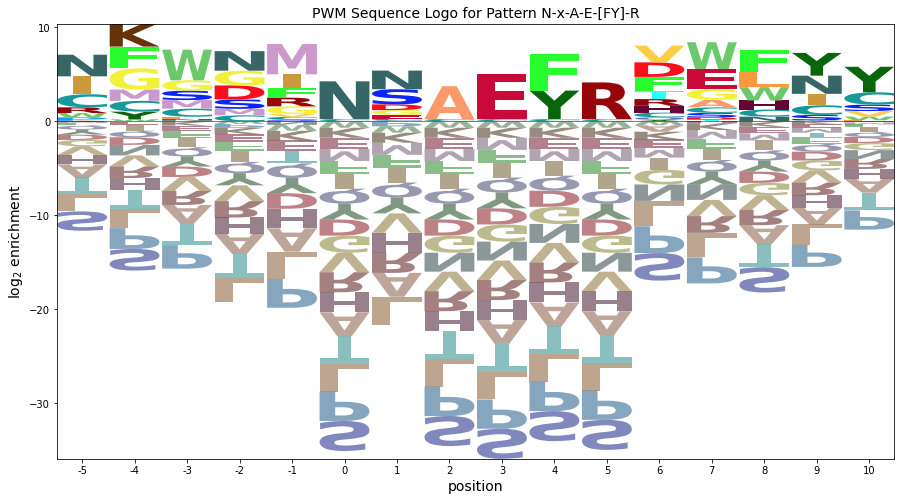

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.529997,0.000000,0.000000,0.000000,1.059994,0.529997,0.000000,0.264999,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.197067,0.0,0.000000,0.000000,0.591202,0.788269,0.000000,0.000000,0.492668,0.000000,0.197067,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.197067
2,0.000000,0.0,0.000000,0.000000,0.000000,0.203148,0.101574,0.000000,0.000000,0.253934,0.101574,0.101574,0.000000,0.000000,0.000000,0.558656,0.000000,0.000000,0.457082,0.000000
3,0.000000,0.0,0.227828,0.000000,0.000000,0.265799,0.000000,0.000000,0.000000,0.000000,0.075943,0.455655,0.151885,0.000000,0.000000,0.493627,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.0,0.000000,0.000000,0.113230,0.141537,0.000000,0.198152,0.000000,0.000000,0.594457,0.056615,0.000000,0.000000,0.198152,0.254767,0.056615,0.113230,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.377934,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.089881,0.044941,0.000000,0.089881,0.000000,0.000000,0.000000,0.000000,0.000000,0.337054,0.112351,0.000000,0.000000,0.606698,0.157292,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


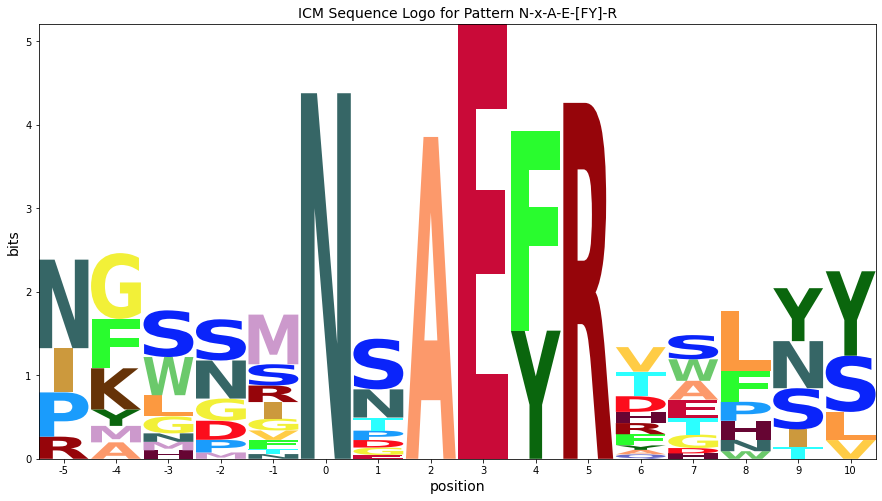

----------------------------------------------------------------------
n Pattern: L-D-A-E-[FY]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.133333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.066667,0.166667,0.000000,0.233333,0.400000,0.000000,0.000000,0.000000
1,0.071429,0.0,0.047619,0.000000,0.000000,0.119048,0.000000,0.0000,0.000000,0.071429,0.000000,0.380952,0.119048,0.095238,0.095238,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.094340,0.056604,0.0000,0.000000,0.075472,0.000000,0.000000,0.075472,0.264151,0.000000,0.301887,0.132075,0.000000,0.000000,0.000000
3,0.067797,0.0,0.067797,0.000000,0.000000,0.000000,0.084746,0.0000,0.000000,0.000000,0.067797,0.152542,0.000000,0.033898,0.000000,0.203390,0.000000,0.237288,0.084746,0.000000
4,0.000000,0.0,0.140625,0.031250,0.031250,0.000000,0.000000,0.0625,0.000000,0.000000,0.000000,0.078125,0.062500,0.000000,0.000000,0.140625,0.046875,0.000000,0.000000,0.406250
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.532443,0.997112,-0.966362,-0.435848,-0.635156,-1.073278,-1.381400,-0.810243,-0.324816,-2.204522,-0.538941,-1.265923,-0.782498,1.734077,-1.381400,0.550855,1.495918,-1.324816,0.071112,-0.928888
1,-0.099825,0.686772,0.308260,-0.746188,-0.945497,1.201345,-1.691740,-1.120583,-0.635156,-0.514862,-0.849281,2.511200,-0.092838,1.160703,0.630188,-2.759485,-2.514862,-1.635156,-0.239228,-1.239228
2,-2.335453,0.451143,-1.512331,-0.981816,-1.181125,0.965717,0.072632,-1.356212,-0.870785,-0.428562,-1.084910,-1.811891,-0.591501,2.510037,-1.927368,1.092350,0.249509,-1.870785,-0.474856,-1.474856
3,-0.127481,0.337187,0.695641,-1.095772,-1.295081,-1.733202,0.543638,-1.470168,-0.984741,-2.864447,1.123062,1.396081,-3.027385,0.074153,-2.041324,0.591371,-2.864447,1.922150,1.996150,-1.588812
4,-2.537946,0.248650,1.607104,0.400654,0.201345,-1.821739,-2.129861,0.763224,-1.073278,-2.952983,-1.287402,0.570579,-0.793994,-1.599346,-2.129861,0.124322,-0.952983,-2.073278,-0.677349,3.077539
5,-2.537946,0.248650,-1.714824,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,3.069384,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
6,-2.537946,0.248650,4.307544,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
7,3.484422,0.248650,-1.714824,-1.184309,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349
8,-2.537946,0.248650,-1.714824,4.838059,-1.383618,-1.821739,-2.129861,-1.558704,-1.073278,-2.952983,-1.287402,-2.014384,-3.115922,-1.599346,-2.129861,-3.197606,-2.952983,-2.073278,-0.677349,-1.677349


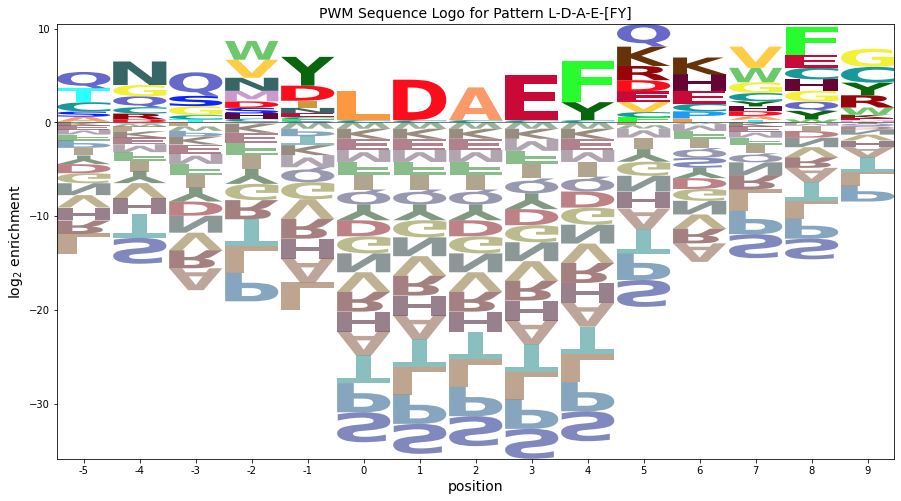

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.207307,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.103654,0.259134,0.000000,0.362787,0.621921,0.000000,0.000000,0.000000
1,0.110529,0.0,0.073686,0.000000,0.000000,0.184216,0.000000,0.000000,0.000000,0.110529,0.000000,0.589491,0.184216,0.147373,0.147373,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.125551,0.075331,0.000000,0.000000,0.100441,0.000000,0.000000,0.100441,0.351544,0.000000,0.401764,0.175772,0.000000,0.000000,0.000000
3,0.091031,0.0,0.091031,0.000000,0.000000,0.000000,0.113789,0.000000,0.000000,0.000000,0.091031,0.204820,0.000000,0.045516,0.000000,0.273093,0.000000,0.318609,0.113789,0.000000
4,0.000000,0.0,0.242039,0.053787,0.053787,0.000000,0.000000,0.107573,0.000000,0.000000,0.000000,0.134466,0.107573,0.000000,0.000000,0.242039,0.080680,0.000000,0.000000,0.699225
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,3.854372,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


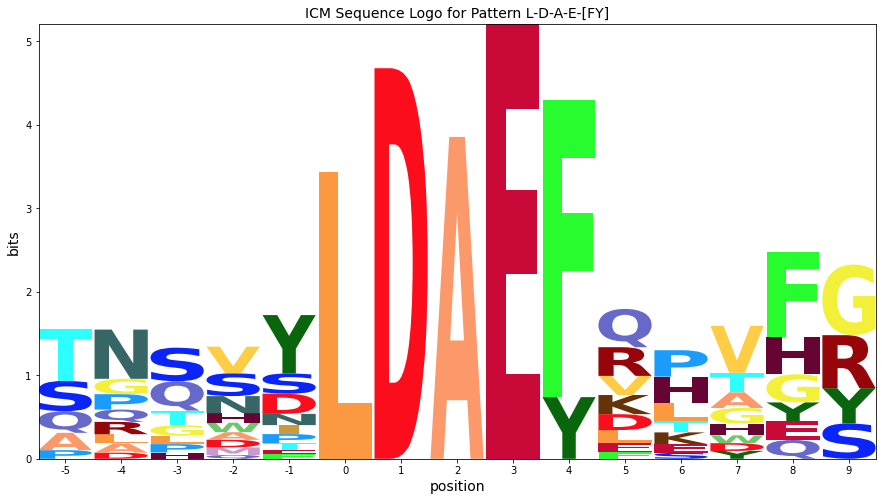

----------------------------------------------------------------------
o Pattern: S-E-F-R-[LV]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.117647,0.000000,0.058824,0.000000,0.088235,0.000000,0.000000,0.000000,0.294118,0.000000,0.088235,0.058824,0.000000,0.205882,0.088235,0.000000,0.000000,0.000000
1,0.040541,0.0,0.027027,0.040541,0.027027,0.378378,0.000000,0.094595,0.000000,0.000000,0.094595,0.000000,0.135135,0.000000,0.000000,0.135135,0.000000,0.027027,0.000000,0.000000
2,0.283784,0.0,0.040541,0.000000,0.000000,0.000000,0.094595,0.040541,0.000000,0.202703,0.000000,0.000000,0.202703,0.000000,0.081081,0.000000,0.027027,0.027027,0.000000,0.000000
3,0.000000,0.0,0.135135,0.000000,0.067568,0.067568,0.000000,0.000000,0.000000,0.135135,0.027027,0.000000,0.000000,0.000000,0.000000,0.378378,0.067568,0.000000,0.094595,0.027027
4,0.000000,0.0,0.109756,0.000000,0.000000,0.048780,0.000000,0.000000,0.000000,0.000000,0.000000,0.170732,0.000000,0.000000,0.000000,0.548780,0.121951,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.900516,0.886080,1.244534,-0.546879,0.838775,-1.184309,0.507569,-0.921275,-0.435848,-2.315553,2.809459,-1.376954,-0.478492,0.623046,-1.492431,0.439824,-0.315553,-1.435848,-0.039919,-1.039919
1,-0.700217,0.086379,-0.292133,0.653420,0.039073,2.873971,-2.292133,1.279024,-1.235549,-3.115255,1.550326,-2.176655,0.181238,-1.761618,-2.292133,0.099554,-3.115255,-0.650587,-0.839620,-1.839620
2,1.759214,0.086379,0.122905,-1.346580,-1.545889,-1.984010,0.707867,0.279024,-1.235549,0.884745,-1.449674,-2.176655,0.721807,-1.761618,0.515222,-3.359877,-1.530292,-0.650587,-0.839620,-1.839620
3,-2.700217,0.086379,1.582337,-1.346580,1.039073,0.600952,-2.292133,-1.720976,-1.235549,0.344177,0.135289,-2.176655,-3.278193,-1.761618,-2.292133,1.498104,-0.530292,-2.235549,2.160380,-0.254658
4,-2.818054,-0.031457,1.326997,-1.464417,-1.663726,0.220081,-2.409969,-1.838812,-1.353386,-3.233091,-1.567510,1.612399,-3.396030,-1.879454,-2.409969,2.045848,0.226340,-2.353386,-0.957457,-1.957457
5,-2.846068,-0.059472,-2.022946,-1.492431,-1.691740,-2.129861,-2.437983,-1.866827,-1.381400,-3.261106,-1.595525,-2.322506,-3.424044,-1.907469,-2.437983,2.903663,-3.261106,-2.381400,-0.985471,-1.985471
6,-2.846068,-0.059472,-2.022946,4.916960,-1.691740,-2.129861,-2.437983,-1.866827,-1.381400,-3.261106,-1.595525,-2.322506,-3.424044,-1.907469,-2.437983,-3.505728,-3.261106,-2.381400,-0.985471,-1.985471
7,-2.846068,-0.059472,-2.022946,-1.492431,4.717651,-2.129861,-2.437983,-1.866827,-1.381400,-3.261106,-1.595525,-2.322506,-3.424044,-1.907469,-2.437983,-3.505728,-3.261106,-2.381400,-0.985471,-1.985471
8,-2.846068,-0.059472,-2.022946,-1.492431,-1.691740,-2.129861,-2.437983,-1.866827,-1.381400,-3.261106,-1.595525,-2.322506,-3.424044,-1.907469,3.971408,-3.505728,-3.261106,-2.381400,-0.985471,-1.985471


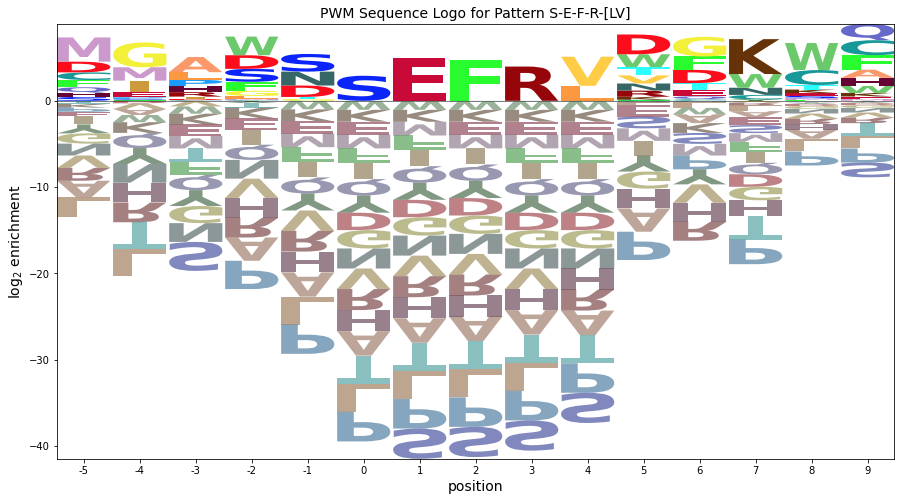

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.175854,0.000000,0.087927,0.000000,0.131890,0.000000,0.000000,0.000000,0.439634,0.000000,0.131890,0.087927,0.000000,0.307744,0.131890,0.000000,0.000000,0.000000
1,0.062351,0.0,0.041568,0.062351,0.041568,0.581947,0.000000,0.145487,0.000000,0.000000,0.145487,0.000000,0.207838,0.000000,0.000000,0.207838,0.000000,0.041568,0.000000,0.000000
2,0.305860,0.0,0.043694,0.000000,0.000000,0.000000,0.101953,0.043694,0.000000,0.218471,0.000000,0.000000,0.218471,0.000000,0.087389,0.000000,0.029130,0.029130,0.000000,0.000000
3,0.000000,0.0,0.174184,0.000000,0.087092,0.087092,0.000000,0.000000,0.000000,0.174184,0.034837,0.000000,0.000000,0.000000,0.000000,0.487715,0.087092,0.000000,0.121929,0.034837
4,0.000000,0.0,0.199022,0.000000,0.000000,0.088454,0.000000,0.000000,0.000000,0.000000,0.000000,0.309590,0.000000,0.000000,0.000000,0.995112,0.221136,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,5.008700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.262456,0.000000,0.000000,0.000000,0.000000,0.000000


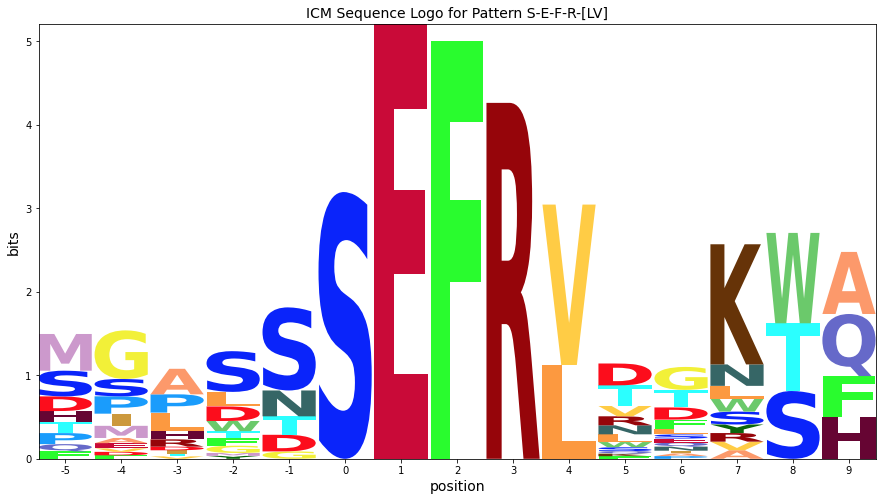

----------------------------------------------------------------------
p Pattern: D-A-E-x-R-[LV]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.044776,0.000000,0.089552,0.000000,0.000000,0.029851,0.000000,0.000000,0.0,0.223881,0.044776,0.149254,0.253731,0.044776,0.074627,0.044776,0.000000,0.000000,0.000000,0.000000
1,0.170455,0.000000,0.000000,0.079545,0.000000,0.125000,0.238636,0.000000,0.0,0.022727,0.022727,0.147727,0.090909,0.056818,0.022727,0.000000,0.000000,0.000000,0.022727,0.000000
2,0.000000,0.000000,0.041667,0.000000,0.000000,0.156250,0.031250,0.156250,0.0,0.020833,0.000000,0.135417,0.187500,0.000000,0.031250,0.083333,0.072917,0.062500,0.000000,0.020833
3,0.101010,0.000000,0.080808,0.080808,0.030303,0.000000,0.222222,0.030303,0.0,0.020202,0.000000,0.030303,0.030303,0.000000,0.070707,0.050505,0.050505,0.020202,0.000000,0.181818
4,0.155963,0.027523,0.000000,0.027523,0.119266,0.018349,0.055046,0.000000,0.0,0.082569,0.045872,0.064220,0.027523,0.000000,0.000000,0.165138,0.110092,0.082569,0.000000,0.018349
5,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.025424,0.000000,0.000000,0.000000,0.016949,0.169492,0.042373,0.0,0.203390,0.025424,0.016949,0.000000,0.000000,0.144068,0.000000,0.016949,0.042373,0.016949,0.279661


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.588572,0.198024,1.041905,-1.234935,-1.434244,-0.287402,-2.180487,-1.609331,-1.123904,0.996391,0.661972,1.394422,1.003377,0.350028,0.404475,-1.248232,-3.003609,-2.123904,-0.727975,-1.727975
1,1.099484,-0.113920,-2.077394,1.453121,-1.746188,1.400654,1.967000,-1.921275,-1.435848,-1.730591,-0.065010,1.430401,-0.308567,0.623046,-0.907469,-3.560176,-3.315553,-2.435848,0.545043,-2.039919
2,-3.003609,-0.217013,0.141441,-1.649972,-1.849281,1.712598,-0.595525,1.975632,-1.538941,-1.833684,-1.753066,1.327307,0.666342,-2.065010,-0.595525,-0.493344,-0.418647,0.268414,-1.143013,-0.558050
3,0.418985,-0.253850,0.952601,1.483116,0.113882,-2.324239,1.891200,-0.061205,-1.575778,-1.870521,-1.789903,-0.516884,-1.618422,-2.101847,0.367639,-1.115144,-0.870521,-0.990815,-1.179849,2.068078
4,1.013069,1.629741,-2.333733,0.196781,1.804827,-0.855686,0.058584,-2.177614,-1.692187,-0.249965,0.678650,0.366706,-1.734832,-2.218256,-2.748771,0.431412,0.128547,0.629741,-1.296259,-0.711296
5,-3.254153,-0.467557,4.463787,-1.900516,-2.099825,-2.537946,-2.846068,-2.274911,-1.789485,-3.669190,-2.003609,-2.730591,-3.832129,-2.315553,-2.846068,-3.913813,-3.669190,-2.789485,-1.393556,-2.393556
6,3.640665,-0.467557,-2.431031,-1.900516,-2.099825,-2.537946,-2.846068,-2.274911,-1.789485,-3.669190,-2.003609,-2.730591,-3.832129,-2.315553,-2.846068,-3.913813,-3.669190,-2.789485,-1.393556,-2.393556
7,-3.254153,-0.467557,-2.431031,4.994302,-2.099825,-2.537946,-2.846068,-2.274911,-1.789485,-3.669190,-2.003609,-2.730591,-3.832129,-2.315553,-2.846068,-3.913813,-3.669190,-2.789485,-1.393556,-2.393556
8,-3.254153,1.532443,-2.431031,-1.900516,-2.099825,-0.952983,1.546249,0.310051,-1.789485,0.974666,-0.003609,-1.145628,-3.832129,-2.315553,1.323857,-3.913813,-2.084228,-0.204522,0.191407,2.693907


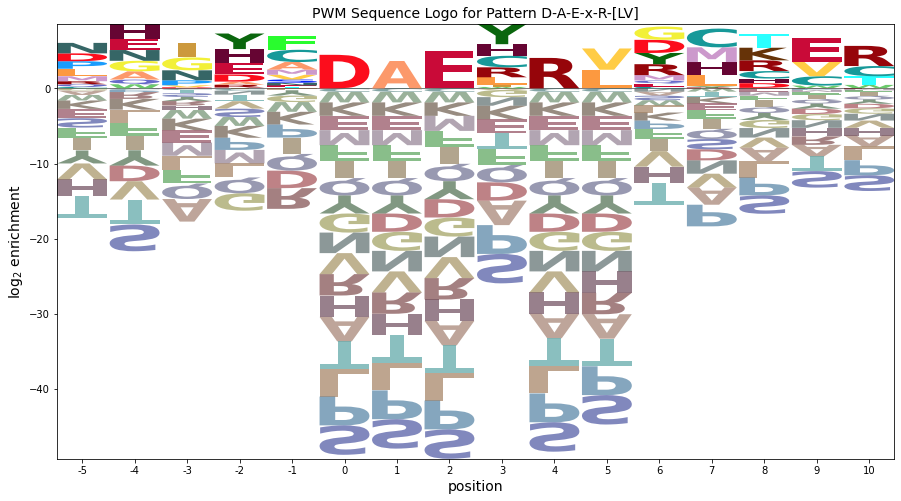

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.042402,0.000000,0.084804,0.000000,0.000000,0.028268,0.000000,0.000000,0.000000,0.212011,0.042402,0.141341,0.240279,0.042402,0.070670,0.042402,0.000000,0.000000,0.000000,0.000000
1,0.213116,0.000000,0.000000,0.099454,0.000000,0.156285,0.298362,0.000000,0.000000,0.028415,0.028415,0.184701,0.113662,0.071039,0.028415,0.000000,0.000000,0.000000,0.028415,0.000000
2,0.000000,0.000000,0.035580,0.000000,0.000000,0.133427,0.026685,0.133427,0.000000,0.017790,0.000000,0.115637,0.160112,0.000000,0.026685,0.071161,0.062266,0.053371,0.000000,0.017790
3,0.093108,0.000000,0.074486,0.074486,0.027932,0.000000,0.204837,0.027932,0.000000,0.018622,0.000000,0.027932,0.027932,0.000000,0.065175,0.046554,0.046554,0.018622,0.000000,0.167594
4,0.092955,0.016404,0.000000,0.016404,0.071083,0.010936,0.032808,0.000000,0.000000,0.049211,0.027340,0.038276,0.016404,0.000000,0.000000,0.098423,0.065615,0.049211,0.000000,0.010936
5,0.000000,0.000000,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.854372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.037503,0.000000,0.000000,0.000000,0.025002,0.250017,0.062504,0.000000,0.300021,0.037503,0.025002,0.000000,0.000000,0.212515,0.000000,0.025002,0.062504,0.025002,0.412529


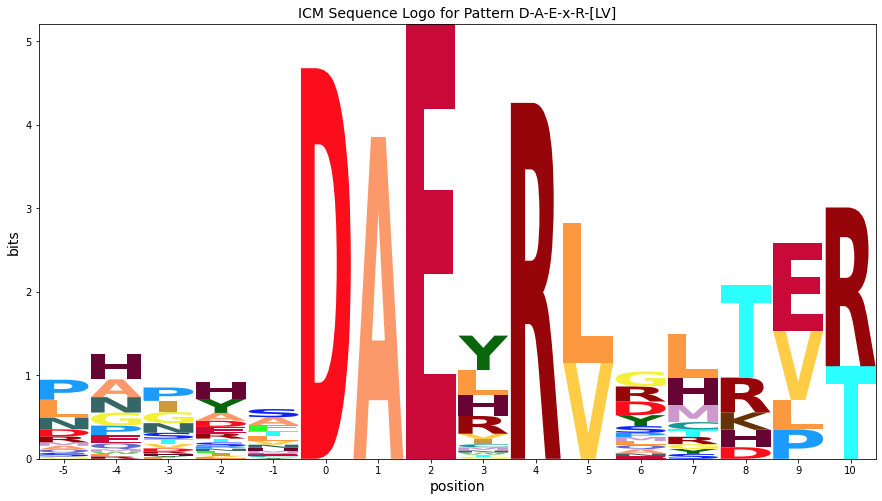

----------------------------------------------------------------------
q Pattern: D-[AS]-E-H-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.1250,0.000000,0.000000,0.000000,0.187500,0.000000,0.187500,0.187500,0.000000,0.125000,0.000000,0.000000,0.187500,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.0000,0.000000,0.093750,0.000000,0.000000,0.000000,0.187500,0.000000,0.250000,0.062500,0.000000,0.000000,0.093750,0.156250,0.062500,0.000000,0.093750
2,0.000000,0.0,0.083333,0.0000,0.000000,0.055556,0.000000,0.000000,0.000000,0.000000,0.055556,0.222222,0.083333,0.000000,0.000000,0.055556,0.000000,0.166667,0.055556,0.222222
3,0.050000,0.0,0.000000,0.2000,0.000000,0.000000,0.125000,0.000000,0.000000,0.075000,0.000000,0.000000,0.050000,0.000000,0.000000,0.275000,0.000000,0.225000,0.000000,0.000000
4,0.000000,0.0,0.046512,0.0000,0.232558,0.046512,0.046512,0.046512,0.000000,0.046512,0.000000,0.000000,0.139535,0.046512,0.000000,0.209302,0.069767,0.069767,0.000000,0.000000
5,0.000000,0.0,1.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.884615,0.0,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.115385,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.0000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.315553,1.471043,-0.492431,1.623046,-0.161225,-0.599346,-0.907469,1.663688,0.149115,0.269409,1.934990,-0.791991,-0.308567,-0.376954,-0.907469,0.024787,-1.730591,-0.850885,0.545043,-0.454957
1,-1.846068,0.940528,-1.022946,-0.492431,-0.691740,0.870139,-1.437983,-0.866827,-0.381400,0.546249,-0.595525,1.847419,-0.839082,-0.907469,-1.437983,-0.505728,0.323857,0.203563,0.014529,1.014529
2,-1.952983,0.833613,0.870139,-0.599346,-0.798655,0.348186,-1.544899,-0.973742,-0.488315,-2.368021,0.882523,1.740504,-0.530959,-1.014384,-1.544899,-1.027681,-2.368021,1.319040,1.492576,2.077539
3,-0.467557,0.734077,-1.229397,2.471043,-0.898191,-1.336312,0.940528,-1.073278,-0.587851,-0.467557,-0.801976,-1.528957,-1.045533,-1.113920,-1.644434,0.872784,-2.467557,1.734077,-0.191922,-1.191922
4,-2.122908,0.663688,0.285176,-0.769271,2.490851,0.178261,-0.129861,0.441296,-0.658240,-0.952983,-0.872365,-1.599346,0.106470,0.400654,-1.714824,0.539360,-0.537946,0.341760,-0.262311,-1.262311
5,-2.315553,0.471043,4.235489,-0.961916,-1.161225,-1.599346,-1.907469,-1.336312,-0.850885,-2.730591,-1.065010,-1.791991,-2.893530,-1.376954,-1.907469,-2.975213,-2.730591,-1.850885,-0.454957,-1.454957
6,3.239035,0.471043,-1.492431,-0.961916,-1.161225,-1.599346,-1.907469,-1.336312,-0.850885,-2.730591,-1.065010,-1.791991,-2.893530,-1.376954,-1.907469,-0.167858,-2.730591,-1.850885,-0.454957,-1.454957
7,-2.315553,0.471043,-1.492431,4.766004,-1.161225,-1.599346,-1.907469,-1.336312,-0.850885,-2.730591,-1.065010,-1.791991,-2.893530,-1.376954,-1.907469,-2.975213,-2.730591,-1.850885,-0.454957,-1.454957
8,-2.315553,0.471043,-1.492431,-0.961916,-1.161225,-1.599346,3.820452,-1.336312,-0.850885,-2.730591,-1.065010,-1.791991,-2.893530,-1.376954,-1.907469,-2.975213,-2.730591,-1.850885,-0.454957,-1.454957


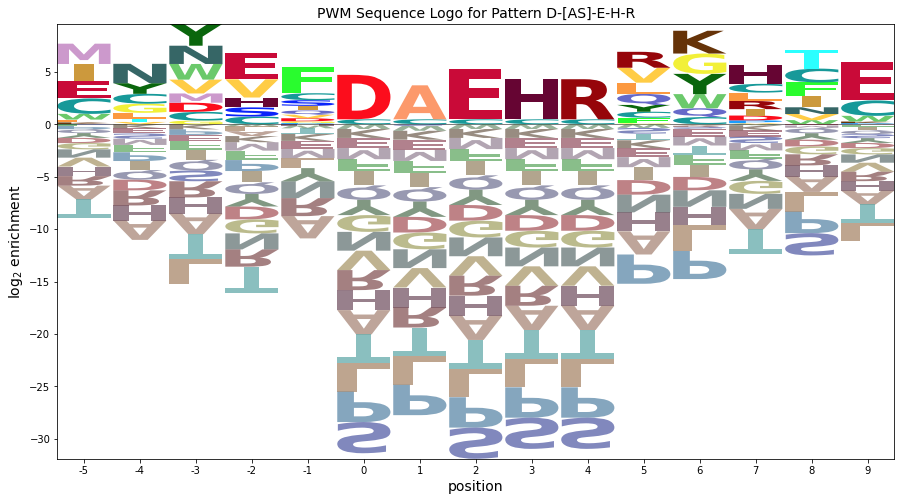

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.200829,0.000000,0.000000,0.000000,0.301243,0.000000,0.301243,0.301243,0.000000,0.200829,0.000000,0.000000,0.301243,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.102164,0.000000,0.000000,0.000000,0.204327,0.000000,0.272436,0.068109,0.000000,0.000000,0.102164,0.170273,0.068109,0.000000,0.102164
2,0.000000,0.0,0.126370,0.000000,0.000000,0.084246,0.000000,0.000000,0.000000,0.000000,0.084246,0.336986,0.126370,0.000000,0.000000,0.084246,0.000000,0.252739,0.084246,0.336986
3,0.074549,0.0,0.000000,0.298198,0.000000,0.000000,0.186374,0.000000,0.000000,0.111824,0.000000,0.000000,0.074549,0.000000,0.000000,0.410022,0.000000,0.335472,0.000000,0.000000
4,0.000000,0.0,0.043661,0.000000,0.218305,0.043661,0.043661,0.043661,0.000000,0.043661,0.000000,0.000000,0.130983,0.043661,0.000000,0.196474,0.065491,0.065491,0.000000,0.000000
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,2.885890,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.376420,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.262456,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


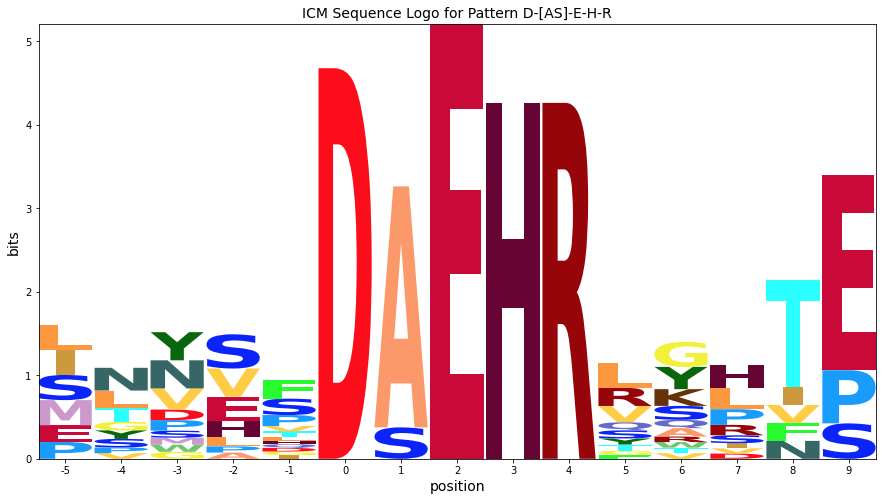

----------------------------------------------------------------------
r Pattern: D-[AS]-E-x-R-S
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.0,0.000000,0.080000,0.240000,0.000000,0.000000,0.000000,0.080000,0.000000,0.000000,0.000000,0.160000,0.000000,0.000000,0.000000,0.120000,0.320000,0.000000
1,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.296296,0.000000,0.000000,0.074074,0.111111,0.000000,0.296296,0.074074,0.148148,0.000000,0.000000
2,0.187500,0.0,0.0,0.000000,0.125000,0.062500,0.000000,0.062500,0.000000,0.250000,0.062500,0.000000,0.093750,0.000000,0.000000,0.093750,0.000000,0.000000,0.000000,0.062500
3,0.043478,0.0,0.0,0.000000,0.000000,0.434783,0.000000,0.000000,0.000000,0.000000,0.000000,0.239130,0.000000,0.000000,0.000000,0.108696,0.086957,0.086957,0.000000,0.000000
4,0.072727,0.0,0.0,0.036364,0.036364,0.109091,0.036364,0.000000,0.054545,0.036364,0.000000,0.127273,0.200000,0.000000,0.109091,0.000000,0.000000,0.000000,0.000000,0.181818
5,0.000000,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.581818,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.418182,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.0,0.000000,0.436364,0.000000,0.072727,0.054545,0.054545,0.000000,0.036364,0.036364,0.000000,0.000000,0.000000,0.072727,0.000000,0.000000,0.036364,0.200000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.637482,1.149115,-0.814359,-0.283845,1.101809,1.886080,-1.229397,-0.658240,-0.172813,-0.467557,-0.386938,-1.113920,-2.215458,1.623046,-1.229397,-2.297141,-2.052519,0.827187,3.393040,-0.776885
1,-1.700217,1.086379,-0.877095,-0.346580,-0.545889,-0.984010,-1.292133,-0.720976,-0.235549,1.054670,-0.449674,-1.176655,-0.693231,1.238382,-1.292133,0.810048,-0.530292,1.086379,0.160380,-0.839620
2,0.961287,0.940528,-1.022946,-0.492431,1.630188,0.455101,-1.437983,0.718136,-0.381400,0.908819,0.989438,-1.322506,-0.424044,-0.907469,-1.437983,-0.505728,-2.261106,-1.381400,0.014529,0.599491
3,-0.605060,0.596574,-1.366900,-0.836386,-1.035694,2.918502,-1.781938,-1.210781,-0.725354,-2.605060,-0.939479,1.918502,-2.767999,-1.251423,-1.781938,-0.264720,-0.283132,0.596574,-0.329426,-1.329426
4,-0.052519,0.412149,-1.551325,0.564152,0.364844,1.149115,-0.381400,-1.395206,1.090221,-1.204522,-1.123904,1.149115,0.632539,-1.435848,0.840993,-3.034107,-2.789485,-1.909779,-0.513850,1.945581
5,-2.374447,0.412149,4.256030,-1.020810,-1.220119,-1.658240,-1.966362,-1.395206,-0.909779,-2.789485,-1.123904,-1.850885,-2.952423,-1.435848,-1.966362,-3.034107,-2.789485,-1.909779,-0.513850,-1.513850
6,2.669947,0.412149,-1.551325,-1.020810,-1.220119,-1.658240,-1.966362,-1.395206,-0.909779,-2.789485,-1.123904,-1.850885,-2.952423,-1.435848,-1.966362,1.550855,-2.789485,-1.909779,-0.513850,-1.513850
7,-2.374447,0.412149,-1.551325,4.786545,-1.220119,-1.658240,-1.966362,-1.395206,-0.909779,-2.789485,-1.123904,-1.850885,-2.952423,-1.435848,-1.966362,-3.034107,-2.789485,-1.909779,-0.513850,-1.513850
8,-2.374447,0.412149,-1.551325,-1.020810,3.423737,-1.658240,0.355566,0.604794,1.090221,-2.789485,0.461059,-0.265923,-2.952423,-1.435848,-1.966362,-0.712179,-2.789485,-1.909779,1.071112,2.071112


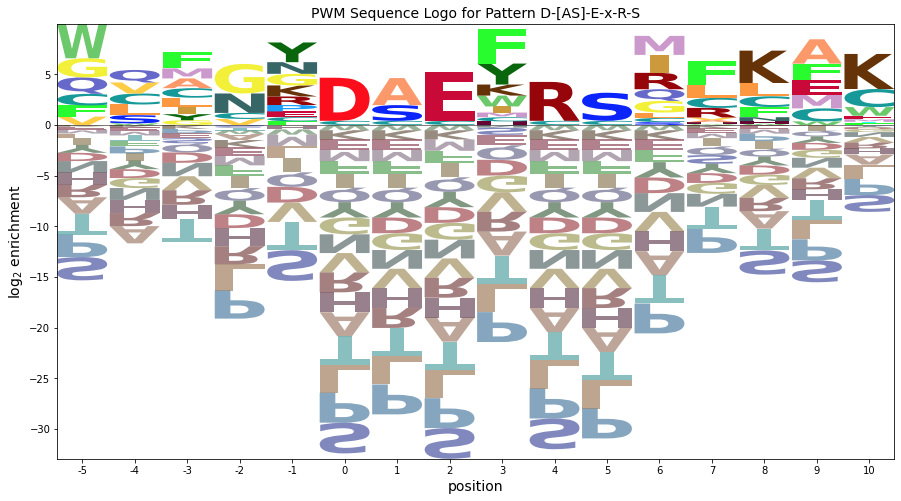

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.199477,0.598431,0.000000,0.000000,0.000000,0.199477,0.000000,0.000000,0.000000,0.398954,0.000000,0.000000,0.000000,0.299215,0.797908,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.378950,0.000000,0.000000,0.094738,0.142106,0.000000,0.378950,0.094738,0.189475,0.000000,0.000000
2,0.196621,0.0,0.000000,0.000000,0.131081,0.065540,0.000000,0.065540,0.000000,0.262162,0.065540,0.000000,0.098311,0.000000,0.000000,0.098311,0.000000,0.000000,0.000000,0.065540
3,0.089133,0.0,0.000000,0.000000,0.000000,0.891330,0.000000,0.000000,0.000000,0.000000,0.000000,0.490232,0.000000,0.000000,0.000000,0.222833,0.178266,0.178266,0.000000,0.000000
4,0.077712,0.0,0.000000,0.038856,0.038856,0.116568,0.038856,0.000000,0.058284,0.038856,0.000000,0.135996,0.213707,0.000000,0.116568,0.000000,0.000000,0.000000,0.000000,0.194279
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.511515,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.086401,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.986845,0.000000,0.164474,0.123356,0.123356,0.000000,0.082237,0.082237,0.000000,0.000000,0.000000,0.164474,0.000000,0.000000,0.082237,0.452304


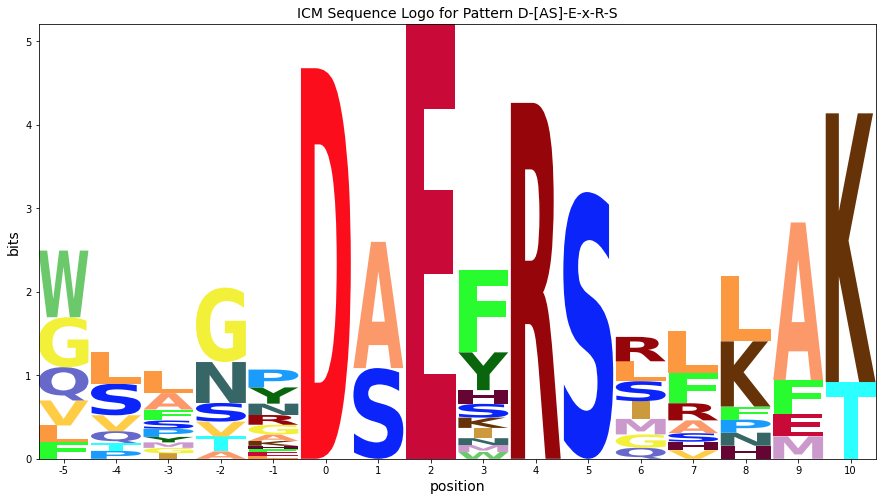

----------------------------------------------------------------------
s Pattern: L-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.081081,0.108108,0.081081,0.000000,0.000000,0.0,0.000000,0.594595,0.000000,0.135135,0.000000,0.000000
1,0.075000,0.0,0.000000,0.075000,0.000000,0.000000,0.000000,0.000000,0.000000,0.175000,0.000000,0.175000,0.300000,0.0,0.100000,0.000000,0.100000,0.000000,0.000000,0.000000
2,0.086957,0.0,0.086957,0.000000,0.000000,0.000000,0.065217,0.000000,0.000000,0.000000,0.152174,0.195652,0.260870,0.0,0.000000,0.086957,0.000000,0.000000,0.000000,0.065217
3,0.078431,0.0,0.000000,0.000000,0.000000,0.196078,0.058824,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.156863,0.333333,0.000000,0.098039,0.000000,0.078431
4,0.120690,0.0,0.000000,0.000000,0.103448,0.000000,0.000000,0.051724,0.000000,0.189655,0.068966,0.000000,0.155172,0.0,0.051724,0.155172,0.051724,0.000000,0.000000,0.051724
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.775862,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.224138,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.978518,0.808078,-1.155396,-0.624882,-0.824190,-1.262311,-1.570434,-0.999277,1.486150,-0.071628,1.272025,-1.454957,-2.556495,-1.039919,-1.570434,1.885384,-2.393556,1.071112,-0.117922,-1.117922
1,-0.052519,0.734077,-1.229397,1.301118,-0.898191,-1.336312,-1.644434,-1.073278,-0.587851,0.532443,-0.801976,1.471043,1.069945,-1.113920,0.677494,-2.712179,-0.145628,-1.587851,-0.191922,-1.191922
2,0.131906,0.596574,0.955028,-0.836386,-1.035694,-1.473816,0.218062,-1.210781,-0.725354,-2.605060,2.060521,1.655467,0.932441,-1.251423,-1.781938,-0.527754,-2.605060,-1.725354,-0.329426,0.670574
3,0.026553,0.491221,-1.472253,-0.941739,-1.141047,1.880263,0.112709,-1.316134,-0.830707,-2.710413,-1.044832,-1.771814,-2.873352,-1.356776,1.282634,1.214890,-2.710413,0.754255,-0.434779,0.887149
4,0.568969,0.355566,-1.607908,-1.077394,1.530652,-1.714824,-2.022946,0.548211,-0.966362,0.738894,1.141441,-1.907469,0.312921,-1.492431,-0.022946,0.231238,-0.846068,-1.966362,-0.570434,0.429566
5,-2.431031,0.355566,-1.607908,-1.077394,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,3.036575,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,-3.090691,-2.846068,-1.966362,-0.570434,-1.570434
6,-2.431031,0.355566,4.274735,-1.077394,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,-3.090691,-2.846068,-1.966362,-0.570434,-1.570434
7,3.092531,0.355566,-1.607908,-1.077394,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,0.716664,-2.846068,-1.966362,-0.570434,-1.570434
8,-2.431031,0.355566,-1.607908,4.805249,-1.276703,-1.714824,-2.022946,-1.451789,-0.966362,-2.846068,-1.180487,-1.907469,-3.009007,-1.492431,-2.022946,-3.090691,-2.846068,-1.966362,-0.570434,-1.570434


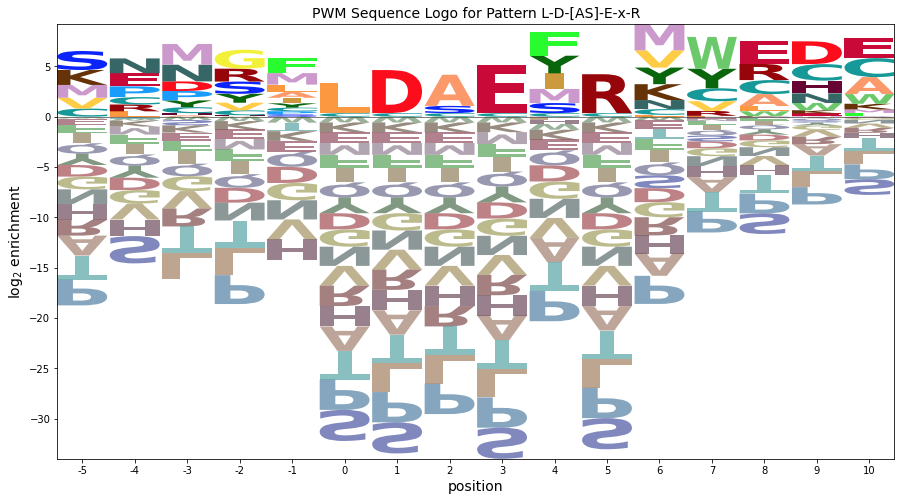

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.156432,0.208576,0.156432,0.000000,0.000000,0.0,0.000000,1.147169,0.000000,0.260720,0.000000,0.000000
1,0.088101,0.0,0.000000,0.088101,0.000000,0.000000,0.000000,0.000000,0.000000,0.205569,0.000000,0.205569,0.352403,0.0,0.117468,0.000000,0.117468,0.000000,0.000000,0.000000
2,0.111375,0.0,0.111375,0.000000,0.000000,0.000000,0.083531,0.000000,0.000000,0.000000,0.194906,0.250594,0.334125,0.0,0.000000,0.111375,0.000000,0.000000,0.000000,0.083531
3,0.111576,0.0,0.000000,0.000000,0.000000,0.278941,0.083682,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.223152,0.474199,0.000000,0.139470,0.000000,0.111576
4,0.089074,0.0,0.000000,0.000000,0.076349,0.000000,0.000000,0.038175,0.000000,0.139974,0.050900,0.000000,0.114524,0.0,0.038175,0.114524,0.038175,0.000000,0.000000,0.038175
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.439334,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,2.280154,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.658711,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


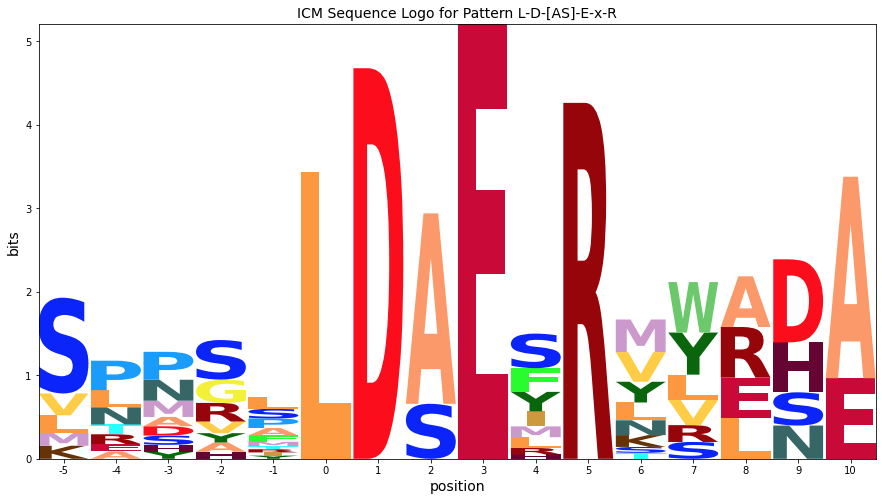

----------------------------------------------------------------------
t Pattern: P-x-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.173913,0.173913,0.000000,0.130435,0.000000,0.000000,0.000000,0.000000,0.000000,0.304348,0.000000,0.217391,0.000000,0.000000
2,0.068966,0.000000,0.000000,0.068966,0.000000,0.000000,0.000000,0.000000,0.000000,0.137931,0.000000,0.000000,0.241379,0.103448,0.068966,0.137931,0.068966,0.103448,0.000000,0.000000
3,0.088889,0.000000,0.000000,0.000000,0.000000,0.044444,0.066667,0.044444,0.000000,0.133333,0.066667,0.000000,0.111111,0.000000,0.044444,0.088889,0.088889,0.044444,0.000000,0.177778
4,0.125000,0.000000,0.000000,0.000000,0.142857,0.035714,0.000000,0.000000,0.000000,0.107143,0.035714,0.000000,0.000000,0.000000,0.160714,0.196429,0.035714,0.000000,0.000000,0.160714
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.035714,0.285714,0.000000,0.000000,0.000000,0.035714,0.000000,0.160714,0.035714,0.035714,0.107143,0.035714,0.000000,0.035714,0.035714,0.000000,0.196429,0.000000
7,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.714286,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285714,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.605060,2.181536,0.218062,0.748577,0.549268,0.111147,-0.196975,0.374181,0.859608,-1.020098,0.645483,-0.081498,-1.183036,0.333539,-0.196975,0.320243,-1.020098,-0.140392,1.255537,0.255537
1,-1.571893,1.214703,-0.748771,-0.218256,-0.417565,-0.855686,1.158120,1.729276,-0.107225,0.013069,-0.321350,-1.048331,-2.149869,-0.633294,-1.163808,0.768447,-1.986931,1.477738,0.288704,-0.711296
2,-0.175376,1.026258,-0.937216,1.178261,-0.606010,-1.044131,-1.352254,-0.781097,-0.295670,0.146552,-0.509795,-1.236776,0.661686,1.178261,0.232709,-0.098070,-0.590413,0.704330,0.100259,-0.899741
3,0.153932,0.618600,-1.344874,-0.814359,-1.013668,0.133173,0.240088,0.396208,-0.703328,0.224321,1.082547,-1.644434,-0.161010,-1.229397,-0.174949,-0.505728,-0.261106,-0.118365,-0.307399,1.862526
4,0.606444,0.393040,-1.570434,-1.039919,1.930697,-0.092386,-1.985471,-1.414315,-0.928888,-0.001239,0.441950,-1.869994,-2.971532,-1.454957,1.336457,0.531747,-1.223631,-1.928888,-0.532959,1.788969
5,-2.393556,0.393040,-1.570434,-1.039919,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,2.861358,-1.454957,-1.985471,-3.053216,-2.808593,-1.928888,-0.532959,-1.532959
6,-2.393556,0.393040,0.014529,3.047544,-1.239228,-1.677349,-1.985471,0.170648,-0.928888,0.513335,0.441950,-0.285032,-0.164177,0.130006,-1.985471,-1.468253,-1.223631,-1.928888,3.052003,-1.532959
7,-2.393556,0.393040,4.262456,-1.039919,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,-1.454957,-1.985471,-3.053216,-2.808593,-1.928888,-0.532959,-1.532959
8,2.963996,0.393040,-1.570434,-1.039919,-1.239228,-1.677349,-1.985471,-1.414315,-0.928888,-2.808593,-1.143013,-1.869994,-2.971532,-1.454957,-1.985471,1.034247,-2.808593,-1.928888,-0.532959,-1.532959


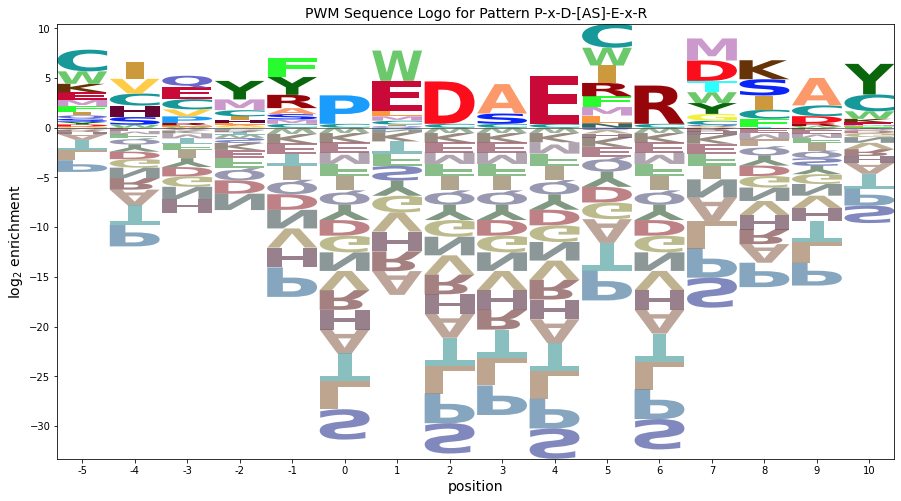

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.292133,0.292133,0.000000,0.219100,0.000000,0.000000,0.000000,0.000000,0.000000,0.511232,0.000000,0.365166,0.000000,0.000000
2,0.053782,0.000000,0.000000,0.053782,0.000000,0.000000,0.000000,0.000000,0.000000,0.107563,0.000000,0.000000,0.188235,0.080672,0.053782,0.107563,0.053782,0.080672,0.000000,0.000000
3,0.051873,0.000000,0.000000,0.000000,0.000000,0.025936,0.038905,0.025936,0.000000,0.077809,0.038905,0.000000,0.064841,0.000000,0.025936,0.051873,0.051873,0.025936,0.000000,0.103746
4,0.144902,0.000000,0.000000,0.000000,0.165603,0.041401,0.000000,0.000000,0.000000,0.124202,0.041401,0.000000,0.000000,0.000000,0.186303,0.227704,0.041401,0.000000,0.000000,0.186303
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.276395,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.059010,0.472082,0.000000,0.000000,0.000000,0.059010,0.000000,0.265546,0.059010,0.059010,0.177031,0.059010,0.000000,0.059010,0.059010,0.000000,0.324556,0.000000
7,0.000000,0.000000,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,2.001983,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800793,0.000000,0.000000,0.000000,0.000000


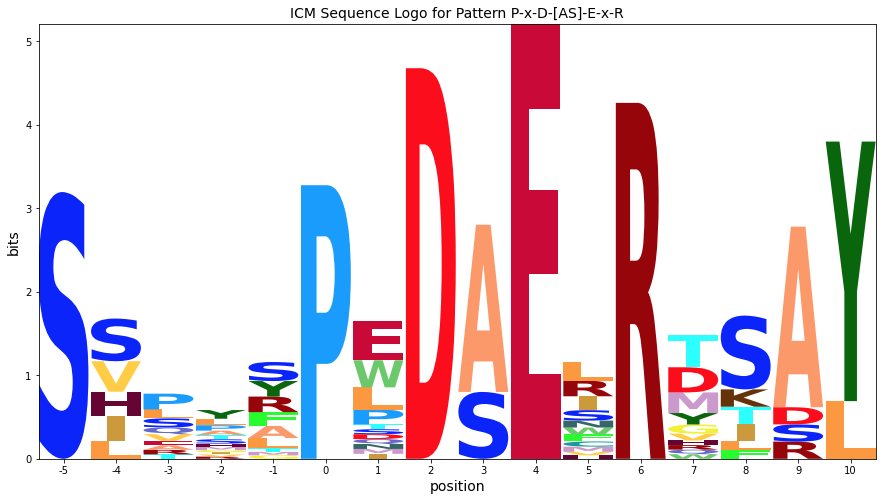

----------------------------------------------------------------------
u Pattern: D-[AS]-E-W-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.222222,0.000000,0.000000,0.000000,0.222222,0.000000,0.000000,0.000000,0.222222,0.000000,0.333333,0.000000,0.000000,0.000000
1,0.062500,0.0,0.000000,0.187500,0.000000,0.000000,0.062500,0.062500,0.000000,0.062500,0.000000,0.250000,0.000000,0.000000,0.062500,0.000000,0.062500,0.000000,0.000000,0.187500
2,0.111111,0.0,0.000000,0.000000,0.111111,0.000000,0.288889,0.000000,0.000000,0.000000,0.000000,0.044444,0.133333,0.000000,0.155556,0.000000,0.044444,0.111111,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.163265,0.102041,0.040816,0.000000,0.000000,0.244898,0.000000,0.000000,0.081633,0.000000,0.122449,0.204082,0.040816,0.000000,0.000000,0.000000
4,0.092593,0.0,0.000000,0.000000,0.000000,0.259259,0.000000,0.000000,0.000000,0.000000,0.129630,0.129630,0.000000,0.000000,0.000000,0.074074,0.148148,0.000000,0.092593,0.074074
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.700000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.003609,1.782987,-0.180487,0.350028,0.150719,-0.287402,0.989438,-0.024368,0.461059,-1.418647,1.831897,-0.480047,-1.581586,-0.065010,0.989438,-1.663269,0.581353,-0.538941,0.856987,-0.143013
1,-0.261106,0.940528,-1.022946,2.314924,-0.691740,-1.129861,0.146979,0.718136,-0.381400,-0.676143,-0.595525,1.847419,-2.424044,-0.907469,0.146979,-2.505728,-0.676143,-1.381400,0.014529,1.821884
2,0.416966,0.618600,-1.344874,-0.814359,1.571294,-1.451789,2.047443,-1.188755,-0.703328,-2.583034,-0.917453,-0.059472,0.061383,-1.229397,1.240088,-2.827656,-0.998071,0.881635,-0.307399,-1.307399
3,-2.254153,0.532443,-1.431031,-0.900516,2.070100,1.047017,-0.261106,-1.274911,-0.789485,1.031249,-1.003609,-1.730591,-0.510201,-1.315553,0.961287,0.545619,-1.084228,-1.789485,-0.393556,-1.393556
4,0.229881,0.431515,-1.531960,-1.001445,-1.200754,2.268016,-1.946997,-1.375840,-0.890414,-2.770119,1.895462,1.168480,-2.933058,-1.416482,-1.946997,-0.692814,0.399806,-1.890414,2.090478,0.827443
5,-2.467557,0.319040,4.286303,-1.113920,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,-3.127216,-2.882594,-2.002888,-0.606960,-1.606960
6,2.958708,0.319040,-1.644434,-1.113920,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,1.120711,-2.882594,-2.002888,-0.606960,-1.606960
7,-2.467557,0.319040,-1.644434,4.816818,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,-3.127216,-2.882594,-2.002888,-0.606960,-1.606960
8,-2.467557,0.319040,-1.644434,-1.113920,-1.313228,-1.751350,-2.059472,-1.488315,-1.002888,-2.882594,-1.217013,-1.943995,-3.045533,-1.528957,-2.059472,-3.127216,-2.882594,-2.002888,5.323778,-1.606960


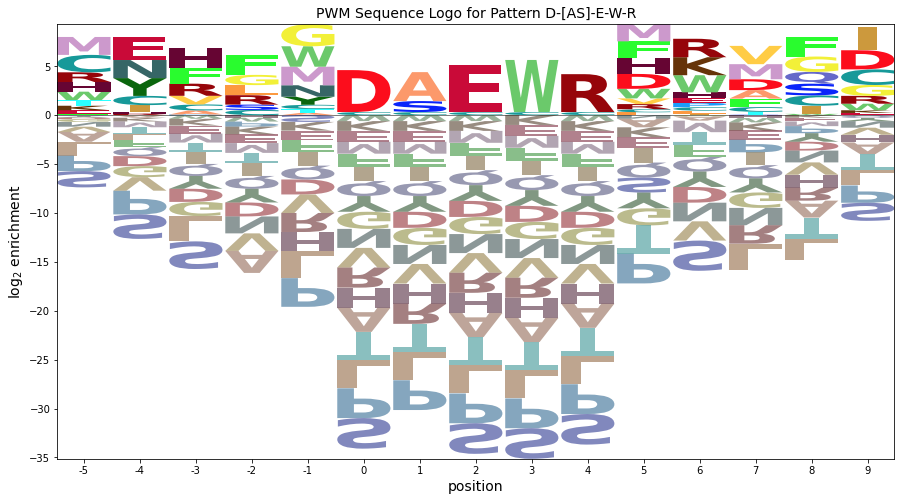

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.488968,0.000000,0.000000,0.000000,0.488968,0.000000,0.000000,0.000000,0.488968,0.000000,0.733453,0.000000,0.000000,0.000000
1,0.097195,0.0,0.000000,0.291586,0.000000,0.000000,0.097195,0.097195,0.000000,0.097195,0.000000,0.388781,0.000000,0.000000,0.097195,0.000000,0.097195,0.000000,0.000000,0.291586
2,0.151642,0.0,0.000000,0.000000,0.151642,0.000000,0.394270,0.000000,0.000000,0.000000,0.000000,0.060657,0.181971,0.000000,0.212299,0.000000,0.060657,0.151642,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.181468,0.113417,0.045367,0.000000,0.000000,0.272201,0.000000,0.000000,0.090734,0.000000,0.136101,0.226835,0.045367,0.000000,0.000000,0.000000
4,0.141340,0.0,0.000000,0.000000,0.000000,0.395752,0.000000,0.000000,0.000000,0.000000,0.197876,0.197876,0.000000,0.000000,0.000000,0.113072,0.226144,0.000000,0.141340,0.113072
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.942628,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.832555,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.714968,0.000000


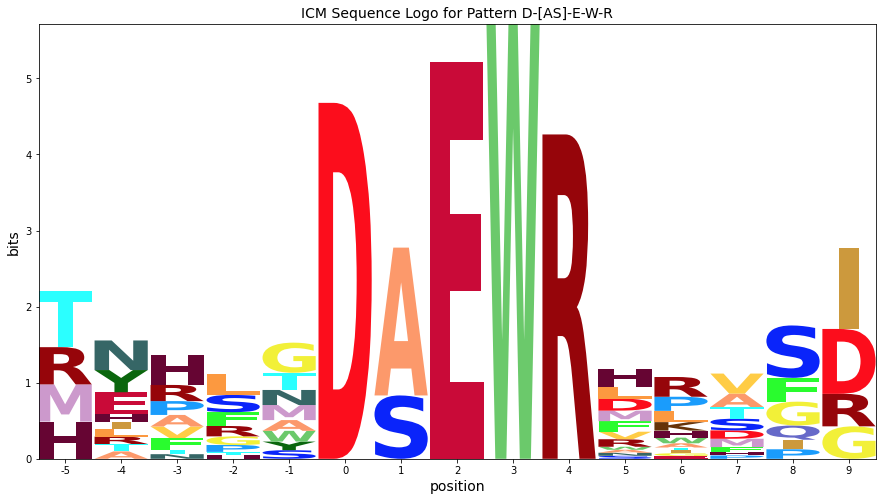

----------------------------------------------------------------------
v Pattern: D-[AS]-E-x-R-L
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.058824,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.352941,0.058824,0.137255,0.333333,0.000000,0.058824,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.263158,0.0,0.000000,0.105263,0.000000,0.052632,0.315789,0.000000,0.000000,0.000000,0.035088,0.000000,0.140351,0.087719,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.035088,0.105263,0.263158,0.000000,0.000000,0.000000,0.087719,0.315789,0.000000,0.000000,0.140351,0.000000,0.052632,0.000000,0.000000
3,0.112903,0.0,0.000000,0.000000,0.048387,0.000000,0.290323,0.000000,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.048387,0.177419,0.000000,0.000000,0.000000,0.290323
4,0.194805,0.0,0.000000,0.038961,0.025974,0.000000,0.025974,0.000000,0.000000,0.077922,0.038961,0.090909,0.000000,0.000000,0.000000,0.259740,0.142857,0.103896,0.000000,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.813953,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.186047,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.034884,0.000000,0.139535,0.000000,0.000000,0.174419,0.000000,0.000000,0.000000,0.000000,0.174419,0.000000,0.023256,0.000000,0.093023,0.360465


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.295376,0.491221,-1.472253,-0.941739,-1.141047,-1.579169,-1.887291,-1.316134,-0.830707,1.537514,0.955168,1.228186,1.296573,-1.356776,0.112709,-2.955035,-2.710413,-1.830707,-0.434779,-1.434779
1,1.587585,0.374181,-1.589293,1.748577,-1.258087,0.303792,2.243597,-1.433174,-0.947747,-2.827452,0.423091,-1.888853,0.179534,1.111147,-2.004330,-3.072075,-2.827452,-1.947747,-0.551818,-1.551818
2,-2.412415,0.374181,-1.589293,-1.058778,-1.258087,-0.111245,0.803025,2.566826,-0.947747,-2.827452,-1.161872,0.696109,1.257536,-1.473816,-2.004330,0.097850,-2.827452,0.052253,-0.551818,-1.551818
3,0.496820,0.283416,-1.680058,-1.149544,0.651148,-1.786973,2.152832,-1.523939,-1.038512,-1.333255,-1.252637,-1.979619,-3.081157,-1.564581,-0.095096,0.422122,-2.918218,-2.038512,-0.642584,2.605344
4,1.254459,0.041055,-1.922419,0.608096,-0.006251,-2.029334,-0.752494,-1.766300,-1.280873,-0.353224,0.505002,0.778021,-3.323517,-1.806942,-2.337457,0.987116,0.424384,0.889052,-0.884944,-1.884944
5,-2.873549,-0.086953,4.392517,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952
6,3.276198,-0.086953,-2.050427,-1.519912,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,0.554254,-3.288586,-2.408881,-1.012952,-2.012952
7,-2.873549,-0.086953,-2.050427,4.923032,-1.719221,-2.157342,-2.465464,-1.894307,-1.408881,-3.288586,-1.623005,-2.349987,-3.451525,-1.934949,-2.465464,-3.533209,-3.288586,-2.408881,-1.012952,-2.012952
8,-2.873549,-0.086953,-2.050427,-1.519912,0.280779,-2.157342,1.234976,-1.894307,-1.408881,0.711414,-1.623005,-2.349987,-3.451525,-1.934949,1.534536,-3.533209,-1.703624,-2.408881,2.156973,2.987048


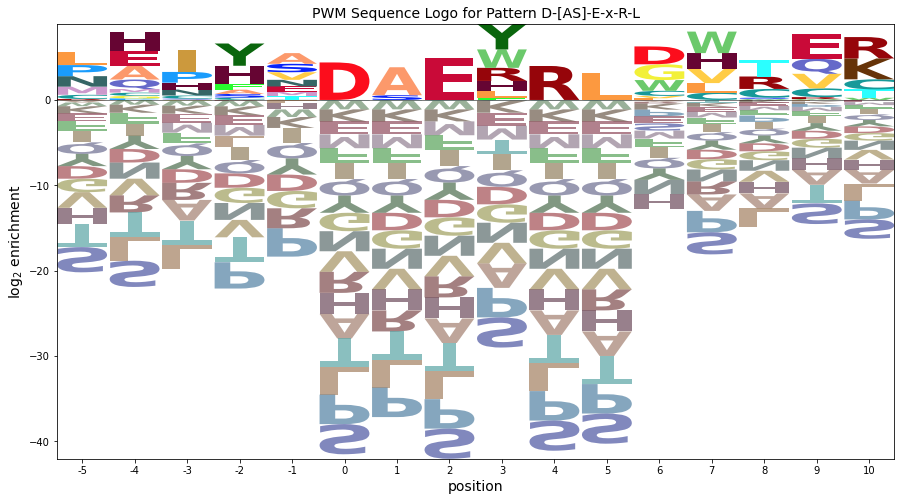

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.088911,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.533463,0.088911,0.207458,0.503827,0.000000,0.088911,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.456819,0.0,0.000000,0.182728,0.000000,0.091364,0.548183,0.000000,0.000000,0.000000,0.060909,0.000000,0.243637,0.152273,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.052731,0.158193,0.395481,0.000000,0.000000,0.000000,0.131827,0.474578,0.000000,0.000000,0.210923,0.000000,0.079096,0.000000,0.000000
3,0.197727,0.0,0.000000,0.000000,0.084740,0.000000,0.508441,0.000000,0.000000,0.056493,0.000000,0.000000,0.000000,0.000000,0.084740,0.310714,0.000000,0.000000,0.000000,0.508441
4,0.172242,0.0,0.000000,0.034448,0.022966,0.000000,0.022966,0.000000,0.000000,0.068897,0.034448,0.080380,0.000000,0.000000,0.000000,0.229656,0.126311,0.091862,0.000000,0.000000
5,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,2.473211,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.565305,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.069916,0.000000,0.279666,0.000000,0.000000,0.349582,0.000000,0.000000,0.000000,0.000000,0.349582,0.000000,0.046611,0.000000,0.186444,0.722470


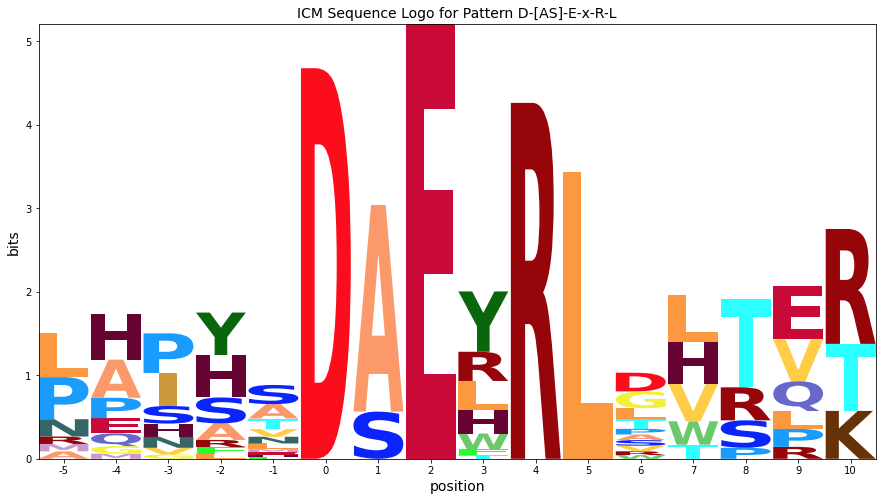

----------------------------------------------------------------------
w Pattern: S-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.057143,0.428571,0.00000,0.000000,0.200000,0.000000,0.085714,0.057143,0.000000,0.085714,0.000000,0.000000,0.085714,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.159091,0.000000,0.000000,0.00000,0.136364,0.113636,0.000000,0.340909,0.000000,0.000000,0.204545,0.045455,0.000000,0.000000,0.000000
2,0.369565,0.0,0.000000,0.000000,0.043478,0.065217,0.000000,0.043478,0.00000,0.000000,0.152174,0.000000,0.000000,0.000000,0.043478,0.065217,0.086957,0.000000,0.000000,0.130435
3,0.000000,0.0,0.065217,0.000000,0.000000,0.000000,0.043478,0.326087,0.00000,0.000000,0.000000,0.043478,0.152174,0.000000,0.152174,0.000000,0.108696,0.043478,0.000000,0.065217
4,0.000000,0.0,0.098039,0.000000,0.000000,0.000000,0.058824,0.000000,0.00000,0.098039,0.000000,0.000000,0.039216,0.000000,0.000000,0.156863,0.039216,0.000000,0.000000,0.509804
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.784615,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.215385,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.926988,0.859608,-1.103866,-0.573351,-0.772660,-1.210781,0.066059,3.052253,-0.462320,-2.342026,2.323555,-1.403426,-0.504964,0.596574,-1.518903,-0.586648,-2.342026,-1.462320,1.933609,-1.066391
1,-2.145628,0.640968,-1.322506,-0.791991,-0.991300,1.570579,-1.737544,-1.166387,-0.680960,0.246689,1.689878,-1.622066,1.276395,-1.207029,-1.737544,0.516640,-0.975703,-1.680960,-0.285032,-1.285032
2,1.979902,0.596574,-1.366900,-0.836386,0.549268,0.526184,-1.781938,0.374181,-0.725354,-2.605060,2.060521,-1.666461,-2.767999,-1.251423,-0.196975,-0.849682,-0.283132,-1.725354,-0.329426,1.477929
3,-2.190023,0.596574,0.633100,-0.836386,-1.035694,-1.473816,-0.196975,2.789219,-0.725354,-2.605060,-0.939479,-0.081498,0.232001,-1.251423,1.218062,-2.849682,-0.020098,-0.140392,-0.329426,0.670574
4,-2.295376,0.491221,1.112709,-0.941739,-1.141047,-1.579169,0.112709,-1.316134,-0.830707,-0.125451,-1.044832,-1.771814,-1.288389,-1.356776,-1.887291,0.214890,-1.125451,-1.830707,-0.434779,3.320109
5,-2.555019,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,2.829715,-2.970057,-2.090351,-0.694422,-1.694422
6,-2.555019,0.231577,4.312497,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422
7,3.145420,0.231577,-1.731897,-1.201382,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,0.692211,-2.970057,-2.090351,-0.694422,-1.694422
8,-2.555019,0.231577,-1.731897,4.843012,-1.400691,-1.838812,-2.146935,-1.575778,-1.090351,-2.970057,-1.304476,-2.031457,-3.132995,-1.616420,-2.146935,-3.214679,-2.970057,-2.090351,-0.694422,-1.694422


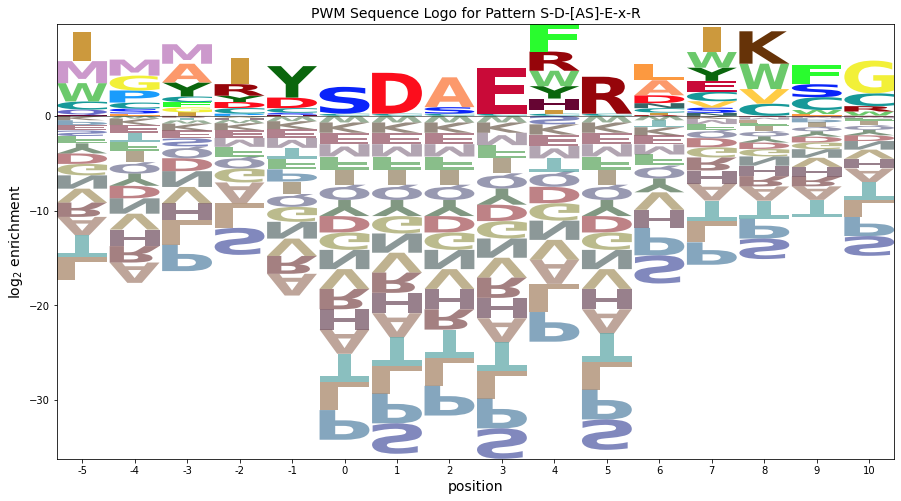

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.130453,0.978395,0.000000,0.000000,0.456584,0.000000,0.195679,0.130453,0.000000,0.195679,0.000000,0.000000,0.195679,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.211953,0.000000,0.000000,0.000000,0.181674,0.151395,0.000000,0.454186,0.000000,0.000000,0.272511,0.060558,0.000000,0.000000,0.000000
2,0.553427,0.0,0.000000,0.000000,0.065109,0.097664,0.000000,0.065109,0.000000,0.000000,0.227882,0.000000,0.000000,0.000000,0.065109,0.097664,0.130218,0.000000,0.000000,0.195327
3,0.000000,0.0,0.095715,0.000000,0.000000,0.000000,0.063810,0.478575,0.000000,0.000000,0.000000,0.063810,0.223335,0.000000,0.223335,0.000000,0.159525,0.063810,0.000000,0.095715
4,0.000000,0.0,0.199619,0.000000,0.000000,0.000000,0.119771,0.000000,0.000000,0.199619,0.000000,0.000000,0.079848,0.000000,0.000000,0.319390,0.079848,0.000000,0.000000,1.038018
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194712,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,2.322964,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.637677,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.208009,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


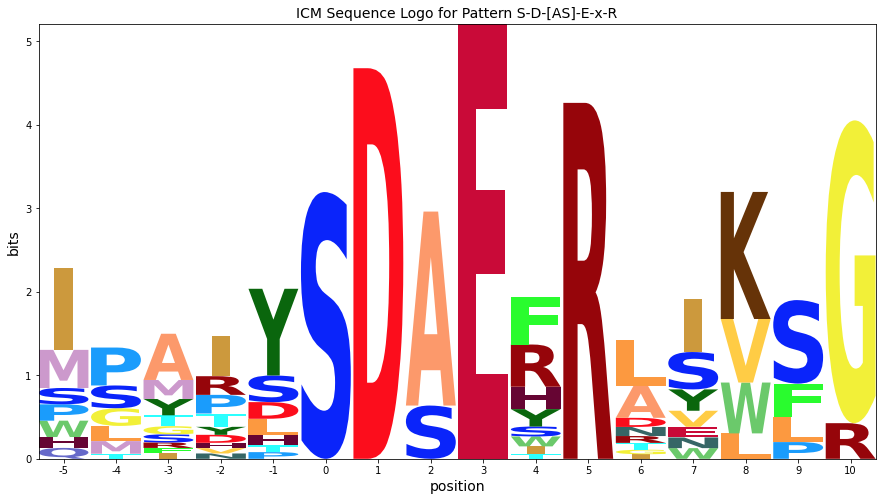

----------------------------------------------------------------------
x Pattern: L-x-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.666667,0.333333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.148148,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.370370,0.370370,0.000000,0.111111,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.275862,0.000000,0.000000,0.000000,0.0,0.206897,0.000000,0.000000,0.310345,0.000000,0.000000,0.206897,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.0,0.115385,0.000000,0.038462,0.000000,0.000000,0.153846,0.0,0.192308,0.173077,0.096154,0.000000,0.000000,0.000000,0.096154,0.000000,0.057692,0.000000,0.076923
4,0.000000,0.0,0.045455,0.000000,0.075758,0.257576,0.136364,0.000000,0.0,0.000000,0.000000,0.045455,0.181818,0.030303,0.030303,0.136364,0.000000,0.000000,0.000000,0.060606
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.045455,0.0,0.000000,0.000000,0.121212,0.060606,0.030303,0.000000,0.0,0.166667,0.075758,0.363636,0.000000,0.000000,0.000000,0.075758,0.030303,0.000000,0.030303,0.000000
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.712121,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.287879,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.145628,1.640968,-0.322506,3.377934,2.330628,-0.429421,-0.737544,-0.166387,0.319040,-1.560666,0.104915,-0.622066,-1.723605,-0.207029,-0.737544,-1.805288,-1.560666,-0.680960,0.714968,-0.285032
1,0.621711,1.086379,-0.877095,-0.346580,-0.545889,-0.984010,-1.292133,-0.720976,-0.235549,-2.115255,-0.449674,-1.176655,-2.278193,-0.761618,2.167299,1.099554,-2.115255,0.764451,0.160380,-0.839620
2,-1.760338,1.026258,-0.937216,-0.406701,2.563915,-1.044131,-1.352254,-0.781097,-0.295670,0.631979,-0.509795,-1.236776,0.983614,-0.821739,-1.352254,0.387357,-2.175376,-1.295670,0.100259,-0.899741
3,-2.315553,0.471043,1.314924,-0.961916,0.423737,-1.599346,-1.907469,1.833613,-0.850885,0.728841,2.256918,0.792971,-2.893530,-1.376954,-1.907469,-0.390251,-2.730591,0.149115,-0.454957,0.866972
4,-2.571893,0.214703,0.251229,-1.218256,1.167397,2.314239,1.158120,-1.592652,-1.107225,-2.986931,-1.321350,-0.048331,0.550570,-0.048331,-0.578846,0.090375,-2.986931,-2.107225,-0.711296,0.610632
5,-2.571893,0.214703,-1.748771,-1.218256,-1.417565,-1.855686,-2.163808,-1.592652,-1.107225,3.079158,-1.321350,-2.048331,-3.149869,-1.633294,-2.163808,-3.231553,-2.986931,-2.107225,-0.711296,-1.711296
6,-0.571893,0.214703,-1.748771,-1.218256,1.752360,0.466242,-0.578846,-1.592652,-1.107225,0.598032,1.263613,2.595525,-3.149869,-1.633294,-2.163808,-0.646591,-1.401968,-2.107225,0.873666,-1.711296
7,-2.571893,0.214703,4.317318,-1.218256,-1.417565,-1.855686,-2.163808,-1.592652,-1.107225,-2.986931,-1.321350,-2.048331,-3.149869,-1.633294,-2.163808,-3.231553,-2.986931,-2.107225,-0.711296,-1.711296
8,3.013069,0.214703,-1.748771,-1.218256,-1.417565,-1.855686,-2.163808,-1.592652,-1.107225,-2.986931,-1.321350,-2.048331,-3.149869,-1.633294,-2.163808,1.090375,-2.986931,-2.107225,-0.711296,-1.711296


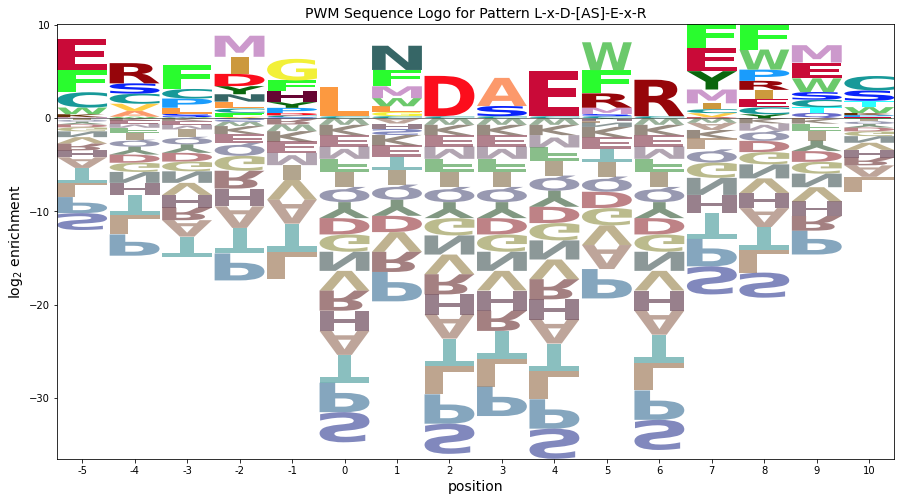

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,2.815518,1.407759,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.294967,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.737418,0.737418,0.000000,0.221225,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.494924,0.000000,0.000000,0.000000,0.0,0.371193,0.000000,0.000000,0.556789,0.000000,0.000000,0.371193,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.0,0.154391,0.000000,0.051464,0.000000,0.000000,0.205854,0.0,0.257318,0.231586,0.128659,0.000000,0.000000,0.000000,0.128659,0.000000,0.077195,0.000000,0.102927
4,0.000000,0.0,0.053076,0.000000,0.088460,0.300763,0.159227,0.000000,0.0,0.000000,0.000000,0.053076,0.212303,0.035384,0.035384,0.159227,0.000000,0.000000,0.000000,0.070768
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,3.439334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.066313,0.0,0.000000,0.000000,0.176835,0.088418,0.044209,0.000000,0.0,0.243148,0.110522,0.530506,0.000000,0.000000,0.000000,0.110522,0.044209,0.000000,0.044209,0.000000
7,0.000000,0.0,4.677494,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.992874,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.805630,0.000000,0.000000,0.000000,0.000000


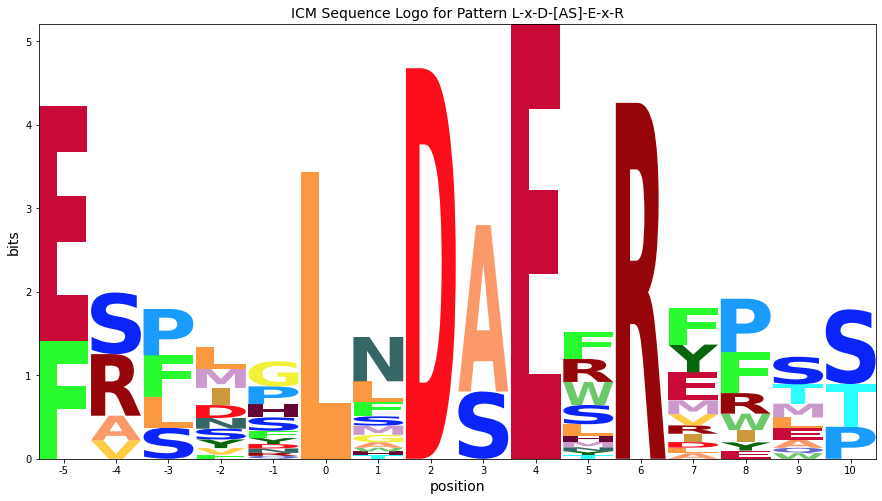

In [13]:
begin_parse = False
pattern = ''

with open('SOL1A.txt.15.pat', 'r') as f:
  while True:
    line = f.readline().strip()

    # Stop reading the file
    if line == 'PATTERN MATCHES:':
      break

    if begin_parse:
      tokens = line.split() # Split line into array of tokens
      if len(tokens) >= 5:
        # Process each array (line of file)
        if len(tokens[0]) == 1:
          pattern = tokens[5]
          print('-' * 70)
          print('{} Pattern: {}'.format(tokens[0], pattern))
        elif len(tokens) >= 6:
          label = tokens[0].split('_')
          last_num = label[len(label) - 1]
          obs_freq.append(int(last_num))
          if len(tokens) == 6:
            if tokens[4][:1].isupper():
              pattern_seq = tokens[4]
              flank2 = tokens[5]
              flank1_seq_list.append('')
              pf2_seq_list.append(pattern_seq + flank2)
            else:
              flank1 = tokens[4]
              pattern_seq = tokens[5]
              flank1_seq_list.append(flank1)
              pf2_seq_list.append(pattern_seq + '')
          elif len(tokens) == 7:
            flank1 = tokens[4]
            pattern_seq = tokens[5]
            flank2 = tokens[6]
            flank1_seq_list.append(flank1)
            pf2_seq_list.append(pattern_seq + flank2)
      # Reached end of a pattern block
      elif len(tokens) == 0 and len(flank1_seq_list) != 0:
        # Begin frequency analysis for pattern block
        padded1 = pad_sequence(flank1_seq_list, 'left')
        padded2 = pad_sequence(pf2_seq_list, 'right')
        combined_sequences = [x + padded2[i] for (i, x) in enumerate(padded1)]
        freq = frequency_matrix(combined_sequences)
        prob = probability_matrix(freq, 0)
        display_matrix(prob, 'Position Probability Matrix')
        prob_pseudo = probability_matrix(freq)
        weight = weight_matrix(prob_pseudo)
        display_matrix(weight, 'Position Weight Matrix')
        display_sequence_logo(weight, 'PWM', pattern)
        info = info_content_matrix(prob)
        display_matrix(info, 'Information Content Matrix')
        display_sequence_logo(info, 'ICM', pattern)
        # Clear data structures for next pattern block
        x_axis.clear()
        obs_freq.clear()
        flank1_seq_list.clear()
        pf2_seq_list.clear()
        
    # Start processing lines after this line is reached
    if line == 'Best patterns with alignments:':
      f.readline()
      begin_parse = True